# Outline

1. Spike Frequency Analysis
2. Multiple Features Clustering Analysis
3. Deep Learning Analysis
   

## Spike Frequency Analysis

In [85]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import mat73
import matplotlib.pyplot as plt
from scipy.io import loadmat
from tslearn.clustering import TimeSeriesKMeans
from datetime import datetime
from tslearn.preprocessing import TimeSeriesScalerMinMax

In [70]:
def create_ssd_artifact_array(ssd_files_location, CPC_file_location):
    clinical_data = pd.read_csv(CPC_file_location)
    
    array, array_lookup = [], []
    
    files = [f for f in os.listdir(ssd_files_location) if f.endswith('.mat')]
    files.sort()
    
    cur_patient = None
    cur_idx = -1
    
    for file_name in files:
        file_name, _ = os.path.splitext(file_name)
        file_parts = file_name.split('_')
        patient_id = 'ICARE_' + file_parts[4]
        if patient_id not in clinical_data['pat_ICARE'].values:
            continue
        
        if patient_id != cur_patient:
            if cur_idx >= 0:
                array.append(array_pat)

            array_pat = []
            cur_patient = patient_id
            cur_idx += 1
            
            array_lookup.append([None] * 7)  # Initialize with placeholders
            array_lookup[cur_idx][0] = cur_patient
            
            idx_match = clinical_data['pat_ICARE'] == cur_patient
            array_lookup[cur_idx][1] = clinical_data.loc[idx_match, 'time_to_CA(seconds)'].values[0]
            cpc = clinical_data.loc[idx_match, 'cpc'].values[0]
            age = clinical_data.loc[idx_match, 'age'].values[0]
            sex = clinical_data.loc[idx_match, 'sex'].values[0]
            vfib = clinical_data.loc[idx_match, 'vfib'].values[0]
            
            base_file_date_str = file_parts[5] + ' ' + file_parts[6]
            base_file_date = datetime.strptime(base_file_date_str, "%Y%m%d %H%M%S")
            array_lookup[cur_idx][2] = base_file_date
            
            array_lookup[cur_idx][3] = cpc
            array_lookup[cur_idx][4] = age
            array_lookup[cur_idx][5] = sex
            array_lookup[cur_idx][6] = vfib
        
        full_filename = os.path.join(ssd_files_location, file_name)
        file_import = loadmat(full_filename)
        
        if 'Spike_freq_approaches' not in file_import:
            seiz_predic = [-1]
        else:
            seiz_predic = [approach[0, 9] for approach in file_import['Spike_freq_approaches'][0]]
        array_pat.extend(seiz_predic)
    
    array.append(array_pat)
    
    return array, array_lookup

def create_array_FEATURES(feature_files_location, patient_id, cohort_type):
    feature_file_dir = os.path.join(feature_files_location, cohort_type)
    patient_all_files = [f for f in os.listdir(feature_file_dir) if patient_id in f]
    patient_all_files.sort()

    # Load feature names
    feature_file = "new_icare_features_new/BWH/feature_ICARE_0520_20140131_111546.mat"
    mat_data = mat73.loadmat(feature_file)
    feature_names = [name for name in mat_data['x'] if 'org_set' not in name]
    
    # Initialize features dictionary
    features_array = {}
    for feat_name in feature_names:
        features_array[feat_name] = []

    # Process each file
    for file_name in patient_all_files: 
        try:
            data = mat73.loadmat(os.path.join(feature_file_dir, file_name))
            x = data['x']
        except Exception as e:
            print(f"Error loading {file_name}: {e}")
            return None
        
        # Append features
        for feat_name in feature_names:
            if feat_name not in x:
                return None
            if type(x[feat_name]) != np.ndarray:
                continue
            current_feature = x[feat_name].flatten()
            features_array[feat_name].extend(current_feature)
    
    return features_array
# Directory containing the .mat files
feature_directory = "new_icare_features_new"
ssd_directory = "Spike_freq"
clinical_data = "Data/ICARE_clinical.csv"
patient_directory = "Data/patient_directory_mapping.csv"
ID_converter = "Data/ICARE_ID_conversion.csv"
patient_cohort = "Data/uniqueID_SSD.csv"
# List to hold EEG data grouped by patient
all_feature_data = []

array, array_lookup = create_ssd_artifact_array(ssd_directory, clinical_data)

cohort = pd.read_csv(patient_cohort)
converter = pd.read_csv(ID_converter)
# Create a mapping from pat_ID to directory
pat_id_to_dir = {row['original_names']: row['convert_names'] for _, row in converter.iterrows()}
valid_pat_ids = [pat_id_to_dir.get(pat_id, None) for pat_id in cohort['pat_ID']]

for patient_idx, (pat_id, *_) in enumerate(array_lookup):
    if array_lookup[patient_idx][0] not in valid_pat_ids:
        continue
    # Prepare patient SSD array
    new_pat_array = array[patient_idx].copy()
    # Interpolate missing values using PCHIP
    new_pat_array = pd.Series(new_pat_array).interpolate(method='pchip').to_numpy()
    patient_df = pd.read_csv(patient_directory)
    cohort_type = patient_df.loc[patient_df['pat_ID'] == pat_id, 'directory']
    if cohort_type.empty:
        continue
    feat_array = create_array_FEATURES(feature_directory, pat_id, cohort_type.values[0])
    if not feat_array:
        continue

    CA_to_first_EEG = array_lookup[patient_idx][1]
    CA_to_EEG_diff = int(CA_to_first_EEG / 10)
    CA_to_EEG_diff_array = np.full(CA_to_EEG_diff, np.nan)  # Pre-padding
    new_pat_array = np.concatenate([CA_to_EEG_diff_array, new_pat_array])
    feat_array = {key: np.concatenate([CA_to_EEG_diff_array, value]) for key, value in feat_array.items()}
    #for segment_start in range(5760, 24840, 360): # 16 to 68 hours, 1 hr time points
    #for segment_start in range(2160, 24840, 360): # 6 to 68 hours, 1 hr time points
    for segment_start in range(2160, 30240, 360):  # 6 to 84 hours, 1-hour intervals
        result_entry = {}
        for feature_name in feat_array.keys(): # feature names
            feature_data = feat_array[feature_name]
            if segment_start >= len(feature_data):
                continue
            one_hour_feature_data = feature_data[segment_start:min(segment_start + 360, len(feature_data))]
            one_hour_feature_data = np.where(np.isinf(one_hour_feature_data), np.nan, one_hour_feature_data)
            result_entry[feature_name] = np.nanmean(one_hour_feature_data) if np.isfinite(one_hour_feature_data).any() else np.nan
            result_entry[feature_name] = np.nan if np.isinf(result_entry[feature_name]) else result_entry[feature_name]
        if segment_start < len(new_pat_array): # ssd
            one_hour_array = new_pat_array[segment_start:min(segment_start + 360, len(new_pat_array))]
            one_hour_array = np.where(np.isinf(one_hour_array), np.nan, one_hour_array)
            result_entry['ssd'] = np.percentile(one_hour_array, 90) if np.isfinite(one_hour_array).any() else np.nan
            result_entry['ssd'] = np.nan if np.isinf(result_entry['ssd']) else result_entry['ssd']
        else:
            continue
        result_entry['cpc'] = array_lookup[patient_idx][3]
        result_entry['pat_ID'] = array_lookup[patient_idx][0]
        result_entry['hour'] = (segment_start // 360)
        
        all_feature_data.append(result_entry)

all_feature_data = pd.DataFrame(all_feature_data)
all_feature_data.to_csv("all_feature_data_6-84.csv")

print("Done")

Error loading feature_ICARE_0385_20131017_063113.mat: new_icare_features_new\UTW\feature_ICARE_0385_20131017_063113.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0504_20140224_231832.mat: new_icare_features_new\UTW\feature_ICARE_0504_20140224_231832.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0700_20141008_071012.mat: new_icare_features_new\BWH\feature_ICARE_0700_20141008_071012.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0717_20130104_052259.mat: new_icare_features_new\UTW\feature_ICARE_0717_20130104_052259.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_1020_20140309_114427.mat: new_icare_features_new\UTW\feature_ICARE_1020_20140309_114427.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Done


[Text(0, 0, '2'),
 Text(0, 0, '16'),
 Text(0, 0, '16'),
 Text(0, 0, '11'),
 Text(0, 0, '1')]

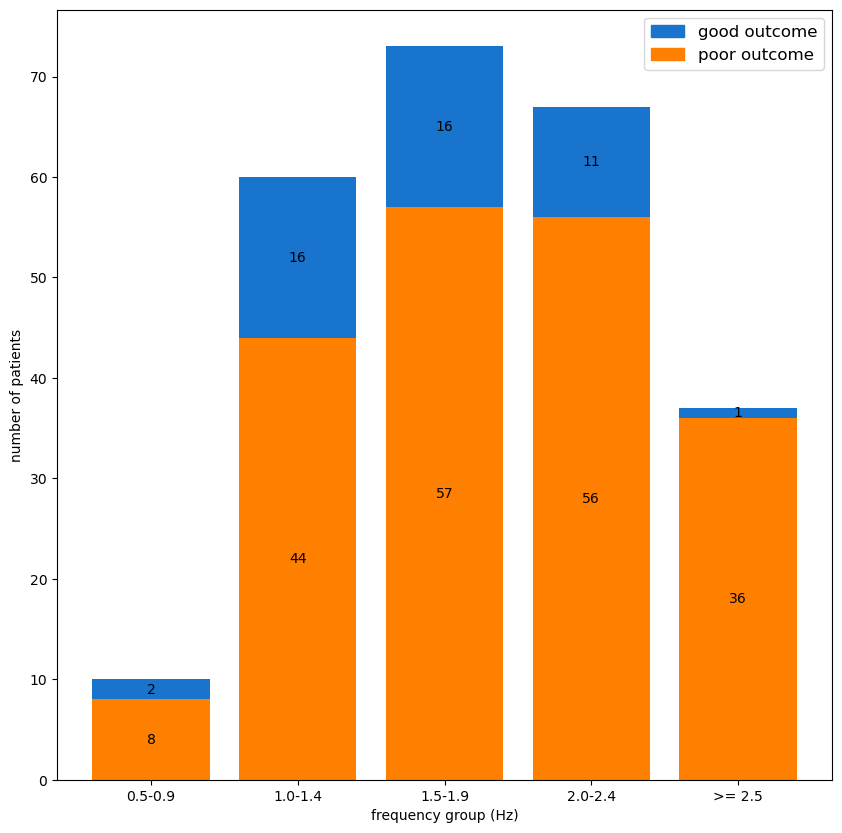

In [1]:
# importing package
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

df = pd.read_csv(r"Data/SSD_stats_per_patient.csv")

df_poor = df[df.cpc_binary != 'good']
df_good = df[df.cpc_binary != 'poor']

grouped_poor=df_poor.groupby(['freq_level']).count().iloc[:,1]
grouped_good=df_good.groupby(['freq_level']).count().iloc[:,1]

freq_label = ['0.5-0.9', '1.0-1.4','1.5-1.9', '2.0-2.4', '>= 2.5']
# plot bars in stack manner
f, ax = plt.subplots(figsize=(10,10))
bar1 = plt.bar(freq_label, grouped_poor, color='#FF7F00')
bar2 = plt.bar(freq_label, grouped_good, bottom=grouped_poor, color='#1874CD')
plt.xlabel('frequency group (Hz)')
plt.ylabel('number of patients')

colors = {'good outcome':'#1874CD', 'poor outcome':'#FF7F00'}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels,fontsize='large')

ax.bar_label(bar1,label_type='center')
ax.bar_label(bar2,label_type='center')

# plt.savefig(r'patient_freq_level_distribution.jpg')


C:\Users\admin\AppData\Local\Temp\ipykernel_53736\11616594.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_poor = df_poor.groupby(["hour", "freq_bin"]).count().reset_index()
C:\Users\admin\AppData\Local\Temp\ipykernel_53736\11616594.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_good = df_good.groupby(["hour", "freq_bin"]).count().reset_index()


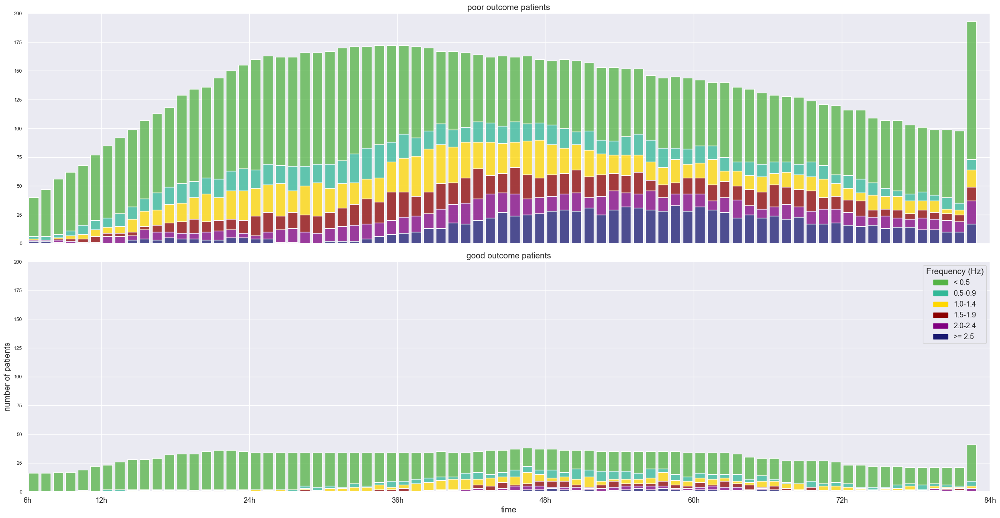

In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

# === 1. 读取数据并预处理 ===
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["pat_ID", "hour", "ssd", "cpc"])  # 保留关键字段
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")
df["ssd_hz"] = df["ssd"] / 10.0  # SSD 转换为 Hz

# === 2. 频率分箱 ===
bins = [-np.inf, 0.5, 0.9, 1.4, 1.9, 2.4, np.inf]
labels = ['< 0.5', '0.5-0.9', '1.0-1.4', '1.5-1.9', '2.0-2.4', '>= 2.5']
df["freq_bin"] = pd.cut(df["ssd_hz"], bins=bins, labels=labels, right=True)

# === 3. 限制时间范围 & 去重 ===
df = df[df["hour"].between(6, 84)]
df_unique = df.drop_duplicates(subset=["pat_ID", "hour"])

# === 4. 拆分 good / poor 并 groupby 统计 ===
df_poor = df_unique[df_unique["outcome"] == "poor"]
df_good = df_unique[df_unique["outcome"] == "good"]

grouped_poor = df_poor.groupby(["hour", "freq_bin"]).count().reset_index()
grouped_good = df_good.groupby(["hour", "freq_bin"]).count().reset_index()

# === 5. 配色与标签 ===
colors = {
    '< 0.5': '#54B345' ,
    '0.5-0.9': '#32B897',
    '1.0-1.4': '#FFD700',
    '1.5-1.9': '#8B0000',
    '2.0-2.4': '#800080',
    '>= 2.5': '#191970'
}
#colors = {'< 0.5':   '#264653', '0.5-0.9': '#287271', '1.0-1.4': '#299D90', '1.5-1.9': '#8AB17D',  '2.0-2.4': '#E8C56B', '>= 2.5':  '#E66F51'}
hue_order = labels

# === 6. 绘图 ===
fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True)

# Poor Outcome
sns.histplot(
    grouped_poor,
    x='hour',
    weights='pat_ID',
    hue='freq_bin',
    multiple='stack',
    palette=colors,
    edgecolor='white',
    shrink=0.8,
    binwidth=1,
    hue_order=hue_order,
    legend=False,
    ax=axes[0]
)
axes[0].set_title("poor outcome patients", fontsize=15)
axes[0].set_xticks([6, 12, 24, 36, 48, 60, 72, 84])
axes[0].set_xticklabels(['6h', '12h', '24h', '36h', '48h', '60h', '72h', '84h'], fontsize=12)
axes[0].set_xlim(6, 84)
axes[0].set_ylim(0, 200)
axes[0].set_ylabel(None)
axes[0].set_xlabel(None)

# Good Outcome
sns.histplot(
    grouped_good,
    x='hour',
    weights='pat_ID',
    hue='freq_bin',
    multiple='stack',
    palette=colors,
    edgecolor='white',
    shrink=0.8,
    binwidth=1,
    hue_order=hue_order,
    ax=axes[1]
)
axes[1].set_title("good outcome patients", fontsize=15)
axes[1].set_xticks([6, 12, 24, 36, 48, 60, 72, 84])
axes[1].set_xticklabels(['6h', '12h', '24h', '36h', '48h', '60h', '72h', '84h'], fontsize=13)
axes[1].set_ylabel('number of patients', fontsize=15)
axes[1].set_xlabel('time', fontsize=15)
axes[1].set_xlim(6, 84)
axes[1].set_ylim(0, 200)

# Legend
custom_patches = [mpatches.Patch(color=colors[l], label=l) for l in hue_order]
axes[1].legend(
    handles=custom_patches,
    title='Frequency (Hz)',
    title_fontsize=15,
    fontsize=13,
)

plt.tight_layout()
plt.show()

[Proportion] Peak <0.5Hz at hour 7, proportion = 0.90
[Proportion] Peak >=2.5Hz at hour 58, proportion = 0.19


C:\Users\admin\AppData\Local\Temp\ipykernel_53736\1830691251.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df_unique.groupby(["hour", "freq_bin"]).size().reset_index(name="n")


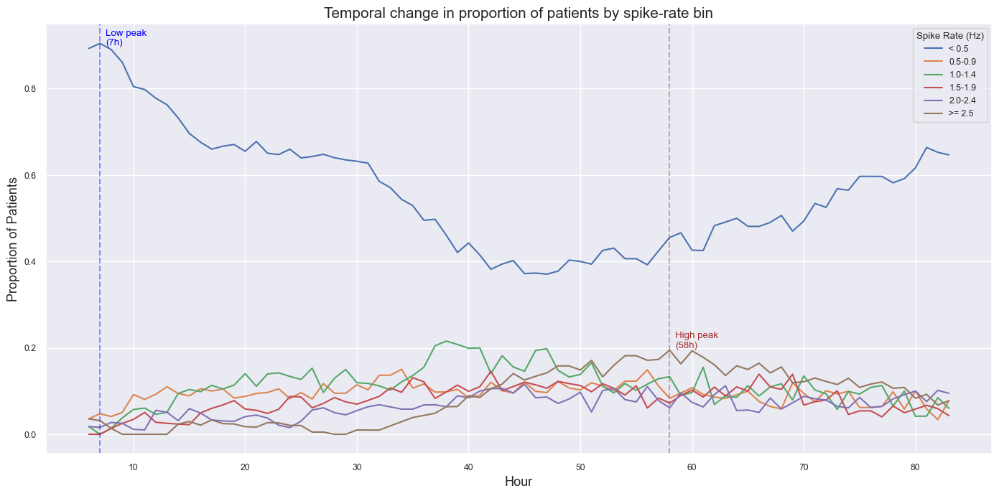

In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load & preprocess
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["pat_ID", "hour", "ssd", "cpc"])
df["ssd_hz"] = df["ssd"] / 10.0

# 2. Restrict hours and deduplicate
df = df[df["hour"].between(6, 84)]
df_unique = df.drop_duplicates(subset=["pat_ID", "hour"])

# 3. Define frequency bins
bins = [-np.inf, 0.5, 0.9, 1.4, 1.9, 2.4, np.inf]
labels = ['< 0.5', '0.5-0.9', '1.0-1.4', '1.5-1.9', '2.0-2.4', '>= 2.5']
df_unique["freq_bin"] = pd.cut(df_unique["ssd_hz"], bins=bins, labels=labels, right=True)

# 4. Compute hourly counts and proportions
counts = df_unique.groupby(["hour", "freq_bin"]).size().reset_index(name="n")
pivot = counts.pivot(index="hour", columns="freq_bin", values="n").fillna(0)
prop = pivot.divide(pivot.sum(axis=1), axis=0)

# 5. Find peak hours
# Instead of using pivot (raw count), use prop (proportions)
low_prop_peak_hour = prop['< 0.5'].idxmax()
high_prop_peak_hour = prop['>= 2.5'].idxmax()

low_prop_peak_val = prop['< 0.5'].max()
high_prop_peak_val = prop['>= 2.5'].max()

print(f"[Proportion] Peak <0.5Hz at hour {low_prop_peak_hour}, proportion = {low_prop_peak_val:.2f}")
print(f"[Proportion] Peak >=2.5Hz at hour {high_prop_peak_hour}, proportion = {high_prop_peak_val:.2f}")

# 6. Plot proportions with annotations
plt.figure(figsize=(14, 7))
for col in prop.columns:
    plt.plot(prop.index, prop[col], label=col)

# Annotations
plt.axvline(low_prop_peak_hour, linestyle='--', color='blue', alpha=0.4)
plt.axvline(high_prop_peak_hour, linestyle='--', color='brown', alpha=0.4)
plt.text(low_prop_peak_hour + 0.5, 0.9, f'Low peak\n({low_prop_peak_hour}h)', color='blue')
plt.text(high_prop_peak_hour + 0.5, 0.2, f'High peak\n({high_prop_peak_hour}h)', color='brown')

plt.xlabel("Hour", fontsize=13)
plt.ylabel("Proportion of Patients", fontsize=13)
plt.title("Temporal change in proportion of patients by spike-rate bin", fontsize=15)
plt.legend(title="Spike Rate (Hz)")
plt.tight_layout()
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_53736\3640316538.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = sub_df.groupby(["hour", "freq_bin"]).size().reset_index(name="n")
C:\Users\admin\AppData\Local\Temp\ipykernel_53736\3640316538.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = sub_df.groupby(["hour", "freq_bin"]).size().reset_index(name="n")


[POOR] Peak proportion of <0.5Hz at hour 7, proportion = 0.87
[POOR] Peak proportion of >=2.5Hz at hour 58, proportion = 0.23
[GOOD] Peak proportion of <0.5Hz at hour 6, proportion = 1.00
[GOOD] Peak proportion of >=2.5Hz at hour 55, proportion = 0.09


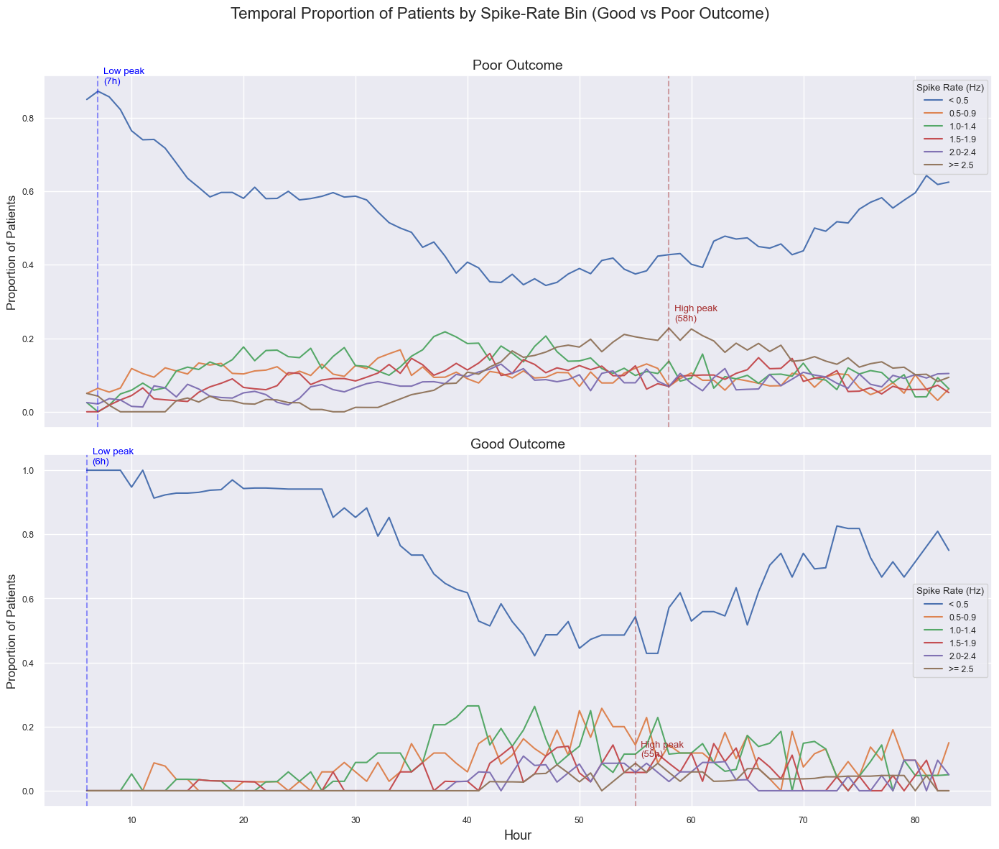

In [118]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["pat_ID", "hour", "ssd", "cpc"])
df["ssd_hz"] = df["ssd"] / 10.0
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")
df = df[df["hour"].between(6, 84)]
df_unique = df.drop_duplicates(subset=["pat_ID", "hour"])

# Define bins
bins = [-np.inf, 0.5, 0.9, 1.4, 1.9, 2.4, np.inf]
labels = ['< 0.5', '0.5-0.9', '1.0-1.4', '1.5-1.9', '2.0-2.4', '>= 2.5']
df_unique["freq_bin"] = pd.cut(df_unique["ssd_hz"], bins=bins, labels=labels, right=True)

# Initialize plot
fig, axes = plt.subplots(2, 1, figsize=(14, 12), sharex=True)
outcome_order = ['poor', 'good']

for i, outcome in enumerate(outcome_order):
    sub_df = df_unique[df_unique["outcome"] == outcome]
    counts = sub_df.groupby(["hour", "freq_bin"]).size().reset_index(name="n")
    pivot = counts.pivot(index="hour", columns="freq_bin", values="n").fillna(0)
    prop = pivot.divide(pivot.sum(axis=1), axis=0)

    # Find proportion peaks
    low_peak_hour = prop['< 0.5'].idxmax()
    high_peak_hour = prop['>= 2.5'].idxmax()
    low_peak_val = prop['< 0.5'].max()
    high_peak_val = prop['>= 2.5'].max()

    # === Print peak info ===
    print(f"[{outcome.upper()}] Peak proportion of <0.5Hz at hour {low_peak_hour}, proportion = {low_peak_val:.2f}")
    print(f"[{outcome.upper()}] Peak proportion of >=2.5Hz at hour {high_peak_hour}, proportion = {high_peak_val:.2f}")

    ax = axes[i]
    for col in prop.columns:
        ax.plot(prop.index, prop[col], label=col)
    
    # Annotate peaks
    ax.axvline(low_peak_hour, linestyle='--', color='blue', alpha=0.4)
    ax.axvline(high_peak_hour, linestyle='--', color='brown', alpha=0.4)
    ax.text(low_peak_hour + 0.5, low_peak_val + 0.02, f'Low peak\n({low_peak_hour}h)', color='blue')
    ax.text(high_peak_hour + 0.5, high_peak_val + 0.02, f'High peak\n({high_peak_hour}h)', color='brown')

    ax.set_title(f"{outcome.capitalize()} Outcome", fontsize=14)
    ax.set_ylabel("Proportion of Patients", fontsize=12)
    ax.legend(title="Spike Rate (Hz)")

axes[1].set_xlabel("Hour", fontsize=13)
plt.suptitle("Temporal Proportion of Patients by Spike-Rate Bin (Good vs Poor Outcome)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_53736\3142226810.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dist      = df_plot.groupby(["outcome", "duration_bin"]).size().unstack(fill_value=0)


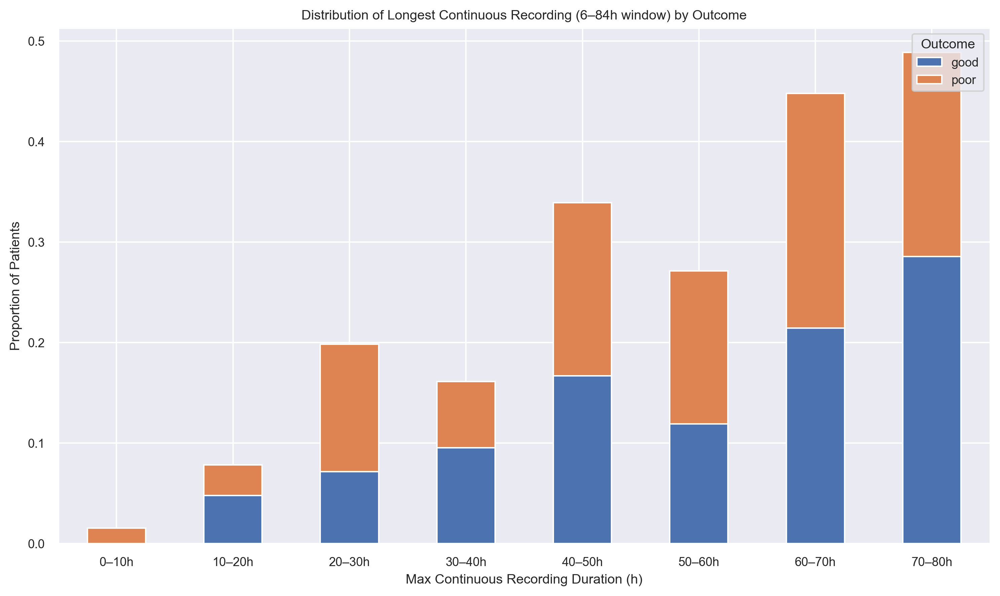

Overall max-continuous duration (h): mean=52.54, std=18.30

By outcome:
outcome  group_mean  group_std
   good   55.000000  18.240935
   poor   52.020305  18.311633


In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load data (hours 6–84)
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["ssd", "cpc"])
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")

# 2. Compute each patient’s max continuous recording duration (in hours-difference)
lengths = []
for pid, grp in df.groupby("pat_ID"):
    hrs = sorted(grp["hour"].unique())
    segments = []
    current = [hrs[0]]
    for prev, curr in zip(hrs, hrs[1:]):
        # strict hour-by-hour continuity
        if curr - prev == 1:
            current.append(curr)
        else:
            segments.append(current)
            current = [curr]
    segments.append(current)
    # duration = last_hour - first_hour
    max_len = max(seg[-1] - seg[0] for seg in segments)
    lengths.append({
        "pat_ID": pid,
        "outcome": grp["outcome"].iloc[0],
        "max_continuous_h": max_len
    })
df_len = pd.DataFrame(lengths)

# 3. Bin into ranges up to 80h (covers the 6–84h window → max diff 78h)
bins   = [0, 10, 20, 30, 40, 50, 60, 70, 80]
labels = ["0–10h", "10–20h", "20–30h", "30–40h", "40–50h", "50–60h", "60–70h", "70–80h"]
df_len["duration_bin"] = pd.cut(
    df_len["max_continuous_h"],
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
)

# drop any patients whose duration ≥ 80h (there won’t be any, since max possible is 78)
df_plot = df_len.dropna(subset=["duration_bin"])

# 4. Proportions by outcome
dist      = df_plot.groupby(["outcome", "duration_bin"]).size().unstack(fill_value=0)
dist_prop = dist.div(dist.sum(axis=1), axis=0)

# 5. Plot stacked bar
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
dist_prop.T.plot(kind="bar", stacked=True, ax=ax)
ax.set_xlabel("Max Continuous Recording Duration (h)")
ax.set_ylabel("Proportion of Patients")
ax.set_title("Distribution of Longest Continuous Recording (6–84h window) by Outcome")
ax.set_xticklabels(labels, rotation=0)
ax.legend(title="Outcome", loc="upper right")
plt.tight_layout()
plt.show()

# 6. Summary stats
overall_mean = df_len["max_continuous_h"].mean()
overall_std  = df_len["max_continuous_h"].std()
group_stats = (
    df_len
    .groupby("outcome")["max_continuous_h"]
    .agg(["mean", "std"])
    .rename(columns={"mean": "group_mean", "std": "group_std"})
    .reset_index()
)

print(f"Overall max-continuous duration (h): mean={overall_mean:.2f}, std={overall_std:.2f}\n")
print("By outcome:")
print(group_stats.to_string(index=False))


C:\Users\admin\AppData\Local\Temp\ipykernel_53736\508864804.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dist = df_plot.groupby(["outcome", "duration_bin"]).size().unstack(fill_value=0)


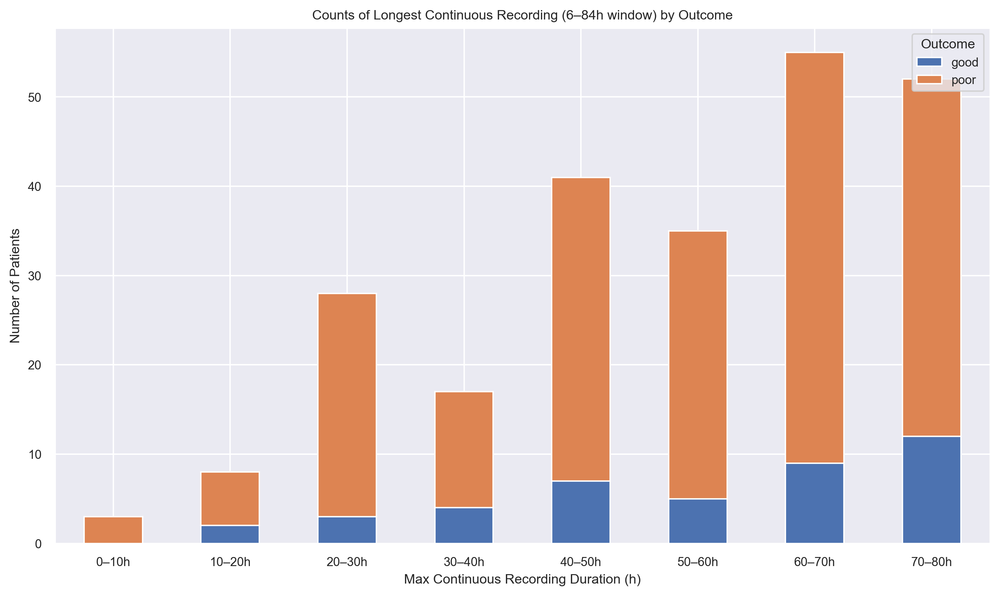

Overall max-continuous duration (h): mean=52.54, std=18.30

By outcome:
outcome  group_mean  group_std
   good   55.000000  18.240935
   poor   52.020305  18.311633


In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Load data (hours 6–84)
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["ssd", "cpc"])
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")

# 2. Compute each patient’s max continuous recording duration (in hours-difference)
lengths = []
for pid, grp in df.groupby("pat_ID"):
    hrs = sorted(grp["hour"].unique())
    segments = []
    current = [hrs[0]]
    for prev, curr in zip(hrs, hrs[1:]):
        # strict hour-by-hour continuity
        if curr - prev == 1:
            current.append(curr)
        else:
            segments.append(current)
            current = [curr]
    segments.append(current)
    # duration = last_hour - first_hour
    max_len = max(seg[-1] - seg[0] for seg in segments)
    lengths.append({
        "pat_ID": pid,
        "outcome": grp["outcome"].iloc[0],
        "max_continuous_h": max_len
    })
df_len = pd.DataFrame(lengths)

# 3. Bin into ranges up to 80h (covers the 6–84h window → max diff 78h)
bins   = [0, 10, 20, 30, 40, 50, 60, 70, 80]
labels = ["0–10h", "10–20h", "20–30h", "30–40h", "40–50h", "50–60h", "60–70h", "70–80h"]
df_len["duration_bin"] = pd.cut(
    df_len["max_continuous_h"],
    bins=bins,
    labels=labels,
    right=False,
    include_lowest=True
)

# drop any patients whose duration ≥ 80h (none, since max possible is 78)
df_plot = df_len.dropna(subset=["duration_bin"])

# 4. Counts by outcome
dist = df_plot.groupby(["outcome", "duration_bin"]).size().unstack(fill_value=0)

# 5. Plot stacked bar chart of counts
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
dist.T.plot(kind="bar", stacked=True, ax=ax)

ax.set_xlabel("Max Continuous Recording Duration (h)")
ax.set_ylabel("Number of Patients")
ax.set_title("Counts of Longest Continuous Recording (6–84h window) by Outcome")
ax.set_xticklabels(labels, rotation=0)
ax.legend(title="Outcome", loc="upper right")

plt.tight_layout()
plt.show()

# 6. Summary stats (unchanged)
overall_mean = df_len["max_continuous_h"].mean()
overall_std  = df_len["max_continuous_h"].std()
group_stats = (
    df_len
    .groupby("outcome")["max_continuous_h"]
    .agg(["mean", "std"])
    .rename(columns={"mean": "group_mean", "std": "group_std"})
    .reset_index()
)

print(f"Overall max-continuous duration (h): mean={overall_mean:.2f}, std={overall_std:.2f}\n")
print("By outcome:")
print(group_stats.to_string(index=False))


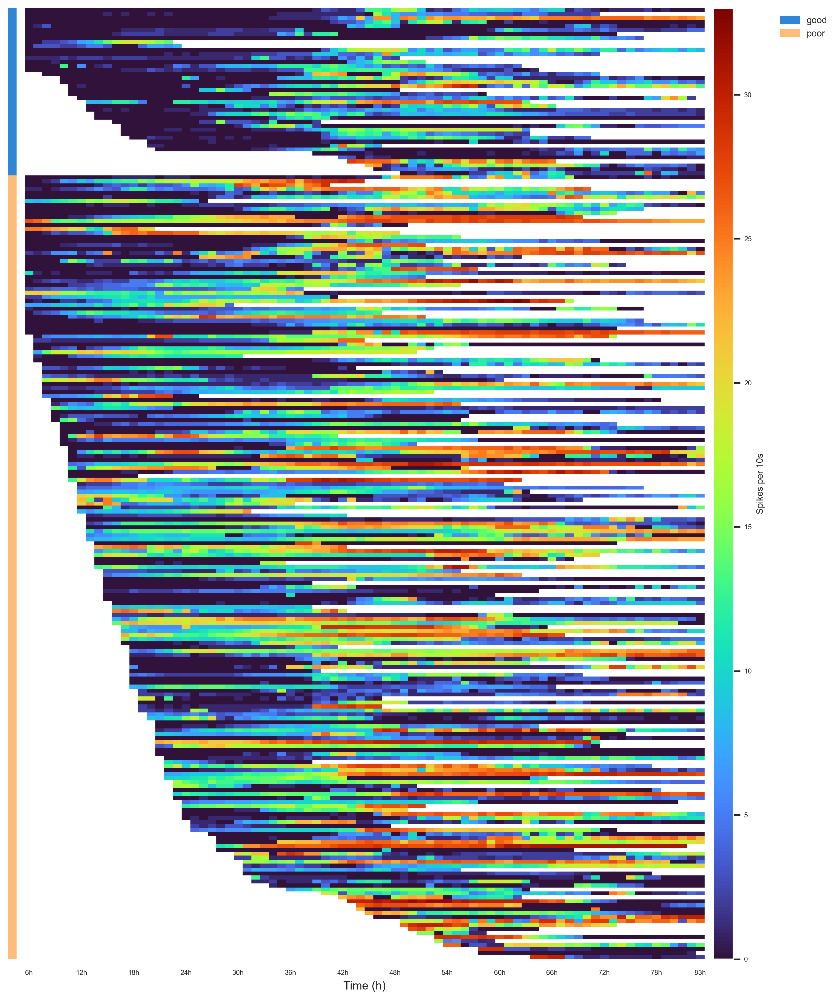

In [136]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 1. Load data
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["ssd", "cpc"])
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1, 2] else "poor")

# 2. Sort patients by outcome & start_time
start_times = df.groupby("pat_ID")["hour"].min().rename("start_time")
patients = (
    df[["pat_ID", "outcome"]]
    .drop_duplicates()
    .merge(start_times, on="pat_ID")
)
patients["rank"] = patients["outcome"].map({"good": 0, "poor": 1})
patients_sorted = patients.sort_values(["rank", "start_time", "pat_ID"])
pat_order = patients_sorted["pat_ID"].tolist()
true_cpc = patients_sorted["outcome"].map({"good": 0, "poor": 1}).tolist()

# 3. Pivot into matrix
time_axis = sorted(df["hour"].unique())
df_pivot = df.pivot(index="pat_ID", columns="hour", values="ssd")
df_pivot = df_pivot.reindex(index=pat_order, columns=time_axis)
mat = df_pivot.values

# 4. Build meshgrid for pcolormesh
n_pat, n_time = mat.shape
x = np.arange(n_time + 1)
y = np.arange(n_pat + 1)
X, Y = np.meshgrid(x, y)

# 5. Plot with pcolormesh
fig, ax = plt.subplots(figsize=(10, 12), dpi=300)
cmap = colormaps["turbo"].copy()
cmap.set_bad(color="white")

# pcolormesh expects (n+1, m+1) grid and (n, m) values
pc = ax.pcolormesh(X, Y, mat, cmap=cmap, shading="flat")

# 6. X-axis
min_h, max_h = time_axis[0], time_axis[-1]
xticks = []
xtick_labels = []

for i, h in enumerate(time_axis):
    if h % 6 == 0 or h in [min_h, max_h]:
        xticks.append(i + 0.5)
        xtick_labels.append(f"{h}h")

ax.set_xticks(xticks)
ax.set_xticklabels(xtick_labels, fontsize=6, rotation=0)
ax.set_xlabel("Time (h)", fontsize=10)



# 7. Y-axis
ax.set_yticks([])
ax.set_xlim(0, n_time)
ax.set_ylim(n_pat, 0)  # invert y

for spine in ax.spines.values():
    spine.set_visible(False)

# 8. Left CPC strip
divider = make_axes_locatable(ax)
cax2 = divider.append_axes("left", size="1.2%", pad=0.1)
label_matrix = np.array(true_cpc).reshape(-1, 1)
cmap_cpc = ListedColormap(["#3086d6", "#ffbb78"])
bounds = [-0.5, 0.5, 1.5]
norm = BoundaryNorm(bounds, cmap_cpc.N)
cax2.imshow(label_matrix, cmap=cmap_cpc, norm=norm, aspect="auto", interpolation="none", origin="upper")
cax2.axis("off")

# 9. Colorbar
cax = divider.append_axes("right", size="3%", pad=0.1)
cbar = fig.colorbar(pc, cax=cax)
cbar.set_label("Spikes per 10s", fontsize=8)
cbar.ax.tick_params(labelsize=6)

# 10. CPC legend
from matplotlib.patches import Patch
legend_patches = [
    Patch(color="#3086d6", label="good"),
    Patch(color="#ffbb78", label="poor"),
]
ax.legend(handles=legend_patches, bbox_to_anchor=(1.1, 1), loc="upper left", frameon=False, fontsize=8)

plt.tight_layout(pad=0.5)
plt.show()


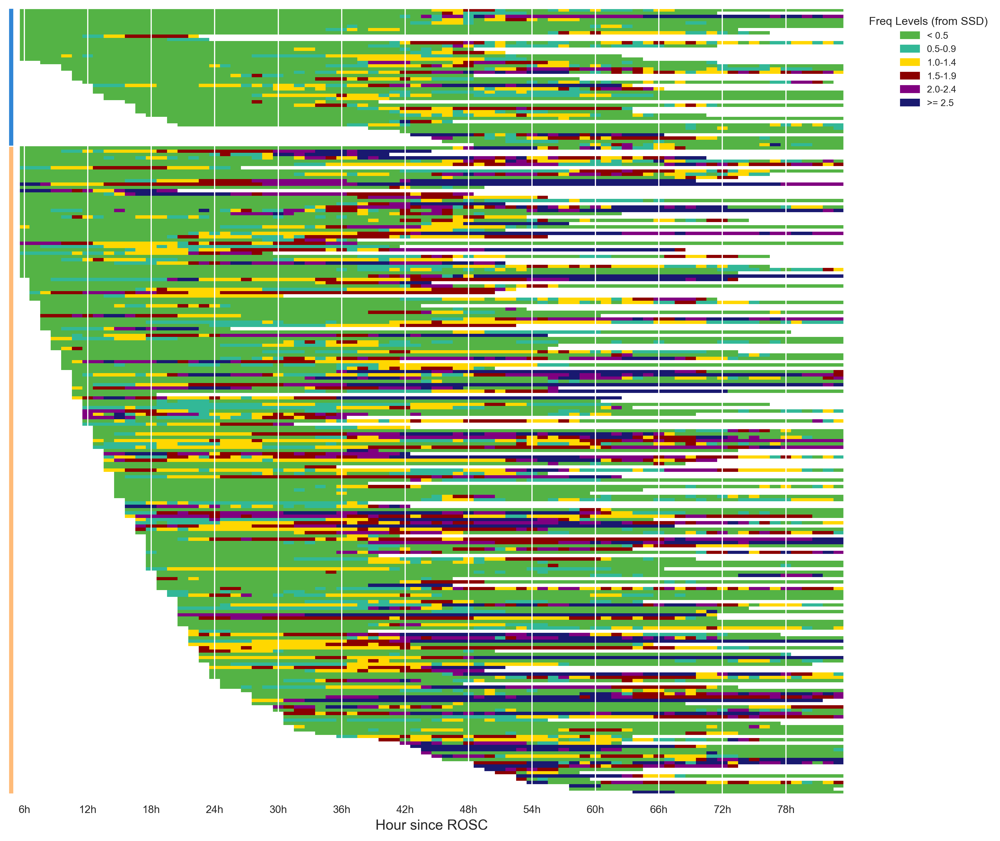

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle, Patch
from mpl_toolkits.axes_grid1 import make_axes_locatable

# 1. 读取 all_feature_data.csv 并筛选
df = pd.read_csv("all_feature_data_6-84.csv")
df = df.dropna(subset=["ssd", "cpc"])
df["outcome"] = df["cpc"].apply(lambda x: "good" if x in [1,2] else "poor")

# 2. 先把 SSD_90th（spikes per 10s）→ 转成 每秒尖峰率
df["ssd_per_sec"] = df["ssd"] / 10.0

#    然后按 pat_freq_hour 的相同阈值分箱
bins   = [-np.inf, 0.5, 0.9, 1.4, 1.9, 2.4, np.inf]
labels = ['< 0.5','0.5-0.9','1.0-1.4','1.5-1.9','2.0-2.4','>= 2.5']
df["freq_cat_ssd"]    = pd.cut(df["ssd_per_sec"], bins=bins, labels=labels, right=True)
df["freq_idx_ssd"]    = df["freq_cat_ssd"].map({lbl:i for i,lbl in enumerate(labels)})

# 3. 按 outcome + start_time 给病人排序
start_times = df.groupby("pat_ID")["hour"].min().rename("start_time")
meta = (
    df[["pat_ID","outcome"]]
    .drop_duplicates()
    .merge(start_times, on="pat_ID")
)
meta["rank"] = meta["outcome"].map({"good":0,"poor":1})
meta_sorted = meta.sort_values(["rank","start_time","pat_ID"])
pat_order = meta_sorted["pat_ID"].tolist()
true_cpc  = meta_sorted["outcome"].map({"good":0,"poor":1}).tolist()

# 4. 构建行×列矩阵
time_axis = sorted(df["hour"].unique())
mat = np.full((len(pat_order), len(time_axis)), np.nan)
t2i = {t:i for i,t in enumerate(time_axis)}
for i, pid in enumerate(pat_order):
    sub = df[df["pat_ID"]==pid]
    for _, row in sub.iterrows():
        mat[i, t2i[row["hour"]]] = row["freq_idx_ssd"]

# 5. 绘图
fig, ax = plt.subplots(figsize=(14,10), dpi=300)
#custom_colors = ['#308014','#FFD700','#EE7600','#8B0000','#800080','#191970']
custom_colors = ['#54B345' ,'#32B897','#FFD700','#8B0000','#800080','#191970']
#custom_colors = ['#264653', '#287271', '#299D90', '#8AB17D', '#E8C56B', '#E66F51']
cmap = ListedColormap(custom_colors)
cmap.set_bad(color="white")  # NaN 显示为白

im = ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="none")

# 6. 左侧 outcome 彩条
split = meta_sorted[meta_sorted["outcome"]=="good"].shape[0]
ax.add_patch(Rectangle((-1.5, -0.5), 0.5, split, facecolor="#3086d6", clip_on=False))
ax.add_patch(Rectangle((-1.5, split-0.5), 0.5, len(pat_order)-split, facecolor="#ffbb78", clip_on=False))

# 7. X 轴、Y 轴格式
ax.set_xticks(np.arange(0, len(time_axis), 6))
ax.set_xticklabels([f"{h}h" for h in time_axis][::6], fontsize=9)
ax.set_yticks([])
ax.set_xlabel("Hour since ROSC", fontsize=12)

# 8. Colorbar（离散标签）
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="3%", pad=0.1)
#cbar = fig.colorbar(im, cax=cax)
#cbar.set_ticks(np.arange(len(labels)))
#cbar.set_ticklabels(labels)
#cbar.set_label("Recomputed Spike‐Freq Category", fontsize=9)
#cbar.ax.tick_params(labelsize=7)

# 9. Legend
legend_patches = [Patch(color=custom_colors[i], label=labels[i]) for i in range(len(labels))]
ax.legend(handles=legend_patches, bbox_to_anchor=(1.02,1), loc="upper left",
          title="Freq Levels (from SSD)", frameon=False, fontsize=8)

# 10. 标题 & 布局
#plt.title("Swimmer Plot of Recomputed Spike‐Frequency Levels (from SSD)", fontsize=14)
plt.tight_layout(rect=[0,0,0.85,1])
plt.show()


# Multiple Features Clustering Analysis

In [91]:
def create_ssd_artifact_array(ssd_files_location, CPC_file_location):
    clinical_data = pd.read_csv(CPC_file_location)
    
    array, array_lookup = [], []
    
    files = [f for f in os.listdir(ssd_files_location) if f.endswith('.mat')]
    files.sort()
    
    cur_patient = None
    cur_idx = -1
    
    for file_name in files:
        file_name, _ = os.path.splitext(file_name)
        file_parts = file_name.split('_')
        patient_id = 'ICARE_' + file_parts[4]
        if patient_id not in clinical_data['pat_ICARE'].values:
            continue
        
        if patient_id != cur_patient:
            if cur_idx >= 0:
                array.append(array_pat)

            array_pat = []
            cur_patient = patient_id
            cur_idx += 1
            
            array_lookup.append([None] * 7)  # Initialize with placeholders
            array_lookup[cur_idx][0] = cur_patient
            
            idx_match = clinical_data['pat_ICARE'] == cur_patient
            array_lookup[cur_idx][1] = clinical_data.loc[idx_match, 'time_to_CA(seconds)'].values[0]
            cpc = clinical_data.loc[idx_match, 'cpc'].values[0]
            age = clinical_data.loc[idx_match, 'age'].values[0]
            sex = clinical_data.loc[idx_match, 'sex'].values[0]
            vfib = clinical_data.loc[idx_match, 'vfib'].values[0]
            
            base_file_date_str = file_parts[5] + ' ' + file_parts[6]
            base_file_date = datetime.strptime(base_file_date_str, "%Y%m%d %H%M%S")
            array_lookup[cur_idx][2] = base_file_date
            
            array_lookup[cur_idx][3] = cpc
            array_lookup[cur_idx][4] = age
            array_lookup[cur_idx][5] = sex
            array_lookup[cur_idx][6] = vfib
        
        full_filename = os.path.join(ssd_files_location, file_name)
        file_import = loadmat(full_filename)
        
        if 'Spike_freq_approaches' not in file_import:
            seiz_predic = [-1]
        else:
            seiz_predic = [approach[0, 9] for approach in file_import['Spike_freq_approaches'][0]]
        array_pat.extend(seiz_predic)
    
    array.append(array_pat)
    
    return array, array_lookup

def create_array_FEATURES(feature_files_location, patient_id, cohort_type):
    feature_file_dir = os.path.join(feature_files_location, cohort_type)
    patient_all_files = [f for f in os.listdir(feature_file_dir) if patient_id in f]
    patient_all_files.sort()

    # Load feature names
    feature_file = "new_icare_features_new/BWH/feature_ICARE_0520_20140131_111546.mat"
    mat_data = mat73.loadmat(feature_file)
    feature_names = [name for name in mat_data['x'] if 'org_set' not in name]
    
    # Initialize features dictionary
    features_array = {}
    for feat_name in feature_names:
        features_array[feat_name] = []

    # Process each file
    for file_name in patient_all_files: 
        try:
            data = mat73.loadmat(os.path.join(feature_file_dir, file_name))
            x = data['x']
        except Exception as e:
            print(f"Error loading {file_name}: {e}")
            return None
        
        # Append features
        for feat_name in feature_names:
            if feat_name not in x:
                return None
            if type(x[feat_name]) != np.ndarray:
                continue
            current_feature = x[feat_name].flatten()
            features_array[feat_name].extend(current_feature)
    
    return features_array
# Directory containing the .mat files
feature_directory = "new_icare_features_new"
ssd_directory = "Spike_freq"
clinical_data = "Data/ICARE_clinical.csv"
patient_directory = "Data/patient_directory_mapping.csv"
ID_converter = "Data/ICARE_ID_conversion.csv"
patient_cohort = "Data/uniqueID_SSD.csv"
# List to hold EEG data grouped by patient
all_feature_data = []


array, array_lookup = create_ssd_artifact_array(ssd_directory, clinical_data)

cohort = pd.read_csv(patient_cohort)
converter = pd.read_csv(ID_converter)
# Create a mapping from pat_ID to directory
pat_id_to_dir = {row['original_names']: row['convert_names'] for _, row in converter.iterrows()}
valid_pat_ids = [pat_id_to_dir.get(pat_id, None) for pat_id in cohort['pat_ID']]

for patient_idx, (pat_id, *_) in enumerate(array_lookup):
    if array_lookup[patient_idx][0] not in valid_pat_ids:
        continue
    # Prepare patient SSD array
    new_pat_array = array[patient_idx].copy()
    # Interpolate missing values using PCHIP
    new_pat_array = pd.Series(new_pat_array).interpolate(method='pchip').to_numpy()
    patient_df = pd.read_csv(patient_directory)
    cohort_type = patient_df.loc[patient_df['pat_ID'] == pat_id, 'directory']
    if cohort_type.empty:
        continue
    feat_array = create_array_FEATURES(feature_directory, pat_id, cohort_type.values[0])
    if not feat_array:
        continue

    CA_to_first_EEG = array_lookup[patient_idx][1]
    CA_to_EEG_diff = int(CA_to_first_EEG / 10)
    CA_to_EEG_diff_array = np.full(CA_to_EEG_diff, np.nan)  # Pre-padding
    new_pat_array = np.concatenate([CA_to_EEG_diff_array, new_pat_array])
    feat_array = {key: np.concatenate([CA_to_EEG_diff_array, value]) for key, value in feat_array.items()}
    for segment_start in range(5760, 24840, 360): # 16 to 68 hours, 1 hr time points
        result_entry = {}
        for feature_name in feat_array.keys(): # feature names
            feature_data = feat_array[feature_name]
            if segment_start >= len(feature_data):
                continue
            one_hour_feature_data = feature_data[segment_start:min(segment_start + 360, len(feature_data))]
            one_hour_feature_data = np.where(np.isinf(one_hour_feature_data), np.nan, one_hour_feature_data)
            result_entry[feature_name] = np.nanmean(one_hour_feature_data) if np.isfinite(one_hour_feature_data).any() else np.nan
            result_entry[feature_name] = np.nan if np.isinf(result_entry[feature_name]) else result_entry[feature_name]
        if segment_start < len(new_pat_array): # ssd
            one_hour_array = new_pat_array[segment_start:min(segment_start + 360, len(new_pat_array))]
            one_hour_array = np.where(np.isinf(one_hour_array), np.nan, one_hour_array)
            result_entry['ssd'] = np.percentile(one_hour_array, 90) if np.isfinite(one_hour_array).any() else np.nan
            result_entry['ssd'] = np.nan if np.isinf(result_entry['ssd']) else result_entry['ssd']
        else:
            continue
        result_entry['cpc'] = array_lookup[patient_idx][3]
        result_entry['pat_ID'] = array_lookup[patient_idx][0]
        result_entry['hour'] = (segment_start // 360)
        
        all_feature_data.append(result_entry)

# Convert the list of EEG data into a DataFrame 
# invalid_patients = set(all_feature_data.loc[np.isinf(all_feature_data.select_dtypes(include=[np.number])).any(axis=1), 'pat_ID'])
# all_feature_data = all_feature_data[~all_feature_data['pat_ID'].isin(invalid_patients)]

all_feature_data = pd.DataFrame(all_feature_data)
all_feature_data.to_csv("all_feature_data—16start.csv")

print("Done")

Error loading feature_ICARE_0385_20131017_063113.mat: new_icare_features_new\UTW\feature_ICARE_0385_20131017_063113.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0504_20140224_231832.mat: new_icare_features_new\UTW\feature_ICARE_0504_20140224_231832.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0700_20141008_071012.mat: new_icare_features_new\BWH\feature_ICARE_0700_20141008_071012.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0717_20130104_052259.mat: new_icare_features_new\UTW\feature_ICARE_0717_20130104_052259.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_1020_20140309_114427.mat: new_icare_features_new\UTW\feature_ICARE_1020_20140309_114427.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Done


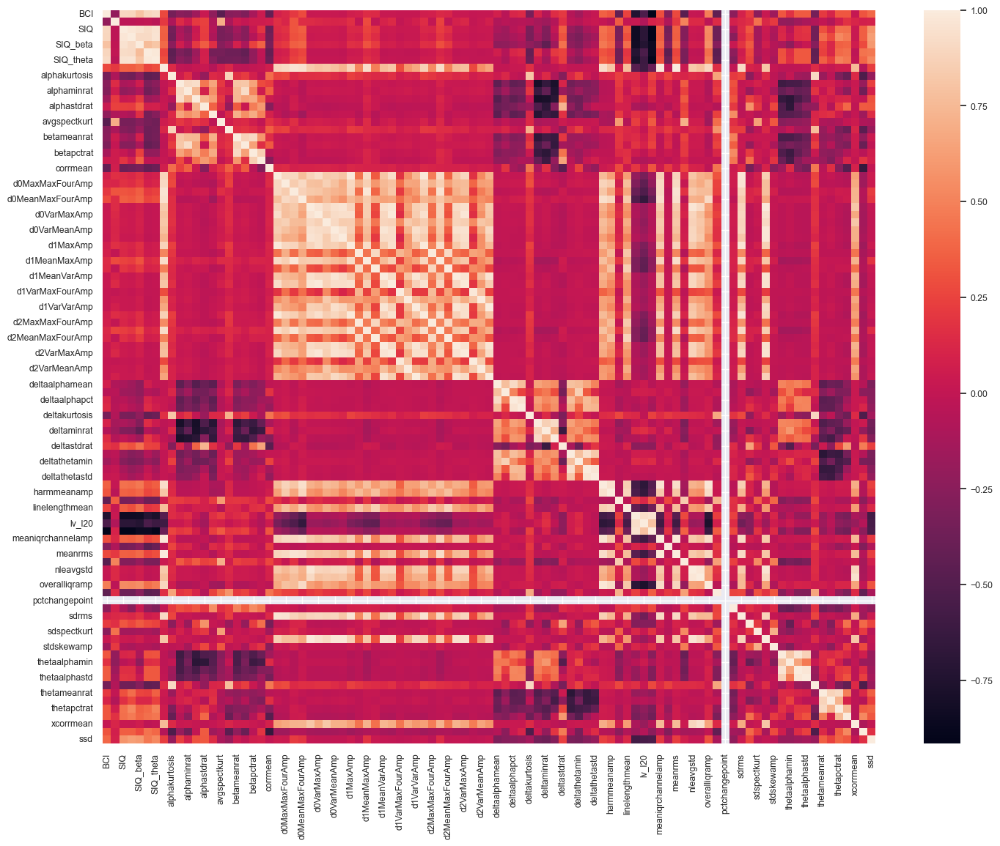

In [92]:
# Load the dataset
all_feature_data = pd.read_csv("all_feature_data—16start.csv", index_col = 0)

X = all_feature_data.drop(columns=['cpc', 'pat_ID', 'hour'])
y = all_feature_data['cpc'].apply(lambda val: 'good' if val in [1, 2] else 'poor').to_numpy()

# Plot the correlation matrix
plt.figure(figsize=(17, 13))
sns.set_style('whitegrid')
sns.set_theme(font_scale=0.8)

df_corr = X.corr()

ax = sns.heatmap(df_corr, annot=False)

plt.savefig("corr_plot.png", dpi=300)

# Select the top 3 features based on the highest scores
metadata = all_feature_data[['pat_ID', 'cpc']].drop_duplicates().reset_index(drop=True)
feature_arrays = []
max_length = 0  # Track max sequence length dynamically

features = [col for col in all_feature_data.columns if col not in ['cpc', 'pat_ID', 'hour']]
for feature in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feature)  # (patients x time)
    pivot_array = [df_pivot.loc[row].dropna().to_list() for row in df_pivot.index]
    max_length = max(max_length, max(len(pat_row) for pat_row in pivot_array))
    pivot_array = [pat_row + [np.nan] * (max_length - len(pat_row)) for pat_row in pivot_array]
    feature_arrays.append(np.array(pivot_array))  # Shape: (patients, time)

# Stack along last axis to get (patients, time, features)
X_3D = np.stack(feature_arrays, axis=-1)

X_filtered = X_3D[:, :, features.index('ssd')]

normalized_data = TimeSeriesScalerMinMax().fit_transform(X_filtered)

n_clusters = 3
clusters = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw").fit_predict(normalized_data)

cluster_df = pd.DataFrame({'pat_ID': metadata['pat_ID'], 'cluster': clusters})
#cluster_df.to_csv("clusters_ssd_only—16start.csv", index=False)
#cluster_df.to_csv("clusters_ssd_only.csv", index=False)

In [100]:
import pandas as pd
import numpy as np

# === 加载数据 ===
cluster_df = pd.read_csv("clusters_ssd_only.csv")   # 必须包含 pat_ID 和 cluster 列
all_feature_data = pd.read_csv("all_feature_data—16start.csv")  # 包含 pat_ID, hour, feature columns, cpc

# === Step 1: 取交集，获得有效病人列表 ===
valid_ids = sorted(set(cluster_df['pat_ID']) & set(all_feature_data['pat_ID']))

# === Step 2: 对齐 metadata（cpc label） ===
metadata = all_feature_data[all_feature_data['pat_ID'].isin(valid_ids)][['pat_ID', 'cpc']].drop_duplicates()
metadata = metadata.set_index('pat_ID').loc[valid_ids].reset_index()

# === Step 3: 对齐 clusters（聚类标签） ===
cluster_df = cluster_df.set_index('pat_ID').loc[valid_ids].reset_index()
clusters = cluster_df['cluster'].to_numpy()

# === Step 4: 提取所有用于建模的特征列（除去标签列和辅助列） ===
features = [c for c in all_feature_data.columns if c not in ['pat_ID', 'hour', 'cpc']]

# === Step 5: 构建 3D 特征张量 X_3D: (patients, time, features) ===
feature_arrays = []
for feat in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feat)
    df_pivot = df_pivot.loc[valid_ids]  # 强制顺序一致
    feature_arrays.append(df_pivot.to_numpy())  # shape: (patients, time)

X_3D = np.stack(feature_arrays, axis=-1)  # shape = (patients, time, features)


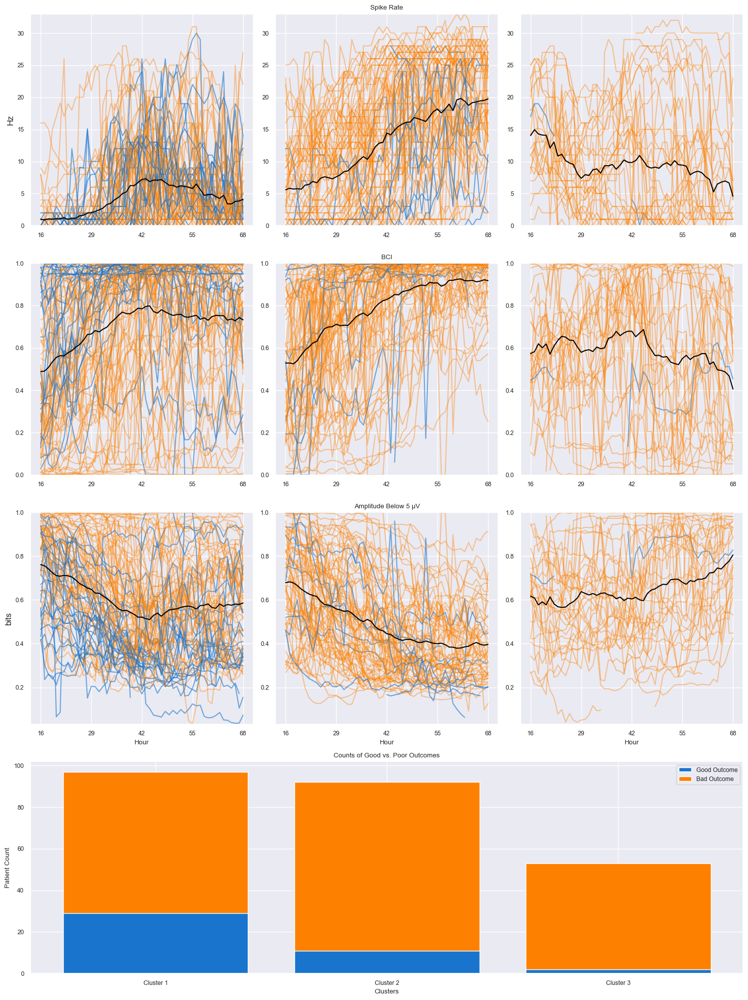

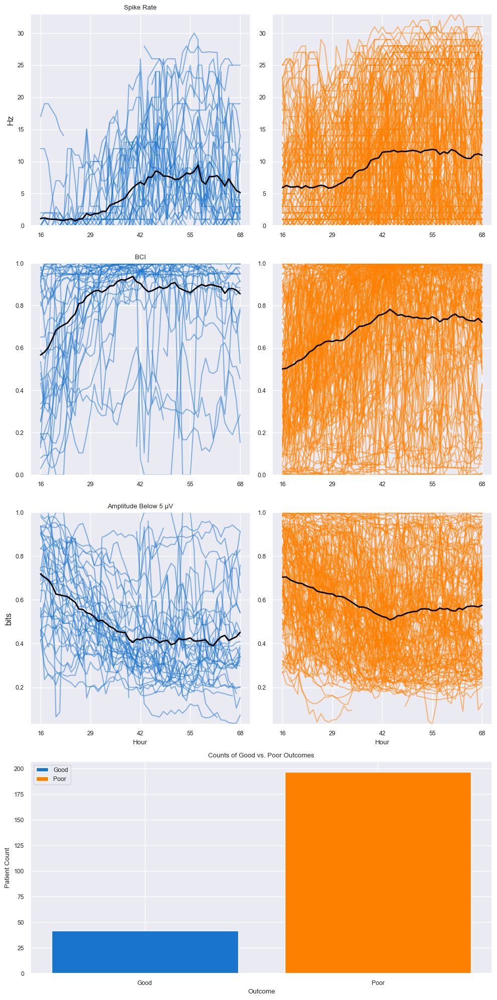

In [101]:
#clusters = pd.read_csv("clusters_ssd_only—16start.csv")['cluster'].to_numpy()
#clusters = pd.read_csv("clusters_ssd_only.csv")['cluster'].to_numpy()

# Redo X_3D for plotting
for feature in features:
    df_pivot = all_feature_data.pivot(index='pat_ID', columns='hour', values=feature)  # (patients x time)
    pivot_array = [df_pivot.loc[row].to_list() for row in df_pivot.index]
    feature_arrays.append(np.array(pivot_array))  # Shape: (patients, time)

X_3D = np.stack(feature_arrays, axis=-1)

# note: removed 'SIQ' for plotting
y_labs = ['Hz', '', 'bits', '%']
plot_features = ['ssd', 'BCI', 'lv_l5']
plot_feature_indices = [features.index(f) for f in plot_features]
feature_labs = ['Spike Rate', 'BCI', 'Amplitude Below 5 µV']

fig, axes = plt.subplots(len(plot_features) + 1, n_clusters, figsize=(n_clusters * 5, (len(plot_features) + 1) * 5))

y_lims = []  
for feature_idx in plot_feature_indices:
    feature_min, feature_max = np.inf, -np.inf  
    for cluster_id in range(n_clusters):
        cluster_indices = np.where(clusters == cluster_id)[0]
        cluster_values = X_3D[cluster_indices, :, feature_idx].flatten()
        cluster_values = cluster_values[~np.isnan(cluster_values)]
        if len(cluster_values) > 0:
            feature_min = min(feature_min, cluster_values.min())
            feature_max = max(feature_max, cluster_values.max())
    y_lims.append((feature_min, feature_max))  

for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    
    good_counts = []
    bad_counts = []

    # Loop through clusters and plot signals
    for cluster_id in range(n_clusters):
        ax = axes[row, cluster_id]
        cluster_indices = np.where(clusters == cluster_id)[0]  # Indices of patients in this cluster
        cluster = []

        # Count good and bad outcomes
        good_count = np.sum(metadata['cpc'][cluster_indices].isin([1, 2]))
        bad_count = len(cluster_indices) - good_count
        good_counts.append(good_count)
        bad_counts.append(bad_count)

        # Plot each patient's time series for this feature
        for idx in cluster_indices:
            color = '#1974cd' if metadata['cpc'][idx] in [1, 2] else '#fe8000' # Blue for good outcome, orange for poor outcome
            alpha = 0.6 if metadata['cpc'][idx] in [1, 2] else 0.4
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=alpha)
            cluster.append(X_3D[idx, :, feature_idx])

        # Plot the mean signal of the cluster
        ax.plot(np.nanmean(np.vstack(cluster), axis=0), c='black')
        # ax.plot(np.nanmedian(np.vstack(cluster), axis = 0), c = 'black') # for median
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if cluster_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if cluster_id == 1:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, len(X_3D[0]) - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
cluster_labels = [f"Cluster {i+1}" for i in range(n_clusters)]
bar_ax.bar(cluster_labels, good_counts, color='#1974cd', label='Good Outcome')
bar_ax.bar(cluster_labels, bad_counts, bottom=good_counts, color='#fe8000', label='Bad Outcome')
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Clusters")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_dtw_cluster_ssd_only_mean.png', dpi=300)

# plot time series of good vs bad 
n_outcomes = 2
n_features = len(plot_features)

fig, axes = plt.subplots(len(plot_features) + 1, n_outcomes, figsize=(n_outcomes * 5, (len(plot_features) + 1) * 5))
for row, (feature_idx, feature_name, y_lab, (y_min, y_max)) in enumerate(zip(plot_feature_indices, feature_labs, y_labs, y_lims)):
    # Loop through clusters and plot signals
    for outcome_id in range(n_outcomes):
        ax = axes[row, outcome_id]
        cluster = []
        cluster_indices = np.where(metadata['cpc'].isin([1, 2]))[0] if outcome_id == 0 else np.where(metadata['cpc'].isin([3, 4, 5]))[0]
        color = '#1974cd' if outcome_id == 0 else '#fe8000'

        # Plot each patient's time series for this feature
        for idx in cluster_indices:
            ax.plot(X_3D[idx, :, feature_idx], c=color, alpha=.5)
            cluster.append(X_3D[idx, :, feature_idx])

        # Plot the mean signal of the cluster
        ax.plot(
            np.nanmean(np.vstack(cluster), axis=0),
            color='black',
            linewidth=2  
        )
        # ax.plot(np.nanmedian(np.vstack(cluster), axis = 0), c = 'black') # for median
        ax.set_ylim(y_min, y_max)
        if row == len(plot_features) - 1:
            ax.set_xlabel("Hour")
        if outcome_id == 0:
            ax.set_ylabel(y_lab, fontsize=12)
        if outcome_id == 0:
            ax.set_title(feature_name)
        ax.set_xticks(np.linspace(0, len(X_3D[0]) - 1, num=5))
        ax.set_xticklabels(np.arange(16, 69, step=13))#16-68
        #ax.set_xticklabels(np.arange(6, 69, step=13))

for ax in axes[-1, :]:
    ax.remove()
bar_ax = fig.add_subplot(len(plot_features) + 1, 1, len(plot_features) + 1)
cluster_labels = [f"Cluster {i+1}" for i in range(n_clusters)]
outcome = ['Good', 'Poor']
counts = [metadata['cpc'].isin([1, 2]).sum(), metadata['cpc'].isin([3, 4, 5]).sum()]
bar_ax.bar(outcome, counts, color=['#1974cd', '#fe8000'], label=outcome)
bar_ax.set_title("Counts of Good vs. Poor Outcomes")
bar_ax.set_xlabel("Outcome")
bar_ax.set_ylabel("Patient Count")
bar_ax.legend()

plt.tight_layout()
plt.savefig('eeg_outcome_cluster_ssd_only_mean.png', dpi=300)



In [102]:
# === 统计每个 cluster 的人数、good 数、poor 数、good 占比 ===
print("Cluster-wise Summary (n = {})".format(len(clusters)))
print("="*45)
print(f"{'Cluster':<10}{'Total':<8}{'Good':<8}{'Poor':<8}{'Good Ratio':<12}")
print("-"*45)

for cluster_id in range(n_clusters):
    cluster_indices = np.where(clusters == cluster_id)[0]
    total = len(cluster_indices)
    good  = np.sum(metadata['cpc'].iloc[cluster_indices].isin([1, 2]))
    poor  = total - good
    ratio = good / total if total > 0 else np.nan
    print(f"{cluster_id:<10}{total:<8}{good:<8}{poor:<8}{ratio:<12.2%}")


Cluster-wise Summary (n = 242)
Cluster   Total   Good    Poor    Good Ratio  
---------------------------------------------
0         97      29      68      29.90%      
1         92      11      81      11.96%      
2         53      2       51      3.77%       


In [128]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from collections import Counter

# === Load dataset ===
DATASET = r'Data/hourly_SSD_stats_per_patient_ML_df.csv'
df_raw = pd.read_csv(DATASET)
df_raw.dropna(axis=0, inplace=True)

# === Define features and target ===
scale_feats = [   # EEG features you want to use
    'SSD_90th','SignalSD','lv_l5','lv_l10','lv_l20','SIQ','SIQ_delta','SIQ_theta','SIQ_alpha',
    'SIQ_beta','BCI','BSAR','d0MaxAmp','d0MeanMaxAmp','d0VarMaxAmp','d0VarMeanAmp',
    'd0VarVarAmp','d0MeanVarAmp','d0MaxMaxFourAmp','d0MeanMaxFourAmp','d0VarMaxFourAmp',
    'd1MaxAmp','d1MeanMaxAmp','d1VarMaxAmp','d1VarMeanAmp','d1VarVarAmp','d1MeanVarAmp',
    'd1MaxMaxFourAmp','d1MeanMaxFourAmp','d1VarMaxFourAmp','d2MaxAmp','d2MeanMaxAmp',
    'd2VarMaxAmp','d2VarMeanAmp','d2VarVarAmp','d2MeanVarAmp','d2MaxMaxFourAmp','d2MeanMaxFourAmp',
    'd2VarMaxFourAmp','linelengthmean','kurtavg','shanavg','nlemean','nleavgstd','deltakurtosis',
    'thetakurtosis','alphakurtosis','betakurtosis','deltameanrat','thetameanrat','alphameanrat',
    'betameanrat','deltaminrat','thetaminrat','alphaminrat','betaminrat','deltastdrat',
    'thetastdrat','alphastdrat','betastdrat','deltapctrat','thetapctrat','alphapctrat',
    'betapctrat','deltathetamean','deltaalphamean','thetaalphamean','deltathetamin',
    'deltaalphamin','thetaalphamin','deltathetastd','deltaalphastd','thetaalphastd',
    'deltathetapct','deltaalphapct','thetaalphapct','meanlogentropy','xcorrmean',
    'xcorrstd','corrmean','geomeanamp','harmmeanamp','meanskewamp','stdskewamp',
    'overallskewamp','meaniqrchannelamp','overalliqramp','avgspectent','sdspectent',
    'pctchangepoint','pctpeakpoint','avgspectkurt','sdspectkurt','meanrms','sdrms'
]

drop_feats = [
    'pat_ID','kmeans_label','selected_cohort','burden_category_hour','pat_freq_group',
    'pat_freq_hour','cpc','cpc_number','EEG_length','CA_to_first_EEG','total_EEG_burden',
    'time','SSD_burden_5','SSD_burden_10','SSD_burden_15','SSD_burden_20','SSD_burden_25',
    'SSD_burden_30','SSD_mean','SSD_85th','SSD_95th','SSD_99th','how_much_array_is_zero'
]

# === Prepare features and label ===
target = df_raw['cpc'].astype(str)
print("Class balance:", Counter(target))

X = df_raw[scale_feats].replace([np.inf, -np.inf], np.nan).fillna(df_raw[scale_feats].mean())
y = target

# === Scale features ===
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# === Fit Random Forest ===
rf = RandomForestClassifier(
    n_estimators=500,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=1,
    random_state=42
)
rf.fit(X_scaled, y)

# === Compute importance ===
feature_importance = pd.Series(rf.feature_importances_, index=scale_feats)
sorted_feats = feature_importance.sort_values(ascending=False)

# === Output ===
print("\nTop 20 most important features for CPC prediction:\n")
print(sorted_feats.head(20))



Class balance: Counter({'poor': 7836, 'good': 1986})

Top 20 most important features for CPC prediction:

meanskewamp       0.060440
kurtavg           0.051971
corrmean          0.051936
overallskewamp    0.033761
SSD_90th          0.026241
avgspectkurt      0.024591
BSAR              0.021965
xcorrstd          0.019663
thetaalphamean    0.017957
stdskewamp        0.017223
thetaalphapct     0.016670
BCI               0.015199
thetakurtosis     0.014636
pctpeakpoint      0.013308
thetaalphastd     0.012965
sdrms             0.012636
sdspectkurt       0.012564
thetameanrat      0.012250
thetapctrat       0.012138
betakurtosis      0.011744
dtype: float64


In [140]:
from numpy import array
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random as rand
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
from random import choices, sample, seed, randint
from collections import Counter
from matplotlib.lines import Line2D  # for legend handle
from matplotlib.pyplot import figure
from scipy.stats import ranksums
import math

from sklearn.preprocessing import Normalizer,StandardScaler,MinMaxScaler
import pacmap

DATASET = r'Data/hourly_SSD_stats_per_patient_ML_df.csv'
df_raw = pd.read_csv(DATASET)

df_raw.info()
df_raw.dropna(axis=0, inplace=True) # drop NaNs


scale_feats = [
        'SSD_90th','SignalSD','lv_l5','lv_l10','lv_l20','SIQ','SIQ_delta','SIQ_theta','SIQ_alpha',
    'SIQ_beta','BCI','BSAR','d0MaxAmp','d0MeanMaxAmp','d0VarMaxAmp','d0VarMeanAmp',
    'd0VarVarAmp','d0MeanVarAmp','d0MaxMaxFourAmp','d0MeanMaxFourAmp','d0VarMaxFourAmp',
    'd1MaxAmp','d1MeanMaxAmp','d1VarMaxAmp','d1VarMeanAmp','d1VarVarAmp','d1MeanVarAmp',
    'd1MaxMaxFourAmp','d1MeanMaxFourAmp','d1VarMaxFourAmp','d2MaxAmp','d2MeanMaxAmp',
    'd2VarMaxAmp','d2VarMeanAmp','d2VarVarAmp','d2MeanVarAmp','d2MaxMaxFourAmp','d2MeanMaxFourAmp',
    'd2VarMaxFourAmp','linelengthmean','kurtavg','shanavg','nlemean','nleavgstd','deltakurtosis',
    'thetakurtosis','alphakurtosis','betakurtosis','deltameanrat','thetameanrat','alphameanrat',
    'betameanrat','deltaminrat','thetaminrat','alphaminrat','betaminrat','deltastdrat',
    'thetastdrat','alphastdrat','betastdrat','deltapctrat','thetapctrat','alphapctrat',
    'betapctrat','deltathetamean','deltaalphamean','thetaalphamean','deltathetamin',
    'deltaalphamin','thetaalphamin','deltathetastd','deltaalphastd','thetaalphastd',
    'deltathetapct','deltaalphapct','thetaalphapct','meanlogentropy','xcorrmean',
    'xcorrstd','corrmean','geomeanamp','harmmeanamp','meanskewamp','stdskewamp',
    'overallskewamp','meaniqrchannelamp','overalliqramp','avgspectent','sdspectent',
    'pctchangepoint','pctpeakpoint','avgspectkurt','sdspectkurt','meanrms','sdrms'
]

drop_feats = [
    'pat_ID','kmeans_label','selected_cohort','burden_category_hour','pat_freq_group',
    'pat_freq_hour','cpc','cpc_number','EEG_length','CA_to_first_EEG','total_EEG_burden',
    'time','SSD_burden_5','SSD_burden_10','SSD_burden_15','SSD_burden_20','SSD_burden_25',
    'SSD_burden_30','SSD_mean','SSD_85th','SSD_95th','SSD_99th','how_much_array_is_zero'
]

# choose outcome variable
TARGET_NAME = 'cpc'

# choose normalizer
SCALER = MinMaxScaler()

# store outcome variable
target=df_raw[TARGET_NAME]

# drop coluns listed above
df = df_raw.drop(drop_feats, axis = 1)
print('Original dataset class balance: %s' % Counter(target))

df = df.replace([np.inf, -np.inf], np.nan)
df = df.fillna(df.mean())

# df.pat_freq_group = pd.Categorical(df.pat_freq_group)
# df['pat_freq_group'] = df.pat_freq_group.cat.codes
# scale/normalize if needed
scaler = MinMaxScaler()
df[scale_feats] = scaler.fit_transform(df[scale_feats])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14079 entries, 0 to 14078
Columns: 118 entries, pat_ID to sdrms
dtypes: float64(109), int64(3), object(6)
memory usage: 12.7+ MB
Original dataset class balance: Counter({'poor': 7836, 'good': 1986})


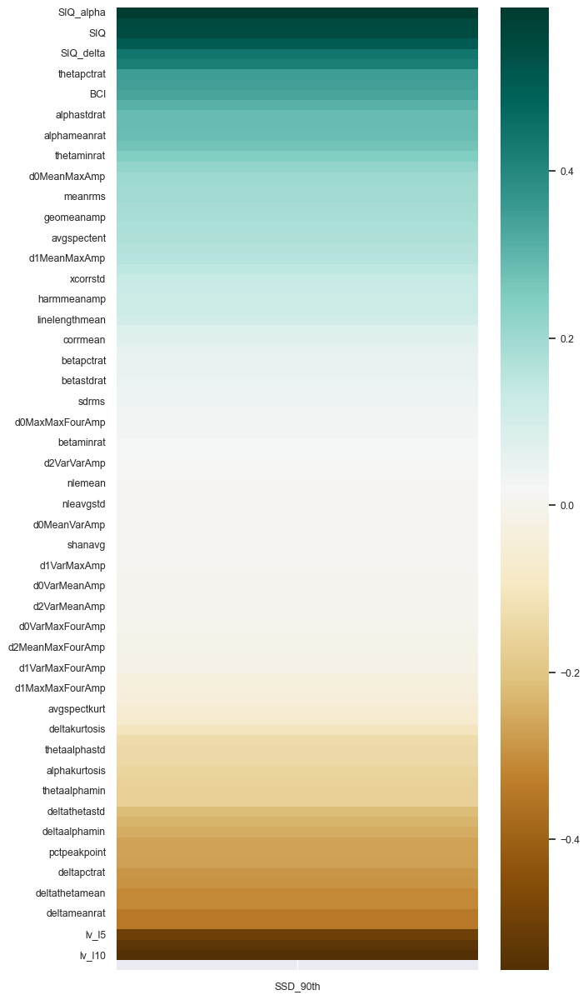

In [141]:
# plot/save corr plot
plt.figure(figsize=(7, 15))
sns.set_style('whitegrid')
sns.set(font_scale=0.8)

corr_matrix = df.corr()

# Isolate the column corresponding to `exam_score`
corr_matrix= corr_matrix.sort_values(by=['SSD_90th'],ascending=False)

corr_target = corr_matrix[['SSD_90th']].drop(labels=['SSD_90th'])

sns.heatmap(corr_target, annot=False, fmt='.3', cmap='BrBG')
plt.show()


# plt.savefig(r'/content/drive/My Drive/plots/PCA_outcome_corr.jpg')
# plt.savefig(r'/content/drive/My Drive/plots/PCA_outcome_corr.svg')

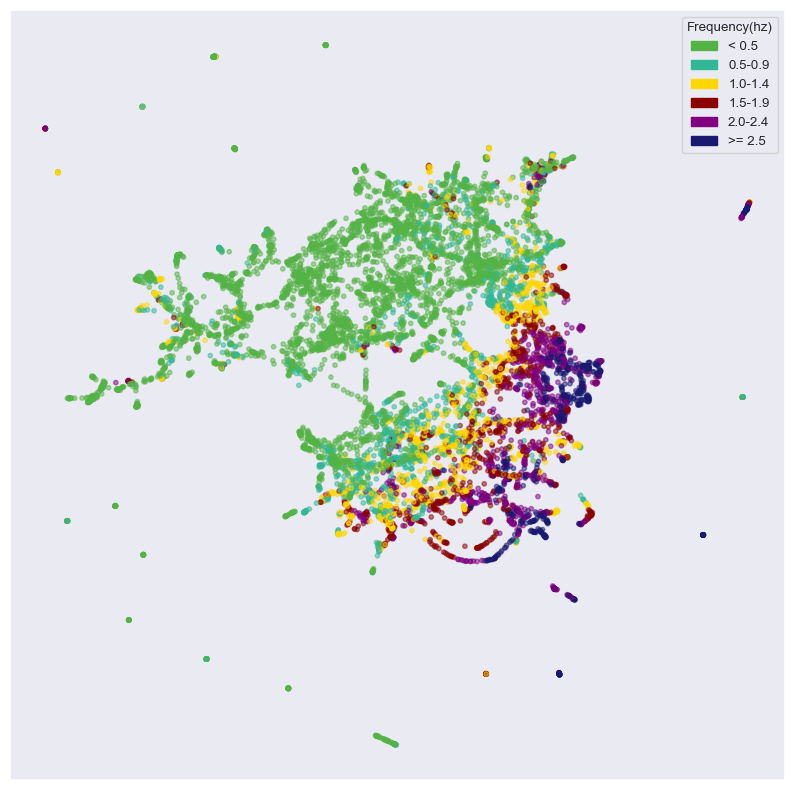

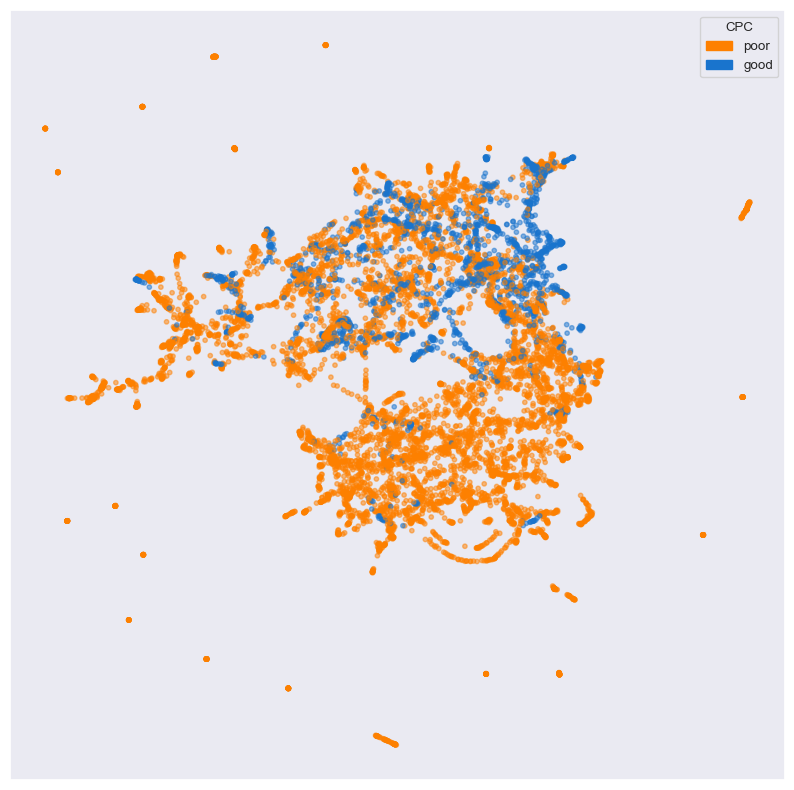

In [143]:
# define model
model = pacmap.PaCMAP(intermediate=True,random_state=1989) #MN_ratio=0.2,n_neighbors=500
fitted_model = model.fit_transform(df.values,init="pca")# init="pca"
fitted_model_last_model = fitted_model[-1] # choose last iteration of pacmap
cat_target = target.astype(str)

new_target = df_raw['pat_freq_hour']

fig, ax = plt.subplots(figsize=(10, 10))
colors = {
    '< 0.5': '#54B345' ,
    '0.5-0.9': '#32B897',
    '1.0-1.4': '#FFD700',
    '1.5-1.9': '#8B0000',
    '2.0-2.4': '#800080',
    '>= 2.5': '#191970'
}
ax.scatter(fitted_model_last_model[:, 0], fitted_model_last_model[:, 1], c=new_target.map(colors), s=10,alpha=0.5)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels,fontsize='medium',title='Frequency(hz)')

# plt.savefig(r'PCA_freq.jpg')
# plt.savefig(r'PCA_freq.svg')

fig, ax = plt.subplots(figsize=(10, 10))
colors = {'poor':"#FE8000", 'good':"#1974CD"}

ax.scatter(fitted_model_last_model[:, 0], fitted_model_last_model[:, 1], c=target.map(colors), s=10,alpha=0.5)
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels,fontsize='medium',title='CPC')

plt.savefig(r'PCA_freq_cpc.jpg')
plt.savefig(r'PCA_freq_cpc.svg')


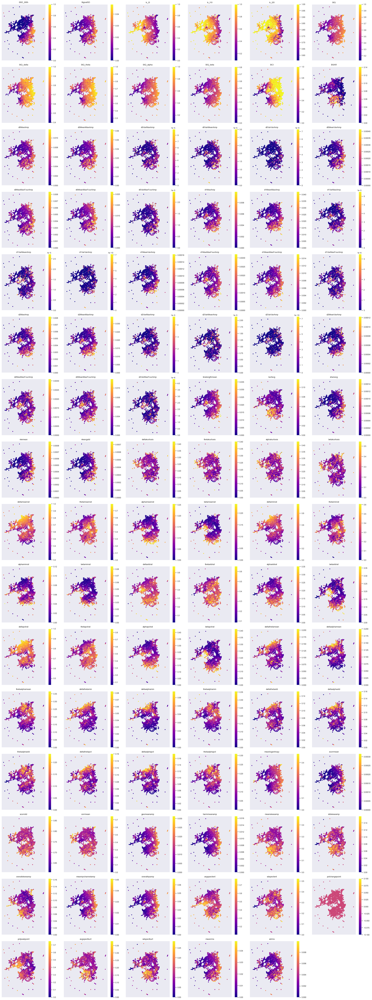

In [12]:
# remove outliers from feature data

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df_smooth = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR)))]

PCA_features = df.columns.tolist()
n_feats = len(PCA_features)

ncols = 6
nrows = math.ceil(n_feats / ncols)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axs = axs.flatten()

for i, feature in enumerate(PCA_features):
    ax = axs[i]
    im = ax.scatter(
        fitted_model_last_model[:, 0],
        fitted_model_last_model[:, 1],
        c=df_smooth[feature],
        s=4,
        cmap="plasma"
    )
    ax.set_title(feature)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(im, ax=ax)


for j in range(n_feats, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()




In [13]:
top_features = sorted_feats.index.tolist()

selected_features = top_features[:13]

print(selected_features)

['meanskewamp', 'kurtavg', 'corrmean', 'overallskewamp', 'SSD_90th', 'avgspectkurt', 'BSAR', 'xcorrstd', 'thetaalphamean', 'stdskewamp', 'thetaalphapct', 'BCI', 'thetakurtosis']


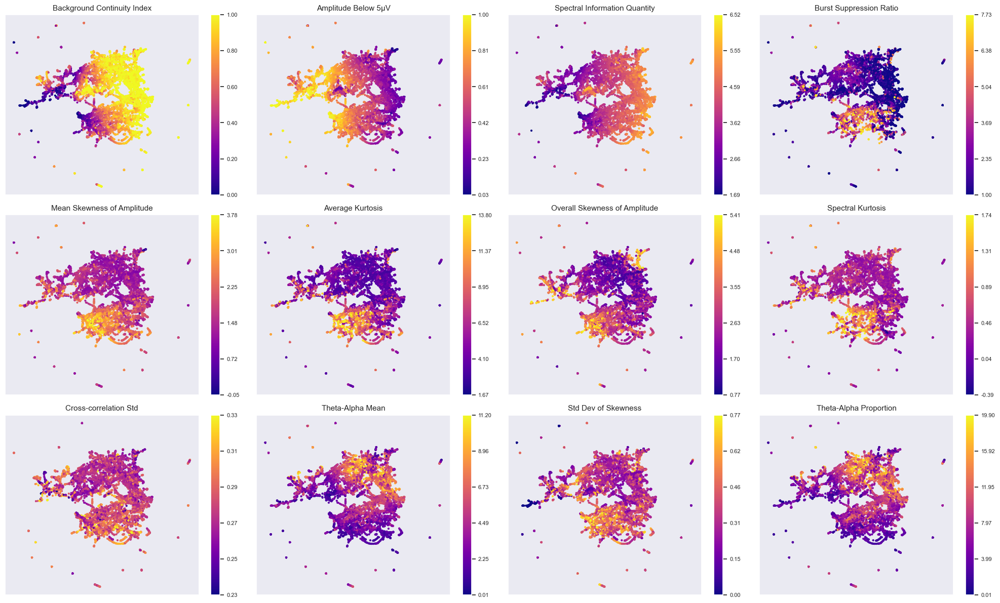

In [138]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.ticker import FormatStrFormatter

# ==== 数据预处理 ====
df_orig = df_raw[scale_feats].copy()
df_orig = df_orig.replace([np.inf, -np.inf], np.nan)
df_orig = df_orig.fillna(df_orig.mean())

# 去极端值（IQR 方法）
Q1 = df_orig.quantile(0.25)
Q3 = df_orig.quantile(0.75)
IQR = Q3 - Q1
df_orig_smooth = df_orig[~((df_orig < (Q1 - 1.5 * IQR)) | (df_orig > (Q3 + 1.5 * IQR)))]

# ==== 特征名与映射 ====
selected_features = [
    'BCI','lv_l5','SIQ','BSAR','meanskewamp', 'kurtavg',
    'overallskewamp', 'avgspectkurt', 'xcorrstd', 'thetaalphamean',
    'stdskewamp', 'thetaalphapct'
]

feature_names = {
    'BCI': 'Background Continuity Index',
    'lv_l5': 'Amplitude Below 5μV',
    'SIQ': 'Spectral Information Quantity',
    'meanskewamp': 'Mean Skewness of Amplitude',
    'kurtavg': 'Average Kurtosis',
    'overallskewamp': 'Overall Skewness of Amplitude',
    'avgspectkurt': 'Spectral Kurtosis',
    'BSAR': 'Burst Suppression Ratio',
    'xcorrstd': 'Cross-correlation Std',
    'thetaalphamean': 'Theta-Alpha Mean',
    'stdskewamp': 'Std Dev of Skewness',
    'thetaalphapct': 'Theta-Alpha Proportion'
}

# ==== 图布局 ====
n_feats = len(selected_features)
ncols = 4
nrows = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

n_ticks = 6  # ✅ 每个 colorbar 保持 6 个刻度

# ==== 每个特征独立 scale，但 colorbar ticks 统一 & 格式化 ====
for i, feature in enumerate(selected_features):
    ax = axs[i]
    vals = df_orig_smooth[feature]
    vmin, vmax = vals.min(), vals.max()
    
    im = ax.scatter(
        fitted_model_last_model[:, 0],
        fitted_model_last_model[:, 1],
        c=vals,
        s=4,
        cmap="plasma",
        vmin=vmin,
        vmax=vmax
    )

    display_name = feature_names.get(feature, feature)
    ax.set_title(display_name, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # ✅ colorbar with fixed tick count and 2-decimal formatting
    cbar = fig.colorbar(im, ax=ax, ticks=np.linspace(vmin, vmax, n_ticks))
    cbar.ax.tick_params(labelsize=8)
    cbar.ax.yaxis.set_major_formatter(FormatStrFormatter("%.2f"))

# 关闭多余子图
for j in range(n_feats, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


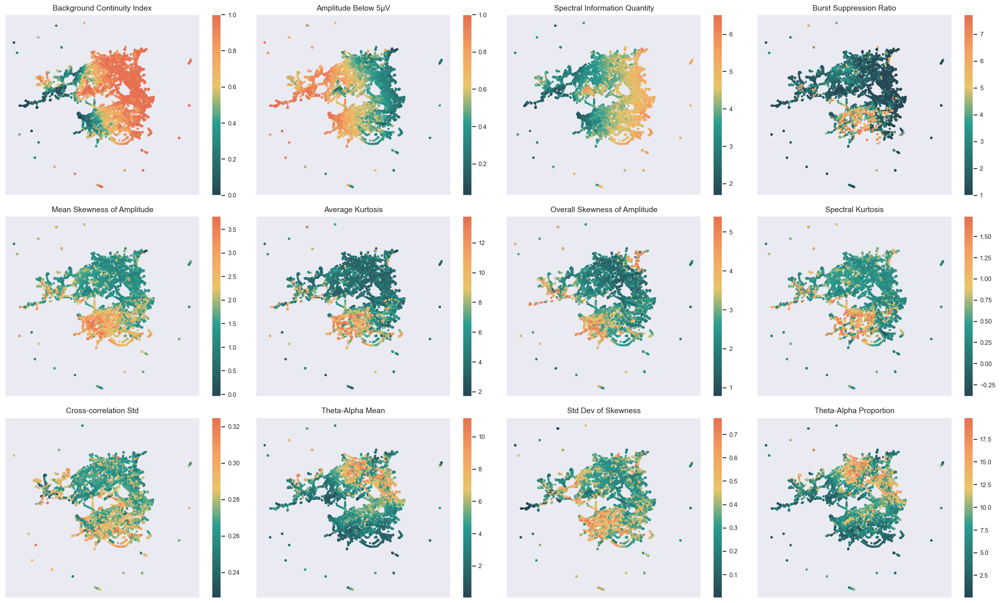

In [16]:
import matplotlib.pyplot as plt
import math
from matplotlib.colors import LinearSegmentedColormap
import numpy as np

# ==== 备份原始特征列 ====
df_orig = df_raw[scale_feats].copy()
df_orig = df_orig.replace([np.inf, -np.inf], np.nan)
df_orig = df_orig.fillna(df_orig.mean())

# ==== 去极端值（IQR方法）====
Q1 = df_orig.quantile(0.25)
Q3 = df_orig.quantile(0.75)
IQR = Q3 - Q1
df_orig_smooth = df_orig[~((df_orig < (Q1 - 1.5 * IQR)) | (df_orig > (Q3 + 1.5 * IQR)))]

# ==== 特征名与解释 ====
selected_features = [
    'BCI','lv_l5','SIQ','BSAR','meanskewamp', 'kurtavg',
    'overallskewamp', 'avgspectkurt', 'xcorrstd', 'thetaalphamean',
    'stdskewamp', 'thetaalphapct'
]

feature_names = {
    'BCI': 'Background Continuity Index',
    'lv_l5': 'Amplitude Below 5μV',
    'SIQ': 'Spectral Information Quantity',
    'meanskewamp': 'Mean Skewness of Amplitude',
    'kurtavg': 'Average Kurtosis',
    'overallskewamp': 'Overall Skewness of Amplitude',
    'avgspectkurt': 'Spectral Kurtosis',
    'BSAR': 'Burst Suppression Ratio',
    'xcorrstd': 'Cross-correlation Std',
    'thetaalphamean': 'Theta-Alpha Mean',
    'stdskewamp': 'Std Dev of Skewness',
    'thetaalphapct': 'Theta-Alpha Proportion'
}

# ==== 定义自定义 colormap ====
custom_rgb = [
    (38, 70, 83),
    (40, 114, 113),
    (41, 157, 144),
    (232, 197, 107),
    (243, 162, 97),
    (230, 111, 81)
]
custom_rgb_norm = [(r / 255.0, g / 255.0, b / 255.0) for r, g, b in custom_rgb]
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", custom_rgb_norm)

# ==== 3x4 layout ====
n_feats = len(selected_features)
ncols = 4
nrows = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5 * ncols, 4 * nrows))
axs = axs.flatten()

for i, feature in enumerate(selected_features):
    ax = axs[i]
    im = ax.scatter(
        fitted_model_last_model[:, 0],
        fitted_model_last_model[:, 1],
        c=df_orig_smooth[feature],
        s=4,
        cmap=custom_cmap  # 使用自定义 colormap 替代 plasma
    )
    display_name = feature_names.get(feature, feature)
    ax.set_title(display_name, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(im, ax=ax)

# 关闭多余子图
for j in range(n_feats, len(axs)):
    axs[j].axis('off')

plt.tight_layout()
plt.show()

# DL

In [94]:
def create_ssd_artifact_array(ssd_files_location, CPC_file_location):
    clinical_data = pd.read_csv(CPC_file_location)
    
    array, array_lookup = [], []
    
    files = [f for f in os.listdir(ssd_files_location) if f.endswith('.mat')]
    files.sort()
    
    cur_patient = None
    cur_idx = -1
    
    for file_name in files:
        file_name, _ = os.path.splitext(file_name)
        file_parts = file_name.split('_')
        patient_id = 'ICARE_' + file_parts[4]
        if patient_id not in clinical_data['pat_ICARE'].values:
            continue
        
        if patient_id != cur_patient:
            if cur_idx >= 0:
                array.append(array_pat)

            array_pat = []
            cur_patient = patient_id
            cur_idx += 1
            
            array_lookup.append([None] * 7)  # Initialize with placeholders
            array_lookup[cur_idx][0] = cur_patient
            
            idx_match = clinical_data['pat_ICARE'] == cur_patient
            array_lookup[cur_idx][1] = clinical_data.loc[idx_match, 'time_to_CA(seconds)'].values[0]
            cpc = clinical_data.loc[idx_match, 'cpc'].values[0]
            age = clinical_data.loc[idx_match, 'age'].values[0]
            sex = clinical_data.loc[idx_match, 'sex'].values[0]
            vfib = clinical_data.loc[idx_match, 'vfib'].values[0]
            
            base_file_date_str = file_parts[5] + ' ' + file_parts[6]
            base_file_date = datetime.strptime(base_file_date_str, "%Y%m%d %H%M%S")
            array_lookup[cur_idx][2] = base_file_date
            
            array_lookup[cur_idx][3] = cpc
            array_lookup[cur_idx][4] = age
            array_lookup[cur_idx][5] = sex
            array_lookup[cur_idx][6] = vfib
        
        full_filename = os.path.join(ssd_files_location, file_name)
        file_import = loadmat(full_filename)
        
        if 'Spike_freq_approaches' not in file_import:
            seiz_predic = [-1]
        else:
            seiz_predic = [approach[0, 9] for approach in file_import['Spike_freq_approaches'][0]]
        array_pat.extend(seiz_predic)
    
    array.append(array_pat)
    
    return array, array_lookup

def create_array_FEATURES(feature_files_location, patient_id, cohort_type):
    feature_file_dir = os.path.join(feature_files_location, cohort_type)
    patient_all_files = [f for f in os.listdir(feature_file_dir) if patient_id in f]
    patient_all_files.sort()

    # Load feature names
    feature_file = "new_icare_features_new/BWH/feature_ICARE_0520_20140131_111546.mat"
    mat_data = mat73.loadmat(feature_file)
    feature_names = [name for name in mat_data['x'] if 'org_set' not in name]
    
    # Initialize features dictionary
    features_array = {}
    for feat_name in feature_names:
        features_array[feat_name] = []

    # Process each file
    for file_name in patient_all_files: 
        try:
            data = mat73.loadmat(os.path.join(feature_file_dir, file_name))
            x = data['x']
        except Exception as e:
            print(f"Error loading {file_name}: {e}")
            return None
        
        # Append features
        for feat_name in feature_names:
            if feat_name not in x:
                return None
            if type(x[feat_name]) != np.ndarray:
                continue
            current_feature = x[feat_name].flatten()
            features_array[feat_name].extend(current_feature)
    
    return features_array
# Directory containing the .mat files
feature_directory = "new_icare_features_new"
ssd_directory = "Spike_freq"
clinical_data = "Data/ICARE_clinical.csv"
patient_directory = "Data/patient_directory_mapping.csv"
ID_converter = "Data/ICARE_ID_conversion.csv"
patient_cohort = "Data/uniqueID_SSD.csv"
# List to hold EEG data grouped by patient
all_feature_data = []

array, array_lookup = create_ssd_artifact_array(ssd_directory, clinical_data)

cohort = pd.read_csv(patient_cohort)
converter = pd.read_csv(ID_converter)
# Create a mapping from pat_ID to directory
pat_id_to_dir = {row['original_names']: row['convert_names'] for _, row in converter.iterrows()}
valid_pat_ids = [pat_id_to_dir.get(pat_id, None) for pat_id in cohort['pat_ID']]

for patient_idx, (pat_id, *_) in enumerate(array_lookup):
    if array_lookup[patient_idx][0] not in valid_pat_ids:
        continue
    # Prepare patient SSD array
    new_pat_array = array[patient_idx].copy()
    # Interpolate missing values using PCHIP
    new_pat_array = pd.Series(new_pat_array).interpolate(method='pchip').to_numpy()
    patient_df = pd.read_csv(patient_directory)
    cohort_type = patient_df.loc[patient_df['pat_ID'] == pat_id, 'directory']
    if cohort_type.empty:
        continue
    feat_array = create_array_FEATURES(feature_directory, pat_id, cohort_type.values[0])
    if not feat_array:
        continue

    CA_to_first_EEG = array_lookup[patient_idx][1]
    CA_to_EEG_diff = int(CA_to_first_EEG / 10)
    CA_to_EEG_diff_array = np.full(CA_to_EEG_diff, np.nan)  # Pre-padding
    new_pat_array = np.concatenate([CA_to_EEG_diff_array, new_pat_array])
    feat_array = {key: np.concatenate([CA_to_EEG_diff_array, value]) for key, value in feat_array.items()}
    #for segment_start in range(5760, 24840, 360): # 16 to 68 hours, 1 hr time points
    for segment_start in range(2160, 24840, 360): # 6 to 68 hours, 1 hr time points
    #for segment_start in range(2160, 30240, 360):  # 6 to 84 hours, 1-hour intervals
        result_entry = {}
        for feature_name in feat_array.keys(): # feature names
            feature_data = feat_array[feature_name]
            if segment_start >= len(feature_data):
                continue
            one_hour_feature_data = feature_data[segment_start:min(segment_start + 360, len(feature_data))]
            one_hour_feature_data = np.where(np.isinf(one_hour_feature_data), np.nan, one_hour_feature_data)
            result_entry[feature_name] = np.nanmean(one_hour_feature_data) if np.isfinite(one_hour_feature_data).any() else np.nan
            result_entry[feature_name] = np.nan if np.isinf(result_entry[feature_name]) else result_entry[feature_name]
        if segment_start < len(new_pat_array): # ssd
            one_hour_array = new_pat_array[segment_start:min(segment_start + 360, len(new_pat_array))]
            one_hour_array = np.where(np.isinf(one_hour_array), np.nan, one_hour_array)
            result_entry['ssd'] = np.percentile(one_hour_array, 90) if np.isfinite(one_hour_array).any() else np.nan
            result_entry['ssd'] = np.nan if np.isinf(result_entry['ssd']) else result_entry['ssd']
        else:
            continue
        result_entry['cpc'] = array_lookup[patient_idx][3]
        result_entry['pat_ID'] = array_lookup[patient_idx][0]
        result_entry['hour'] = (segment_start // 360)
        
        all_feature_data.append(result_entry)

all_feature_data = pd.DataFrame(all_feature_data)
all_feature_data.to_csv("all_feature_data.csv")

print("Done")

Error loading feature_ICARE_0385_20131017_063113.mat: new_icare_features_new\UTW\feature_ICARE_0385_20131017_063113.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0504_20140224_231832.mat: new_icare_features_new\UTW\feature_ICARE_0504_20140224_231832.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0700_20141008_071012.mat: new_icare_features_new\BWH\feature_ICARE_0700_20141008_071012.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_0717_20130104_052259.mat: new_icare_features_new\UTW\feature_ICARE_0717_20130104_052259.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Error loading feature_ICARE_1020_20140309_114427.mat: new_icare_features_new\UTW\feature_ICARE_1020_20140309_114427.mat is not a MATLAB 7.3 file. Load with scipy.io.loadmat() instead.
Done


In [2]:
import pandas as pd

# 1. Load all_feature_data (and remove any Unnamed columns)
#df_features = pd.read_csv("all_feature_data.csv")
df_features = pd.read_csv("all_feature_data_6-84.csv")
df_features = df_features.loc[:, ~df_features.columns.str.contains(r'^Unnamed')]

# 2. Normalize pat_ID format: change “ICARE-xxxx” to “ICARE_xxxx”
df_features['pat_ID'] = df_features['pat_ID'].str.replace('-', '_')

# 3. Merge cluster labels first (at this point, pat_IDs are in ICARE_xxxx format, matching clusters_ssd_only.csv)
df_clusters = pd.read_csv("clusters_ssd_only.csv")  # contains pat_ID, cluster
df_features = df_features.merge(
    df_clusters[['pat_ID','cluster']],
    on='pat_ID',
    how='left'
)

# 4. Load conversion table and build mapping (convert_names → original_names)
df_conv = pd.read_csv("Data/ICARE_ID_conversion.csv")  # contains original_names, convert_names
conv_map = dict(zip(df_conv['convert_names'], df_conv['original_names']))

# 5. Map pat_ID in features from “ICARE_xxxx” back to original clinical IDs
df_features['pat_ID'] = df_features['pat_ID'].map(conv_map)

# 6. Load clinical data and keep required columns
df_clinical = (
    pd.read_excel("Data/clinical_data.xlsx")
      .rename(columns={"sid": "pat_ID"})
      [["pat_ID", "age", "sex", "vfib"]]
)

# 7. Merge clinical table (at this point, df_features.pat_ID is already in original clinical ID format)
df_merged = df_features.merge(df_clinical, on="pat_ID", how="left")

# 8. Drop rows where all extra features (except core columns) are NaN
essential = {'ssd', 'cpc', 'pat_ID', 'hour', 'age', 'sex', 'vfib', 'cluster'}
extras = [c for c in df_merged.columns if c not in essential]

before = len(df_merged)
df_merged = df_merged.dropna(subset=extras, how='all')
after  = len(df_merged)
print(f"Dropped {before-after} rows with no extra features; {after} rows remain.")

# 9. Save final result
df_merged.to_csv("merged_all_features_clinical.csv", index=False)


Dropped 2846 rows with no extra features; 12806 rows remain.


In [3]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

def preprocess_seq(
    path_csv,
    feature_list=None,
    use_clinical=False,
    label_type='cpc',        # 'cpc' or 'kmeans'
    binary_labels=False,     # whether to merge cluster 2 into 1 when using kmeans
    start=6,
    end=68
):
    """
    Load and preprocess merged_all_features_clinical.csv into X, y for time-series models.

    Returns:
      X: np.ndarray of shape (n_samples, T, n_features)
      y: np.ndarray of shape (n_samples,)
      feat_cols: list of feature column names
    """
    # 1. Load CSV and drop Unnamed columns & columns with all NaNs
    df = pd.read_csv(path_csv)
    df = df.loc[:, ~df.columns.str.contains(r'^Unnamed')]
    df = df.dropna(axis=1, how='all')

    # 2. Ensure key fields
    df['hour'] = pd.to_numeric(df['hour'], errors='coerce')
    label_col = 'cpc' if label_type=='cpc' else 'cluster'
    df = df.dropna(subset=['pat_ID', 'hour', label_col])

    # 3. Handle clinical variables
    clinical_cols = ['age', 'sex', 'vfib']
    for c in clinical_cols:
        if c in df.columns:
            if df[c].dtype == object or df[c].dtype.name=='category':
                df[c] = LabelEncoder().fit_transform(df[c].astype(str))
            else:
                df[c] = pd.to_numeric(df[c], errors='coerce')
    if use_clinical:
        df[clinical_cols] = df[clinical_cols].fillna(df[clinical_cols].mean())

    # 4. Generate y
    if label_type == 'cpc':
        def _map_cpc(x):
            xs = str(x).strip().lower()
            if xs in ('good outcome','good','1','2'): return 1
            if xs in ('bad outcome','poor','3','4','5'): return 0
            try: return 1 if int(float(x)) in (1,2) else 0
            except: return np.nan
        df['y'] = df[label_col].apply(_map_cpc).astype('Int64')
        df = df.dropna(subset=['y'])
        df['y'] = df['y'].astype(int)
    else:
        df[label_col] = df[label_col].astype(int)
        if binary_labels:
            # 1) Build patient-level table: one row per pat_ID, with cpc + cluster
            pat_df = (
                df[['pat_ID', 'cpc', 'cluster']]
                .drop_duplicates(subset='pat_ID')
                .copy()
            )
            pat_df['cpc'] = pd.to_numeric(pat_df['cpc'], errors='coerce')

            # 2) Mark good outcome
            pat_df['is_good'] = pat_df['cpc'].isin([1, 2])

            # 3) Compute good ratio per cluster
            cluster_ratios = (
                pat_df
                .groupby('cluster')['is_good']
                .mean()
            )

            # 4) Identify the two clusters with lowest good ratio
            poor_clusters = cluster_ratios.nsmallest(2).index.tolist()

            # 5) Create binary label y in pat_df: poor_clusters → 0, others → 1
            pat_df['y'] = pat_df['cluster'].apply(
                lambda cl: 0 if cl in poor_clusters else 1
            )

            # 6) Merge patient-level y back to original df
            df = df.merge(
                pat_df[['pat_ID', 'y']],
                on='pat_ID',
                how='left'
            )

        else:
            # Use original cluster directly as label without merging
            df['y'] = df[label_col]

    # 5. Determine feature columns
    if feature_list is not None:
        feat_cols = feature_list.copy()
    else:
        forbidden = {'pat_ID', 'hour', 'cpc', 'cluster'}
        if not use_clinical:
            forbidden |= set(clinical_cols)
        feat_cols = [c for c in df.columns if c not in forbidden]

    # 6. Drop features that are entirely NaN
    feat_cols = [c for c in feat_cols if not df[c].isna().all()]

    # 7. Replace Inf with NaN → fill with mean → fill remaining with 0
    df[feat_cols] = df[feat_cols].replace([np.inf, -np.inf], np.nan)
    df[feat_cols] = df[feat_cols].fillna(df[feat_cols].mean())
    df[feat_cols] = df[feat_cols].apply(
        lambda col: np.nan_to_num(col, nan=0.0, posinf=0.0, neginf=0.0)
    )

    # 8. Normalize to [0,1]
    df[feat_cols] = MinMaxScaler().fit_transform(df[feat_cols])

    # 9. Assemble sequences by pat_ID + hour
    T = end - start
    X_list, y_list = [], []
    for pid, grp in df.groupby('pat_ID'):
        sub = grp[(grp['hour']>=start)&(grp['hour']<end)]
        if sub.empty:
            continue
        seq = np.zeros((T, len(feat_cols)), dtype=float)
        for _, row in sub.iterrows():
            idx = int(row['hour']) - start
            if 0 <= idx < T:
                seq[idx] = row[feat_cols].values
        X_list.append(seq)
        y_list.append(sub['y'].iloc[0])

    X = np.stack(X_list) if X_list else np.empty((0, T, len(feat_cols)))
    y = np.array(y_list, dtype=int)

    return X, y, feat_cols


In [4]:
from sklearn.utils import resample
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
from collections import Counter
from torch.optim.lr_scheduler import ReduceLROnPlateau


class LSTMBinary(nn.Module):
    def __init__(self, input_dim, hidden_size=64, num_layers=1, bidirectional=True, dropout=0.2):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_directions = 2 if bidirectional else 1
        # bi LSTM
        self.lstm = nn.LSTM(
            input_dim,
            hidden_size,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        # Attention 
        self.attn_proj = nn.Linear(hidden_size * self.num_directions, hidden_size * self.num_directions)
        self.attn_score = nn.Linear(hidden_size * self.num_directions, 1, bias=False)
        self.dropout = nn.Dropout(dropout)
        # Class Head
        self.fc = nn.Linear(hidden_size * self.num_directions, 1)

    def forward(self, x):
        # x: [B, T, F]
        H, _ = self.lstm(x)                       # H: [B, T, D*H]
        H = self.dropout(H)
        u = torch.tanh(self.attn_proj(H))        # u: [B, T, D*H]
        scores = self.attn_score(u).squeeze(-1)  # scores: [B, T]
        alpha = torch.softmax(scores, dim=1).unsqueeze(-1)  # alpha: [B, T, 1]
        z = torch.sum(alpha * H, dim=1)          # z: [B, D*H]
        return self.fc(z)                        #  logits

class LSTMMulti(nn.Module):
    def __init__(self, input_dim, num_classes, hidden_size=64, num_layers=1, bidirectional=True, dropout=0.2):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_directions = 2 if bidirectional else 1
        # bi LSTM
        self.lstm = nn.LSTM(
            input_dim,
            hidden_size,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        # Attention 层
        self.attn_proj = nn.Linear(hidden_size * self.num_directions, hidden_size * self.num_directions)
        self.attn_score = nn.Linear(hidden_size * self.num_directions, 1, bias=False)
        self.dropout = nn.Dropout(dropout)

        self.fc = nn.Linear(hidden_size * self.num_directions, num_classes)

    def forward(self, x):
        # x: [B, T, F]
        H, _ = self.lstm(x)                       # H: [B, T, D*H]
        H = self.dropout(H)

        u = torch.tanh(self.attn_proj(H))        # u: [B, T, D*H]
        scores = self.attn_score(u).squeeze(-1)  # scores: [B, T]
        alpha = torch.softmax(scores, dim=1).unsqueeze(-1)  # alpha: [B, T, 1]

        z = torch.sum(alpha * H, dim=1)          # z: [B, D*H]
        return self.fc(z)                        #  logits for CrossEntropy

        
def balance_by_duplication(X, y, target_dist='equal'):
    from collections import Counter
    classes = np.unique(y)
    counts = Counter(y)
    max_n = max(counts.values()) if target_dist == 'equal' else int(target_dist)

    X_out, y_out = [], []
    for cls in classes:
        X_cls = X[y == cls]
        n_needed = max_n - len(X_cls) if target_dist == 'equal' else max_n
        if n_needed > 0:
            X_aug = resample(X_cls, replace=True, n_samples=n_needed, random_state=42)
            X_out.append(np.concatenate([X_cls, X_aug]))
            y_out.append(np.array([cls] * (len(X_cls) + n_needed)))
        else:
            X_out.append(X_cls)
            y_out.append(np.array([cls] * len(X_cls)))
    return np.concatenate(X_out), np.concatenate(y_out)

In [5]:
# {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 500}
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# ——— Load & clean ———
DATASET = "merged_all_features_clinical.csv"
df = pd.read_csv(DATASET)
df.dropna(axis=0, inplace=True)

# ——— Define feature columns ———
drop_feats = [
    'pat_ID', 'cluster', 'cpc', 'hour', 'age', 'sex', 'vfib'
]
feature_columns = [c for c in df.columns if c not in drop_feats]

# ——— Prepare X and y ———
X    = df[feature_columns].values
y_cpc = df['cpc'].values
y_km  = df['cluster'].values

# ——— Fit CPC binary classification RF with best hyperparameters ———
best_params_cpc = {
    'n_estimators':      500,
    'max_depth':         10,
    'min_samples_split': 5,
    'min_samples_leaf':  1,
}
rf_cpc = RandomForestClassifier(**best_params_cpc, random_state=42)
rf_cpc.fit(X, y_cpc)
imp_cpc = rf_cpc.feature_importances_

# ——— Fit K-means multi-class RF with best hyperparameters ———
best_params_km = {
    'n_estimators':      500,
    'max_depth':         10,
    'min_samples_split': 5,
    'min_samples_leaf':  1,
}
rf_km = RandomForestClassifier(**best_params_km, random_state=42)
rf_km.fit(X, y_km)
imp_km = rf_km.feature_importances_

# 1) Sort CPC features by importance in descending order
s_cpc = pd.Series(imp_cpc, index=feature_columns)
sorted_feats_cpc = s_cpc.sort_values(ascending=False).index.tolist()
print("CPC features sorted by importance:")
print(sorted_feats_cpc)

# 2) Sort k-means label features by importance in descending order
s_km = pd.Series(imp_km, index=feature_columns)
sorted_feats_km = s_km.sort_values(ascending=False).index.tolist()
print("\nk-means features sorted by importance:")
print(sorted_feats_km)


CPC features sorted by importance:
['meanskewamp', 'corrmean', 'overallskewamp', 'kurtavg', 'thetaalphamean', 'xcorrstd', 'ssd', 'thetaalphapct', 'avgspectkurt', 'd2MaxMaxFourAmp', 'thetakurtosis', 'd1MaxMaxFourAmp', 'betameanrat', 'alphameanrat', 'avgspectent', 'thetaalphastd', 'pctpeakpoint', 'alphakurtosis', 'stdskewamp', 'd1VarMaxFourAmp', 'thetaalphamin', 'd2VarMaxFourAmp', 'BSAR', 'deltaalphamean', 'd2VarMeanAmp', 'betakurtosis', 'BCI', 'deltastdrat', 'betaminrat', 'lv_l5', 'deltakurtosis', 'sdrms', 'alphapctrat', 'd1MeanMaxFourAmp', 'd2MeanMaxFourAmp', 'SIQ_alpha', 'd1VarMeanAmp', 'alphaminrat', 'SIQ_theta', 'thetapctrat', 'sdspectent', 'SIQ_delta', 'thetastdrat', 'sdspectkurt', 'd0MeanMaxFourAmp', 'alphastdrat', 'betapctrat', 'meanlogentropy', 'deltaalphapct', 'thetameanrat', 'deltaalphamin', 'deltathetamin', 'betastdrat', 'd1MaxAmp', 'overalliqramp', 'deltaalphastd', 'd0MaxMaxFourAmp', 'SIQ', 'deltathetamean', 'thetaminrat', 'd0MaxAmp', 'd0VarMaxAmp', 'lv_l10', 'harmmeanamp', 

In [21]:
#CPC features sorted by importance:
#sorted_feats_cpc=['meanskewamp', 'corrmean', 'overallskewamp', 'kurtavg', 'thetaalphamean', 'xcorrstd', 'thetaalphapct', 'ssd', 'thetakurtosis', 'd2MaxMaxFourAmp', 'avgspectkurt', 'd1MaxMaxFourAmp', 'thetaalphastd', 'alphameanrat', 'stdskewamp', 'alphakurtosis', 'avgspectent', 'BSAR', 'betameanrat', 'd2VarMeanAmp', 'pctpeakpoint', 'deltakurtosis', 'BCI', 'd1VarMaxFourAmp', 'deltaalphamean', 'thetaalphamin', 'd2VarMaxFourAmp', 'betakurtosis', 'betaminrat', 'SIQ_theta', 'lv_l5', 'sdrms', 'd1MeanMaxFourAmp', 'deltastdrat', 'SIQ_alpha', 'SIQ_delta', 'thetastdrat', 'sdspectkurt', 'thetapctrat', 'deltathetamin', 'alphapctrat', 'd1VarMeanAmp', 'thetameanrat', 'd2MeanMaxFourAmp', 'deltaalphastd', 'd1VarMaxAmp', 'sdspectent', 'd0MaxAmp', 'deltaalphamin', 'alphaminrat', 'overalliqramp', 'd0MaxMaxFourAmp', 'meanlogentropy', 'd0MeanMaxFourAmp', 'thetaminrat', 'betapctrat', 'SIQ', 'SIQ_beta', 'd1MaxAmp', 'd0VarMaxAmp', 'deltathetamean', 'deltaalphapct', 'alphastdrat', 'betastdrat', 'd2MeanMaxAmp', 'd1MeanMaxAmp', 'd2MaxAmp', 'lv_l10', 'deltathetastd', 'deltathetapct', 'd2VarVarAmp', 'harmmeanamp', 'd1VarVarAmp', 'xcorrmean', 'd2VarMaxAmp', 'deltaminrat', 'deltameanrat', 'deltapctrat', 'd0VarMeanAmp', 'linelengthmean', 'lv_l20', 'd0MeanMaxAmp', 'meaniqrchannelamp', 'geomeanamp', 'd0VarMaxFourAmp', 'd2MeanVarAmp', 'd1MeanVarAmp', 'SignalSD', 'meanrms', 'd0VarVarAmp', 'nleavgstd', 'nlemean', 'd0MeanVarAmp', 'shanavg', 'pctchangepoint']

#k-means features sorted by importance:
#sorted_feats_km=['ssd', 'sdspectent', 'corrmean', 'd2MeanMaxAmp', 'pctpeakpoint', 'meanskewamp', 'BSAR', 'xcorrstd', 'betastdrat', 'd2MaxMaxFourAmp', 'd1MeanMaxAmp', 'thetaalphamin', 'overallskewamp', 'deltastdrat', 'kurtavg', 'stdskewamp', 'deltakurtosis', 'betapctrat', 'meanlogentropy', 'alphastdrat', 'avgspectent', 'deltaalphamin', 'thetakurtosis', 'd1MeanMaxFourAmp', 'avgspectkurt', 'd2MaxAmp', 'SIQ_beta', 'd2MeanMaxFourAmp', 'd1MaxAmp', 'd0MaxAmp', 'betakurtosis', 'alphakurtosis', 'd0MeanMaxAmp', 'lv_l20', 'SIQ_delta', 'd1MaxMaxFourAmp', 'betameanrat', 'SIQ_theta', 'thetastdrat', 'deltathetastd', 'deltaalphastd', 'd2VarMaxFourAmp', 'thetaminrat', 'sdspectkurt', 'deltaminrat', 'alphaminrat', 'alphapctrat', 'd0VarMaxAmp', 'SIQ_alpha', 'alphameanrat', 'BCI', 'deltaalphapct', 'deltameanrat', 'SIQ', 'deltathetapct', 'harmmeanamp', 'd1VarMaxFourAmp', 'sdrms', 'betaminrat', 'overalliqramp', 'thetaalphapct', 'thetameanrat', 'd2VarMeanAmp', 'thetapctrat', 'thetaalphamean', 'deltathetamin', 'deltaalphamean', 'deltapctrat', 'thetaalphastd', 'lv_l10', 'd1MeanVarAmp', 'lv_l5', 'meanrms', 'deltathetamean', 'd0MaxMaxFourAmp', 'geomeanamp', 'd0MeanMaxFourAmp', 'SignalSD', 'linelengthmean', 'd0VarMeanAmp', 'nleavgstd', 'd1VarMeanAmp', 'd0VarMaxFourAmp', 'meaniqrchannelamp', 'd2MeanVarAmp', 'd2VarMaxAmp', 'd1VarMaxAmp', 'd2VarVarAmp', 'xcorrmean', 'd0VarVarAmp', 'shanavg', 'd1VarVarAmp', 'nlemean', 'd0MeanVarAmp', 'pctchangepoint']

In [6]:
from tqdm import tqdm

def make_model_factory(config):
    """
    Generate a model_factory function for run_task_no_cv.

    Parameters:
        config (dict): e.g. {'hidden_size': 128, 'num_layers': 2, 'bidirectional': True, 'dropout': 0.2}
    Returns:
        A model_factory function that creates LSTM models based on the provided configuration.
    """
    def model_factory(is_multiclass, F, num_classes=None):
        cls = LSTMMulti if is_multiclass else LSTMBinary
        kwargs = {
            'input_dim': F,
            'hidden_size': config['hidden_size'],
            'num_layers': config['num_layers'],
            'bidirectional': config['bidirectional'],
            'dropout': config['dropout']
        }
        if is_multiclass:
            kwargs['num_classes'] = num_classes
        return cls(**kwargs)
    
    return model_factory
    

def run_task(
    path_csv,
    features,
    task='cpc',            # 'cpc' or 'cluster'
    binary_labels=False,   # Whether to use binary labels for the cluster task
    use_clinical=False,
    start=16,
    end=68,
    epochs=50,
    batch_size=64,
    out_csv='default.csv',
    model_factory=None,
):
    # Determine label type based on task
    label_type = 'cpc' if task == 'cpc' else 'cluster'
    X_np, y_np, _ = preprocess_seq(
        path_csv,
        feature_list=features,
        use_clinical=use_clinical,
        label_type=label_type,
        binary_labels=binary_labels,
        start=start,
        end=end
    )
    X_np = np.nan_to_num(X_np)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Run on {device}")
    N, T, F = X_np.shape
    class_labels = sorted(np.unique(y_np))
    unique_labels = np.unique(y_np)
    is_multiclass = len(unique_labels) > 2
    label_dtype = torch.long if is_multiclass else torch.float32
    
    # 5-fold stratified cross-validation
    kf = StratifiedKFold(5, shuffle=True, random_state=42)
    records = []

    # Iterate over time points
    for L in tqdm(range(1, T+1), desc="Time points"):
        tp = start + L - 1
        Xw, yw = X_np[:, :L, :], y_np
        # Filter out samples with all-zero features
        mask = ~(Xw.reshape(N, -1) == 0).all(axis=1)
        Xf, yf = Xw[mask], yw[mask]

        # Skip if too few samples
        if len(yf) < 10:
            rec = {'hour': tp, 'AUC': np.nan, 'Accuracy': np.nan}
            rec.update({f'Acc_class_{lbl}': np.nan for lbl in class_labels})
            records.append(rec)
            continue

        fold_aucs, fold_accs = [], []
        per_class_acc = {lbl: [] for lbl in class_labels}

        for tr_idx, te_idx in kf.split(Xf, yf):
            X_tr_raw, y_tr_raw = Xf[tr_idx], yf[tr_idx]
            # Balance classes by duplication
            X_tr_bal, y_tr_bal = balance_by_duplication(X_tr_raw, y_tr_raw, target_dist='equal')

            train_loader = DataLoader(
                TensorDataset(torch.tensor(X_tr_bal, dtype=torch.float32),
                              torch.tensor(y_tr_bal, dtype=torch.long if is_multiclass else torch.float32)),
                batch_size=batch_size, shuffle=True)

            Xte = torch.tensor(Xf[te_idx], dtype=torch.float32).to(device)
            yte = torch.tensor(yf[te_idx], dtype=torch.long if is_multiclass else torch.float32).to(device)

            # Instantiate model
            if model_factory is not None:
                model = model_factory(
                    is_multiclass=is_multiclass,
                    F=F,
                    num_classes=len(unique_labels) if is_multiclass else None
                ).to(device)
            else:
                model = (
                    LSTMMulti(F, num_classes=len(unique_labels))
                    if is_multiclass else
                    LSTMBinary(F)
                ).to(device)

            criterion = nn.CrossEntropyLoss() if is_multiclass else nn.BCEWithLogitsLoss()
            optimizer = optim.Adam(model.parameters(), lr=1e-3)

            # Track best metrics
            best_auc, best_acc = 0, 0
            best_y_pred = None
            
            for epoch in range(epochs):
                # Training step
                model.train()
                for xb, yb in train_loader:
                    xb, yb = xb.to(device), yb.to(device)
                    optimizer.zero_grad()
                    logits = model(xb)
                    logits = logits.view(-1) if not is_multiclass else logits
                    loss = criterion(logits, yb)
                    loss.backward()
                    nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                    optimizer.step()
            
                # Validation step
                model.eval()
                with torch.no_grad():
                    logits_te = model(Xte)
                    probs_te_epoch = (
                        torch.softmax(logits_te, dim=1).cpu().numpy() if is_multiclass
                        else torch.sigmoid(logits_te.view(-1)).cpu().numpy()
                    )
                    y_pred_epoch = (
                        np.argmax(probs_te_epoch, axis=1) if is_multiclass
                        else (probs_te_epoch >= 0.5).astype(int)
                    )
                    # Compute AUC and accuracy
                    try:
                        auc_epoch = (
                            roc_auc_score(yf[te_idx], probs_te_epoch, multi_class='ovr', average='macro')
                            if is_multiclass else roc_auc_score(yf[te_idx], probs_te_epoch)
                        )
                    except:
                        auc_epoch = 0.0
                    acc_epoch = accuracy_score(yf[te_idx], y_pred_epoch)
            
                # Update best metrics on first epoch or if improved
                if epoch == 0 or auc_epoch > best_auc:
                    best_auc = auc_epoch
                    best_acc = acc_epoch
                    best_y_pred = y_pred_epoch
            
            # Record fold metrics
            fold_aucs.append(best_auc)
            fold_accs.append(best_acc)
            cm = confusion_matrix(yf[te_idx], best_y_pred, labels=class_labels)
            for i, lbl in enumerate(class_labels):
                sup = cm[i].sum()
                if sup > 0:
                    per_class_acc[lbl].append(cm[i, i] / sup)

        # Aggregate across folds
        rec = {
            'hour': tp,
            'AUC': np.mean(fold_aucs),
            'Accuracy': np.mean(fold_accs)
        }
        rec.update({f'Acc_class_{lbl}': np.mean(per_class_acc[lbl]) for lbl in class_labels})
        records.append(rec)

    # Save and plot metrics
    df_metrics = pd.DataFrame(records)
    df_metrics.to_csv(out_csv, index=False)
    print(f"Metrics saved to {out_csv}")

    plt.figure(figsize=(8,5))
    plt.plot(df_metrics['hour'], df_metrics['AUC'], '-o', label='AUC')
    plt.plot(df_metrics['hour'], df_metrics['Accuracy'], '-s', label='Accuracy')
    for lbl in class_labels:
        plt.plot(df_metrics['hour'], df_metrics[f'Acc_class_{lbl}'], '--', label=f'Acc class {lbl}')
    plt.xlabel('Hours since ROSC')
    plt.ylabel('Score')
    plt.title(f"LSTM {task.upper()} performance over time")
    plt.legend()
    plt.grid(True)
    plt.show()


Run on cuda


Time points: 100%|█████████████████████████████████████████████████████████████████████| 78/78 [07:55<00:00,  6.10s/it]

Metrics saved to cluster_bi_o.csv


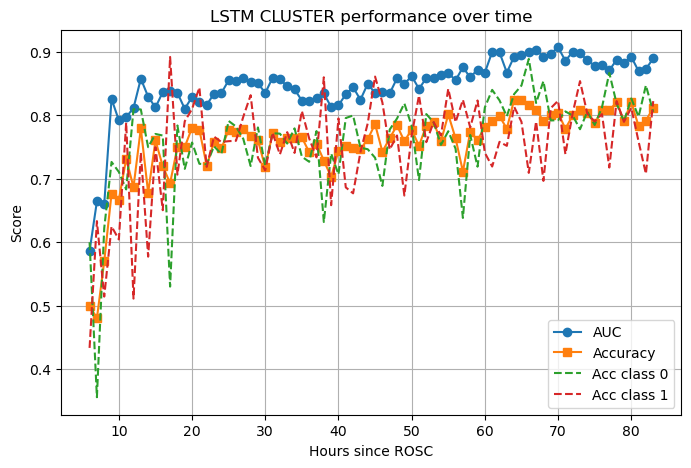

Run on cuda


Time points: 100%|█████████████████████████████████████████████████████████████████████| 78/78 [08:34<00:00,  6.59s/it]

Metrics saved to cluster_mul_o.csv


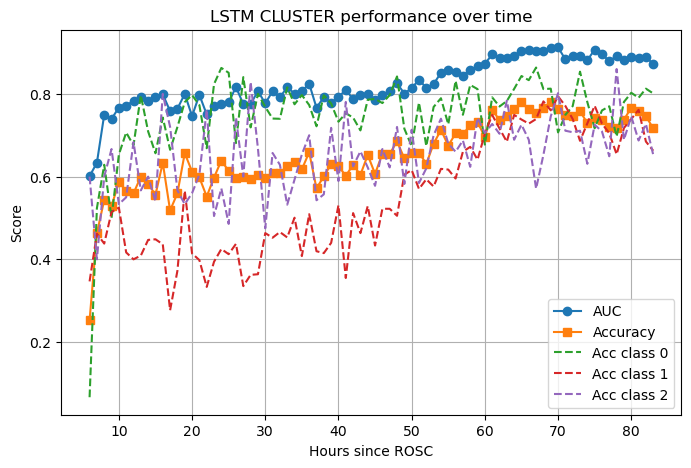

Run on cuda


Time points: 100%|█████████████████████████████████████████████████████████████████████| 78/78 [10:12<00:00,  7.86s/it]

Metrics saved to cpc_cli_o.csv


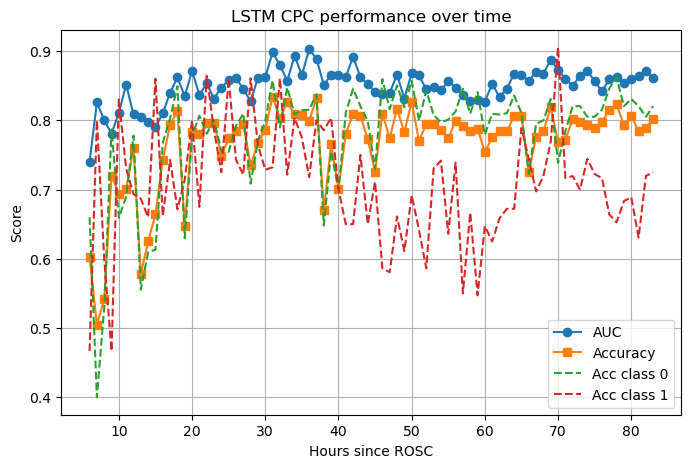

Run on cuda


Time points: 100%|█████████████████████████████████████████████████████████████████████| 78/78 [10:18<00:00,  7.93s/it]

Metrics saved to cpc_nocli_o.csv


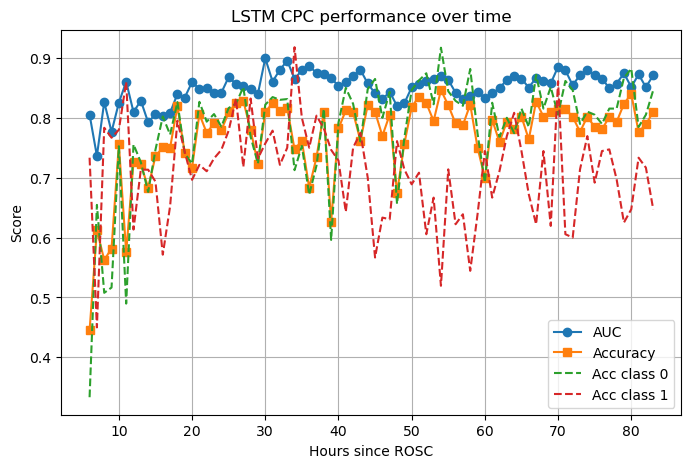

In [7]:
config = {'hidden_size': 32, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.2}
factory = make_model_factory(config)

run_task(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_km[:47],
    task='cluster',
    binary_labels=True,
    use_clinical=False,
    start=6,
    end=84,
    epochs=100,
    batch_size=64,
    out_csv='cluster_bi_o.csv',
    model_factory=factory   
)


config = {'hidden_size': 32, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.2}
factory = make_model_factory(config)

run_task(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_km[:47],
    task='cluster',
    binary_labels=False,
    use_clinical=False,
    start=6,
    end=84,
    epochs=100,
    batch_size=64,
    out_csv='cluster_mul_o.csv',
    model_factory=factory    
)

config = {'hidden_size': 64, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.5}
factory = make_model_factory(config)

run_task(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_cpc[:87],
    task='cpc',
    binary_labels=False,
    use_clinical=True,
    start=6,
    end=84,
    epochs=100,
    batch_size=64,
    out_csv='cpc_cli_o.csv',
    model_factory=factory    
)

config = {'hidden_size': 64, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.5}
factory = make_model_factory(config)

run_task(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_cpc[:87],
    task='cpc',
    binary_labels=False,
    use_clinical=False,
    start=6,
    end=84,
    epochs=100,
    batch_size=64,
    out_csv='cpc_nocli_o.csv',
    model_factory=factory   
)

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_task_metrics(csv_path, task_name="Model"):
    df = pd.read_csv(csv_path)
    print(f"{task_name} metrics loaded from: {csv_path}")
    
    hours = df['hour']
    auc   = df['AUC']
    acc   = df['Accuracy']

    # 1. Plot the overall AUC curve (and Accuracy if uncommented)
    plt.figure(figsize=(8, 4))
    plt.plot(hours, auc, marker='o', label='AUC')
    # plt.plot(hours, acc, marker='s', label='Accuracy')
    plt.xlabel('Hours since ROSC')
    plt.ylabel('Score')
    plt.title(f'{task_name} AUC & Accuracy over Time')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 2. Plot per-class Accuracy curves if they exist
    class_cols = [col for col in df.columns if col.startswith('Acc_class_')]
    for col in class_cols:
        plt.figure(figsize=(6, 3))
        plt.plot(hours, df[col], marker='o')
        plt.xlabel('Hours since ROSC')
        plt.ylabel('Accuracy')
        plt.title(f'{col} over Time')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


Cluster (binary) metrics loaded from: cluster_bi_o.csv


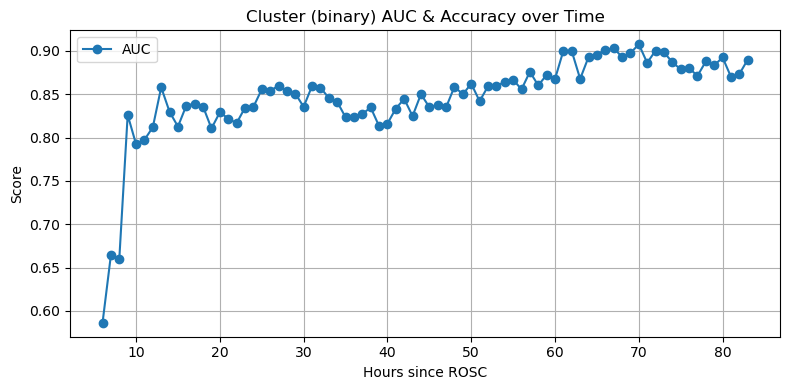

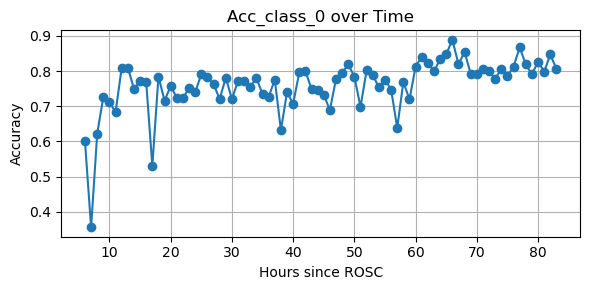

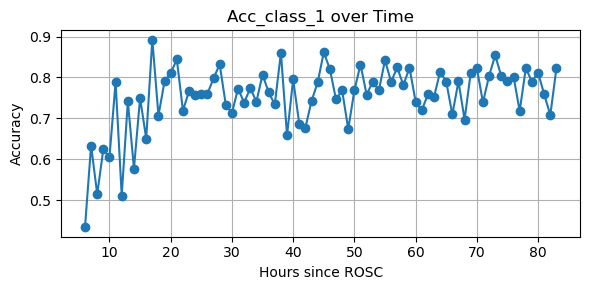

In [9]:
plot_task_metrics("cluster_bi_o.csv", task_name="Cluster (binary)")

Cluster (multiple) metrics loaded from: cluster_mul_o.csv


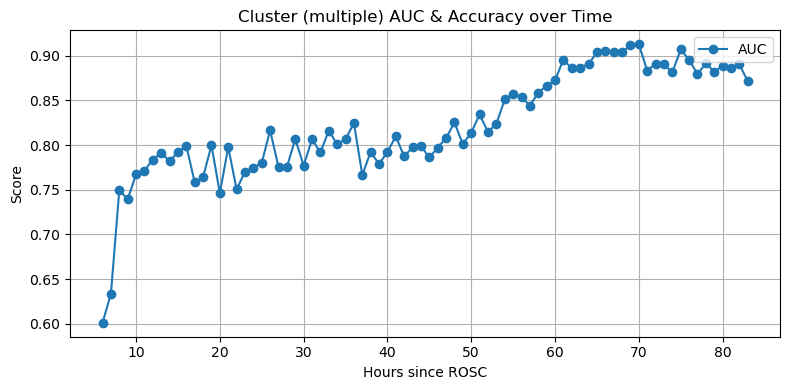

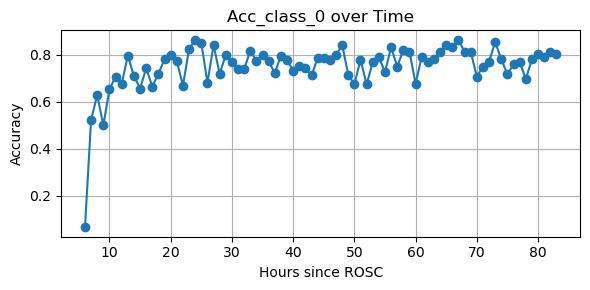

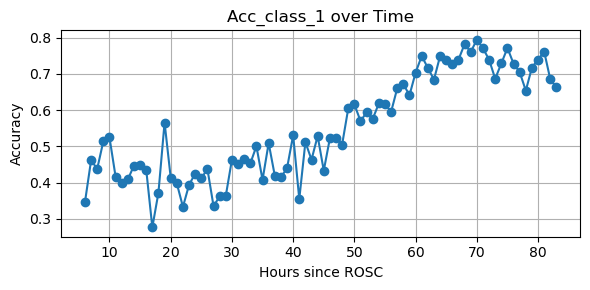

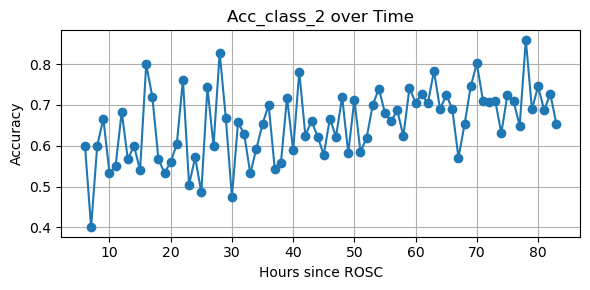

In [10]:
plot_task_metrics("cluster_mul_o.csv", task_name="Cluster (multiple)")

CPC (no clin) metrics loaded from: cpc_nocli_o.csv


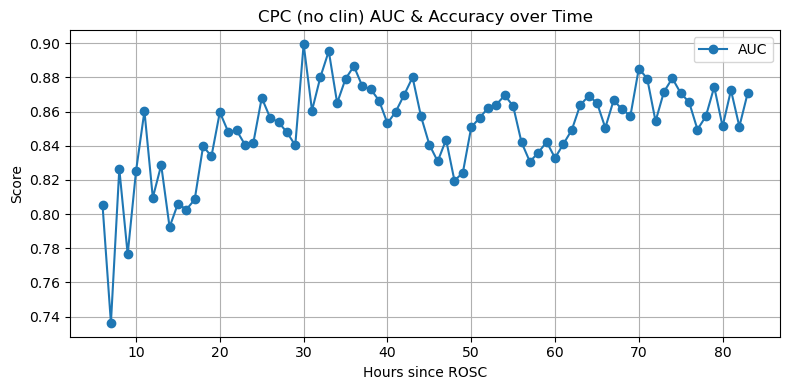

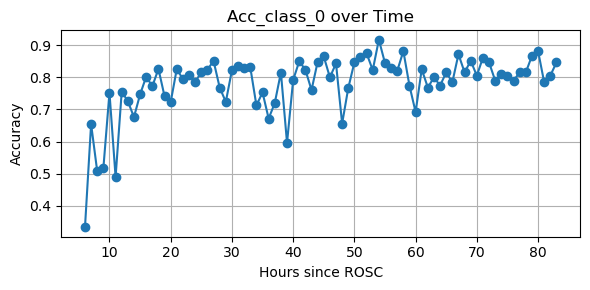

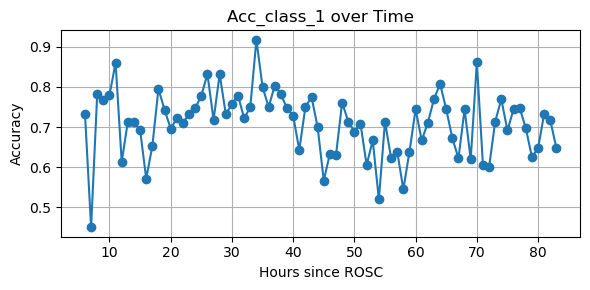

In [11]:
plot_task_metrics("cpc_nocli_o.csv", task_name="CPC (no clin)")

CPC (clin) metrics loaded from: cpc_cli_o.csv


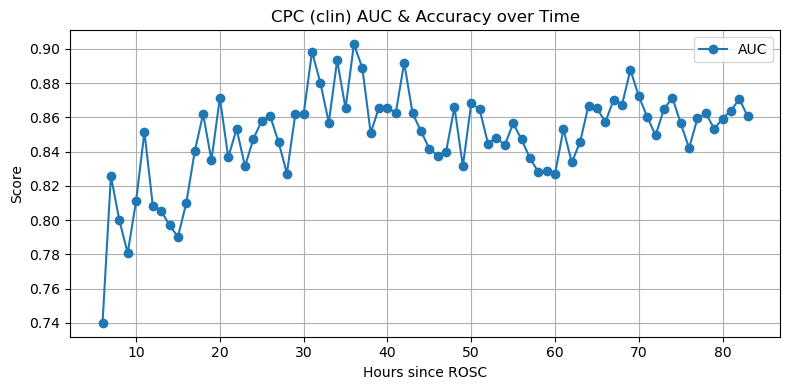

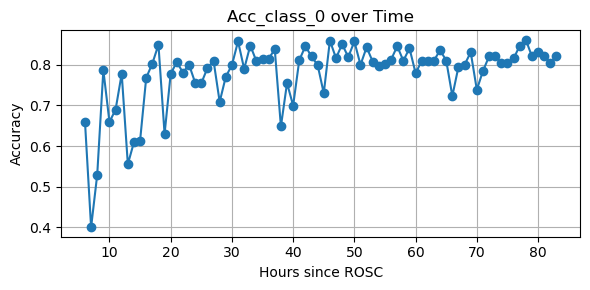

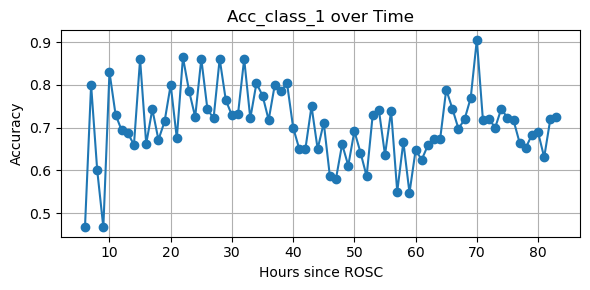

In [12]:
plot_task_metrics("cpc_cli_o.csv", task_name="CPC (clin)")

import pandas as pd

# 文件列表和对应任务名
file_task_pairs = [
    ("cluster_bi_o.csv",    "AUC_cluster_bi.csv"),
    ("cluster_mul_o.csv",   "AUC_cluster_mul.csv"),
    ("cpc_nocli_o.csv",     "AUC_cpc_nocli.csv"),
    ("cpc_cli_o.csv",       "AUC_cpc_cli.csv"),
]

# 批量提取、调整并保存 AUC 数据
for input_file, output_file in file_task_pairs:
    df = pd.read_csv(input_file)
    
    if 'hour' not in df.columns or 'AUC' not in df.columns:
        print(f"Skipping {input_file}: required columns not found.")
        continue
    
    df_auc = df[['hour', 'AUC']].copy()
    df_auc['AUC'] = df_auc['AUC']
    
    df_auc.to_csv(output_file, index=False)
    print(f"Saved adjusted AUC data to {output_file}")

import pandas as pd
import matplotlib.pyplot as plt

# 文件名和任务标签
file_task_pairs = [
    ("AUC_cluster_bi.csv",  "Cluster (binary)"),
    ("AUC_cluster_mul.csv", "Cluster (multiple)"),
    ("AUC_cpc_nocli.csv",   "CPC (no clinical)"),
    ("AUC_cpc_cli.csv",     "CPC (clinical)"),
]

# 合并数据
df_all = []
for file, task in file_task_pairs:
    df = pd.read_csv(file)
    df['Task'] = task
    df_all.append(df)

df_plot = pd.concat(df_all, ignore_index=True)

# 绘图
plt.figure(figsize=(10, 5))
for task_name, group in df_plot.groupby("Task"):
    plt.plot(group['hour'], group['AUC'], marker='o', label=task_name)

plt.xlabel("Hours since ROSC")
plt.ylabel("AUC")
plt.title("AUC vs Time for Different Tasks")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


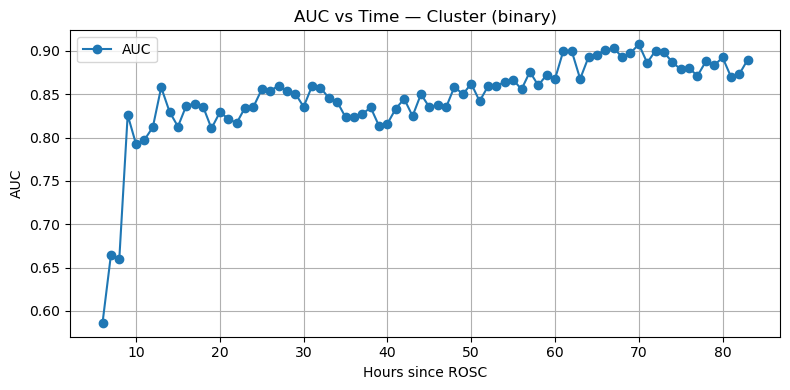

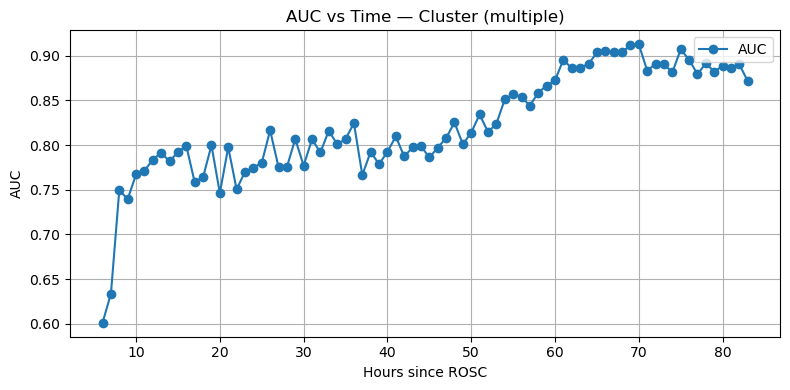

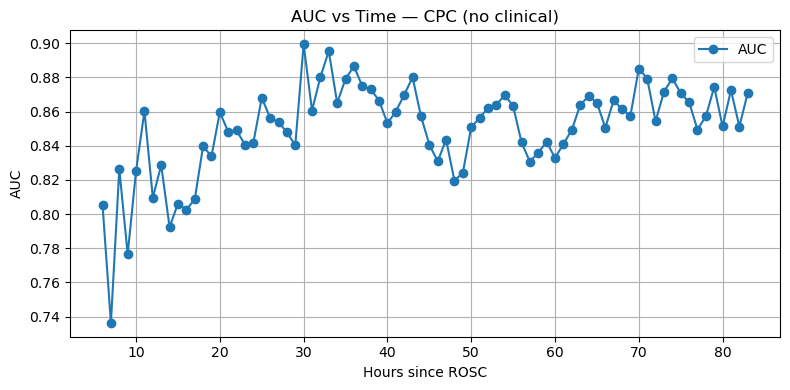

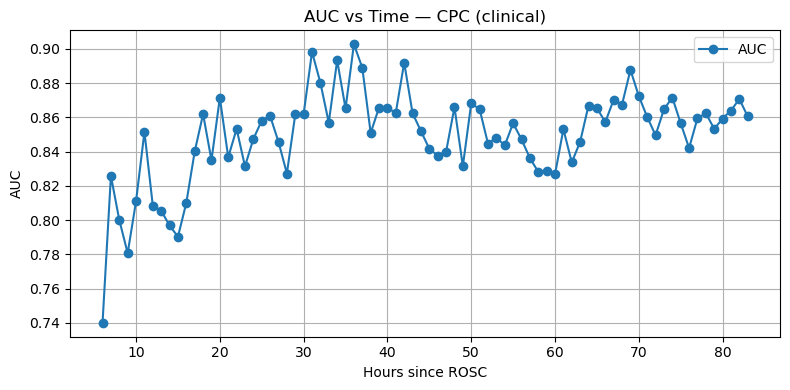

In [14]:
import pandas as pd
import matplotlib.pyplot as plt


file_task_pairs = [
    ("AUC_cluster_bi.csv",  "Cluster (binary)"),
    ("AUC_cluster_mul.csv", "Cluster (multiple)"),
    ("AUC_cpc_nocli.csv",   "CPC (no clinical)"),
    ("AUC_cpc_cli.csv",     "CPC (clinical)"),
]


for file, task in file_task_pairs:
    df = pd.read_csv(file)

    plt.figure(figsize=(8, 4))
    plt.plot(df['hour'], df['AUC'], marker='o', label='AUC')
    plt.xlabel("Hours since ROSC")
    plt.ylabel("AUC")
    plt.title(f"AUC vs Time — {task}")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [15]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import roc_auc_score, accuracy_score
from tqdm import tqdm

def run_full_training(
    path_csv,
    features,
    task='cpc',
    binary_labels=False,
    use_clinical=False,
    start=6,
    end=68,
    epochs=50,
    batch_size=64,
    out_metrics_csv='metrics_full.csv',
    out_preds_csv='preds_full.csv',
    model_factory=None,
):
    # 1) Load X, y, and column names using preprocess_seq
    X_np, y_np, feat_cols = preprocess_seq(
        path_csv,
        feature_list=features,
        use_clinical=use_clinical,
        label_type=('cpc' if task=='cpc' else 'cluster'),
        binary_labels=binary_labels,
        start=start, end=end
    )
    X_np = np.nan_to_num(X_np)
    N, T, F = X_np.shape

    # 2) Reconstruct patient IDs from the original CSV
    #    so they align with the order used in preprocess_seq
    df_ids = pd.read_csv(path_csv)
    # Remove any unnamed columns
    df_ids = df_ids.loc[:, ~df_ids.columns.str.contains(r'^Unnamed')]
    # Drop columns that are entirely empty
    df_ids = df_ids.dropna(axis=1, how='all')
    # Make sure 'hour' is numeric
    df_ids['hour'] = pd.to_numeric(df_ids['hour'], errors='coerce')
    label_col = 'cpc' if task=='cpc' else 'cluster'
    # Drop rows missing key columns
    df_ids = df_ids.dropna(subset=['pat_ID','hour', label_col])

    # Build list of unique patient IDs in the same time window
    pat_ids = []
    for pid, grp in df_ids.groupby('pat_ID'):
        sub = grp[(grp['hour']>=start)&(grp['hour']<end)]
        if sub.empty:
            continue
        pat_ids.append(pid)
    pat_ids = np.array(pat_ids)

    # 3) Set up device, label info
    device       = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    class_labels = sorted(np.unique(y_np))
    multiclass   = len(class_labels) > 2
    label_dtype  = torch.long if multiclass else torch.float32

    records_metrics = []
    records_preds   = []

    # 4) Train and predict for each time window length
    for L in tqdm(range(1, T+1), desc="Time windows"):
        hour = start + L - 1
        Xw, yw = X_np[:, :L, :], y_np
        mask   = ~(Xw.reshape(N, -1) == 0).all(axis=1)
        Xf, yf = Xw[mask], yw[mask]
        ids     = pat_ids[mask]

        if len(yf) < 5:
            records_metrics.append({'hour':hour,'AUC':np.nan,'Accuracy':np.nan})
            continue

        # Balance training set by duplication
        X_tr, y_tr = balance_by_duplication(Xf, yf, target_dist='equal')
        ds = TensorDataset(
            torch.tensor(X_tr, dtype=torch.float32),
            torch.tensor(y_tr, dtype=label_dtype)
        )
        loader = DataLoader(ds, batch_size=batch_size, shuffle=True)

        # Instantiate model
        if model_factory:
            model = model_factory(multiclass, F,
                                  num_classes=len(class_labels) if multiclass else None)
        else:
            model = (LSTMMulti(F, num_classes=len(class_labels))
                     if multiclass else LSTMBinary(F))
        model.to(device)

        # Choose loss
        criterion = nn.CrossEntropyLoss() if multiclass else nn.BCEWithLogitsLoss()
        optimizer = optim.Adam(model.parameters(), lr=1e-3)

        # Training loop
        model.train()
        for _ in range(epochs):
            for xb, yb in loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                logits = model(xb)
                logits = logits.view(-1) if not multiclass else logits
                loss = criterion(logits, yb)
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()

        # Prediction on the full set
        model.eval()
        with torch.no_grad():
            X_tensor = torch.tensor(Xf, dtype=torch.float32).to(device)
            logits   = model(X_tensor)
            probs = (torch.softmax(logits, dim=1).cpu().numpy()
                     if multiclass else
                     torch.sigmoid(logits.view(-1)).cpu().numpy())
            preds = (np.argmax(probs, axis=1) if multiclass
                     else (probs >= 0.5).astype(int))

        # Compute metrics
        try:
            auc = (roc_auc_score(yf, probs, multi_class='ovr', average='macro')
                   if multiclass else roc_auc_score(yf, probs))
        except ValueError:
            auc = np.nan
        acc = accuracy_score(yf, preds)

        records_metrics.append({'hour':hour,'AUC':auc,'Accuracy':acc})
        dfp = pd.DataFrame({
            'hour':       hour,
            'pat_ID':     ids,
            'true_label': yf,
            'pred_label': preds
        })
        records_preds.append(dfp)

    # 5) Aggregate results, save, and plot
    df_metrics = pd.DataFrame(records_metrics)
    df_preds   = pd.concat(records_preds, ignore_index=True)
    df_metrics.to_csv(out_metrics_csv, index=False)
    df_preds.to_csv(out_preds_csv,     index=False)
    print(f"Saved metrics → {out_metrics_csv}")
    print(f"Saved preds   → {out_preds_csv}")

    plt.figure(figsize=(8,5))
    plt.plot(df_metrics['hour'], df_metrics['AUC'], '-o', label='AUC')
    plt.plot(df_metrics['hour'], df_metrics['Accuracy'], '-s', label='Accuracy')
    plt.xlabel('Hours since ROSC')
    plt.ylabel('Score')
    plt.title(f"LSTM {task.upper()} Performance")
    plt.legend()
    plt.grid(True)
    plt.show()

    return df_metrics, df_preds


Time windows: 100%|████████████████████████████████████████████████████████████████████| 78/78 [00:42<00:00,  1.81it/s]

Saved metrics → full_metrics.csv
Saved preds   → full_preds_cpc.csv


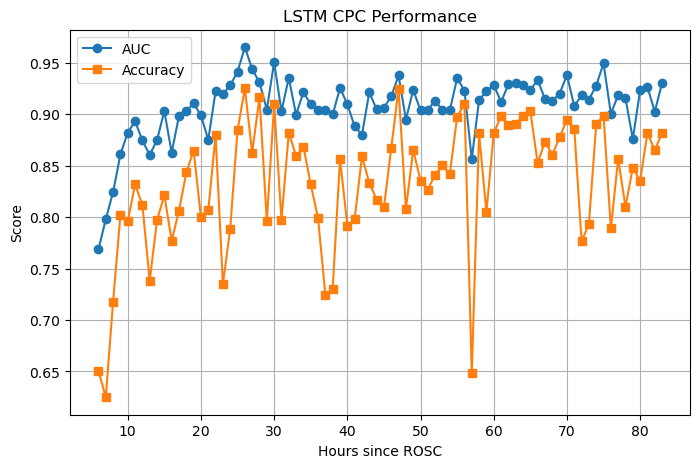

In [16]:
config = {'hidden_size': 64, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.5}
factory = make_model_factory(config)

metrics_df, preds_df = run_full_training(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_cpc[:87],
    task='cpc',
    binary_labels=False,
    use_clinical=False,
    start=6,
    end=84,
    epochs=30,
    batch_size=64,
    out_metrics_csv='full_metrics.csv',
    out_preds_csv='full_preds_cpc.csv',
    model_factory=factory
)


C:\Users\admin\AppData\Local\Temp\ipykernel_27216\4091449296.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


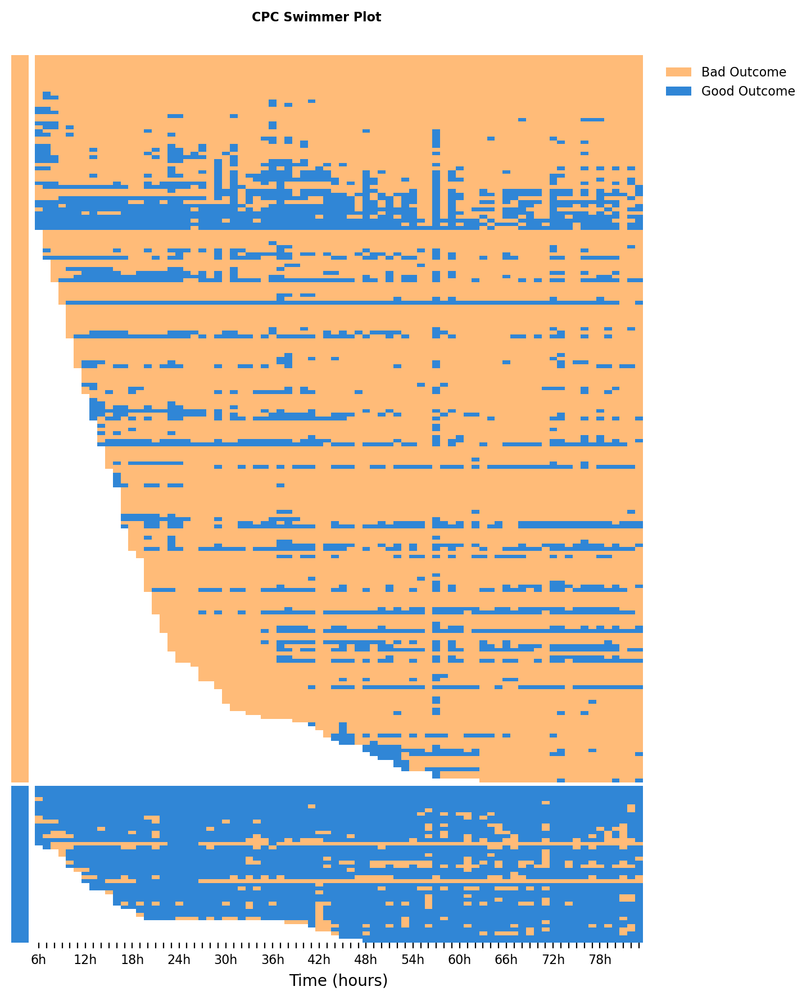

In [17]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec

# === 1. Read in full_preds.csv ===
df = pd.read_csv("full_preds_cpc.csv")

# === 2. Compute each patient's overall accuracy and sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum', 'count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID', 'acc']]
)
first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour': 'first_time'})
)
patients = (
    df[['pat_ID', 'true_label']]
      .drop_duplicates()
      .merge(acc_df, on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label', 'first_time', 'acc'],
          ascending=[True, True, False]
      )
      .reset_index(drop=True)
)

# === 3. Group by true_label and insert a gap at the end of each group ===
groups = patients.groupby('true_label')['pat_ID'].apply(list)
new_order = []
new_true = []
for lbl in sorted(groups.index):            # first 0, then 1
    ids = groups[lbl]
    new_order += ids
    new_true += [lbl] * len(ids)
    # insert a gap (use None, which becomes NaN later)
    new_order.append(None)
    new_true.append(np.nan)
# remove the last extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the predictions matrix and reindex with the gap ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)  # None maps to an all-NaN row
time_axis = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare colormap and normalization ===
cmap_lab = ListedColormap(['#ffbb78','#3086d6'])
# display NaNs as white rows
cmap_lab.set_bad(color='white')
norm = BoundaryNorm([-0.5, 0.5, 1.5], cmap_lab.N)

# === 6. Plot ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
# move the main title down a bit, e.g., y=0.96
fig.suptitle("CPC Swimmer Plot", fontsize=8, weight='bold', y=0.96)
# tighten top and bottom margins
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# Left: true label color strip (with gap)
strip = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip),
    aspect='auto',
    cmap=cmap_lab,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# Right: prediction heatmap (with gap)
im = ax_main.imshow(
    np.ma.masked_invalid(df_pivot_exp.values),
    aspect='auto',
    cmap=cmap_lab,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# align y-limits on both strips
ax_strip.set_ylim(ax_main.get_ylim())

# X-axis ticks
xt = np.arange(len(time_axis))
# label every 6 hours, leave others blank
xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (hours)", fontsize=10)

# hide Y-axis and all spines
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# Legend
pred_patch = [
    Rectangle((0, 0), 1, 1, facecolor='#ffbb78', label='Bad Outcome'),
    Rectangle((0, 0), 1, 1, facecolor='#3086d6' , label='Good Outcome')
]
ax_main.legend(
    handles=pred_patch,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
# save as high-resolution JPEG
fig.savefig("CPC_swimmer_plot.jpg", dpi=600, bbox_inches='tight')
# save as SVG vector graphic
fig.savefig("CPC_swimmer_plot.svg", format='svg', bbox_inches='tight')
plt.show()



Time windows: 100%|████████████████████████████████████████████████████████████████████| 78/78 [00:30<00:00,  2.56it/s]

Saved metrics → full_metrics.csv
Saved preds   → full_preds_Kb.csv


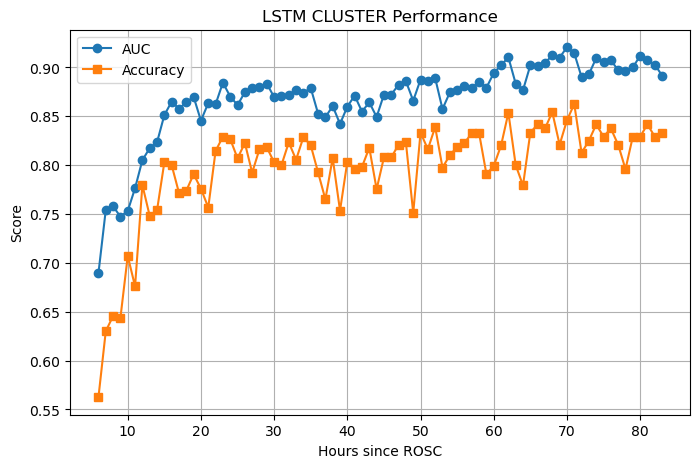

In [18]:
config = {'hidden_size': 32, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.2}
factory = make_model_factory(config)

metrics_df, preds_df = run_full_training(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_km[:47],
    task='cluster',
    binary_labels=True,
    use_clinical=False,
    start=6,
    end=84,
    epochs=30,
    batch_size=64,
    out_metrics_csv='full_metrics.csv',
    out_preds_csv='full_preds_Kb.csv',
    model_factory=factory
)

C:\Users\admin\AppData\Local\Temp\ipykernel_27216\1903107733.py:142: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


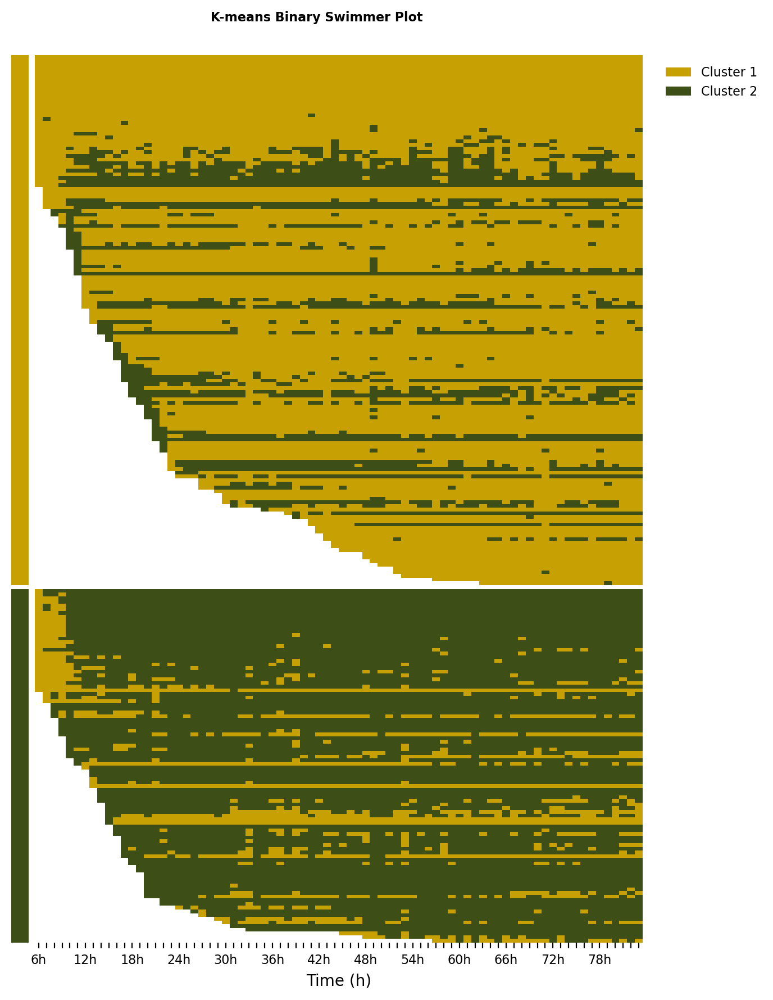

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec

# === 1. Read in full_preds_Kb.csv ===
df = pd.read_csv("full_preds_Kb.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True,       True,        False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)     # placeholder for gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex (including gap) ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis    = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare discrete colormap & normalization ===
all_lbls  = sorted(set(new_true) - {np.nan})
n_classes = len(all_lbls)

custom_colors = {
    0: '#C7A003',  
    1: '#3D4E17',  
}
#['#30688D', '#91D566'] Green
colors = [custom_colors[lbl] for lbl in all_lbls]

cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white') 

bounds = np.arange(-0.5, n_classes + 0.5, 1)
norm   = BoundaryNorm(bounds, cmap_disc.N)


# === 6. Create figure + GridSpec (narrow strip + main plot) ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
# move the title down a bit, e.g., y=0.96
fig.suptitle("K-means Binary Swimmer Plot", fontsize=8, weight='bold', y=0.96)
# tighten top margin
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. Left: true label color strip (with gap) ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Right: predicted label heatmap (with gap) ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# ensure top/bottom alignment
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. X-axis ticks ===
xt = np.arange(len(time_axis))
xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Remove Y-axis & spines ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Legend: generate a patch for each cluster ===
legend_patches = []
for i, lbl in enumerate(all_lbls):
    legend_patches.append(
        Rectangle((0, 0), 1, 1, facecolor=colors[i], edgecolor='none',
                  label=f"Cluster {int(lbl) + 1}")
    )
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
# save as high-resolution JPEG
fig.savefig("KmeansBinary_swimmer_plot.jpg", dpi=600, bbox_inches='tight')
# save as SVG vector graphic
fig.savefig("KmeansBinary_swimmer_plot.svg", format='svg', bbox_inches='tight')
plt.show()


C:\Users\admin\AppData\Local\Temp\ipykernel_27216\3337106202.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  puRd = cm.get_cmap("PuRd")
C:\Users\admin\AppData\Local\Temp\ipykernel_27216\3337106202.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


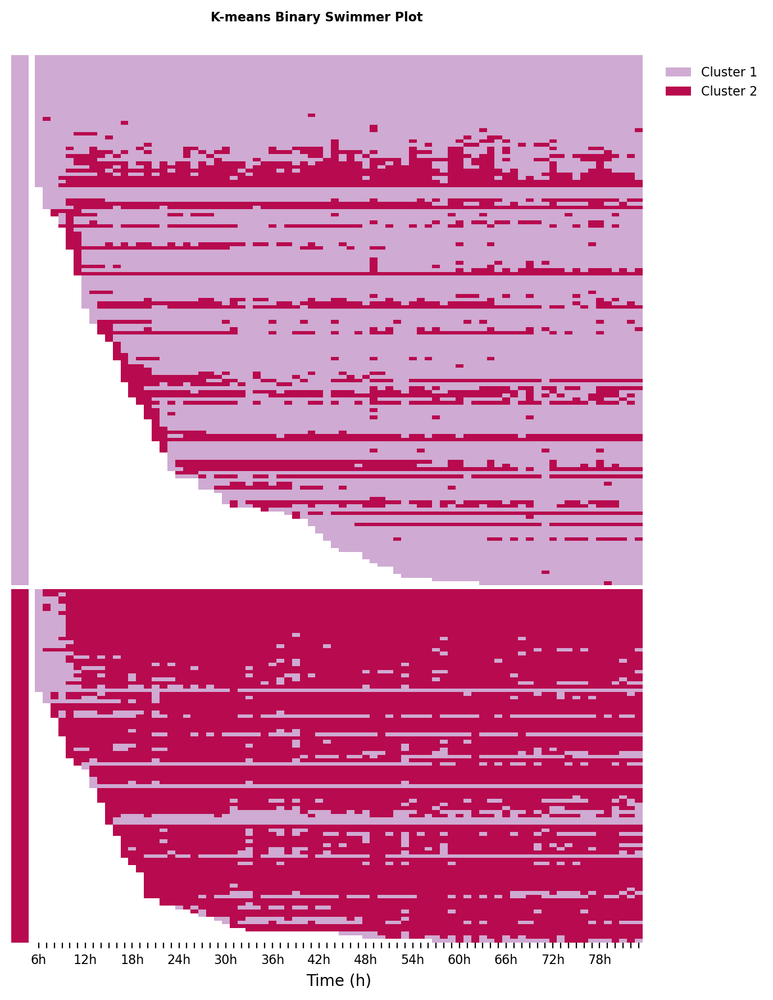

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from matplotlib import cm

# === 1. Read in full_preds_Kb.csv ===
df = pd.read_csv("full_preds_Kb.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True,       True,        False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)     # placeholder for gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex (including gap) ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis    = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare "light gradient" PuRd-based colormap ===
puRd = cm.get_cmap("PuRd")
colors = [puRd(0.3), puRd(0.8)]  # light and dark from PuRd
cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white')

bounds = np.arange(-0.5, 2, 1)
norm = BoundaryNorm(bounds, cmap_disc.N)

# === 6. Create figure + GridSpec (narrow strip + main plot) ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
fig.suptitle("K-means Binary Swimmer Plot", fontsize=8, weight='bold', y=0.96)
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. Left: true label color strip (with gap) ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Right: predicted label heatmap (with gap) ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. X-axis ticks ===
xt = np.arange(len(time_axis))
xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Remove Y-axis & spines ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Legend: still use patches ===
legend_patches = [
    Rectangle((0, 0), 1, 1, facecolor=colors[0], edgecolor='none', label="Cluster 1"),
    Rectangle((0, 0), 1, 1, facecolor=colors[1], edgecolor='none', label="Cluster 2"),
]
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
fig.savefig("KmeansBinary_swimmer_plot_PuRdTwotone.jpg", dpi=600, bbox_inches='tight')
fig.savefig("KmeansBinary_swimmer_plot_PuRdTwotone.svg", format='svg', bbox_inches='tight')
plt.show()


Time windows: 100%|████████████████████████████████████████████████████████████████████| 78/78 [00:32<00:00,  2.40it/s]

Saved metrics → full_metrics.csv
Saved preds   → full_preds_Km.csv


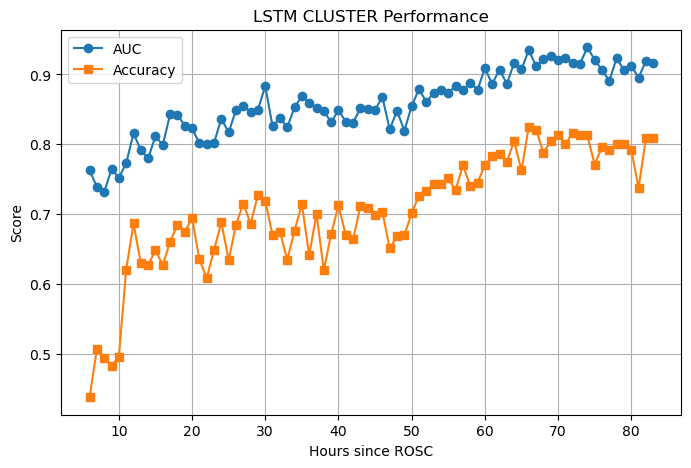

In [21]:
config = {'hidden_size': 32, 'num_layers': 1, 'bidirectional': True, 'dropout': 0.2}
factory = make_model_factory(config)

metrics_df, preds_df = run_full_training(
    path_csv="merged_all_features_clinical.csv",
    features=sorted_feats_km[:47],
    task='cluster',
    binary_labels=False,
    use_clinical=False,
    start=6,
    end=84,
    epochs=30,
    batch_size=64,
    out_metrics_csv='full_metrics.csv',
    out_preds_csv='full_preds_Km.csv',
    model_factory=factory
)

C:\Users\admin\AppData\Local\Temp\ipykernel_27216\2498462915.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


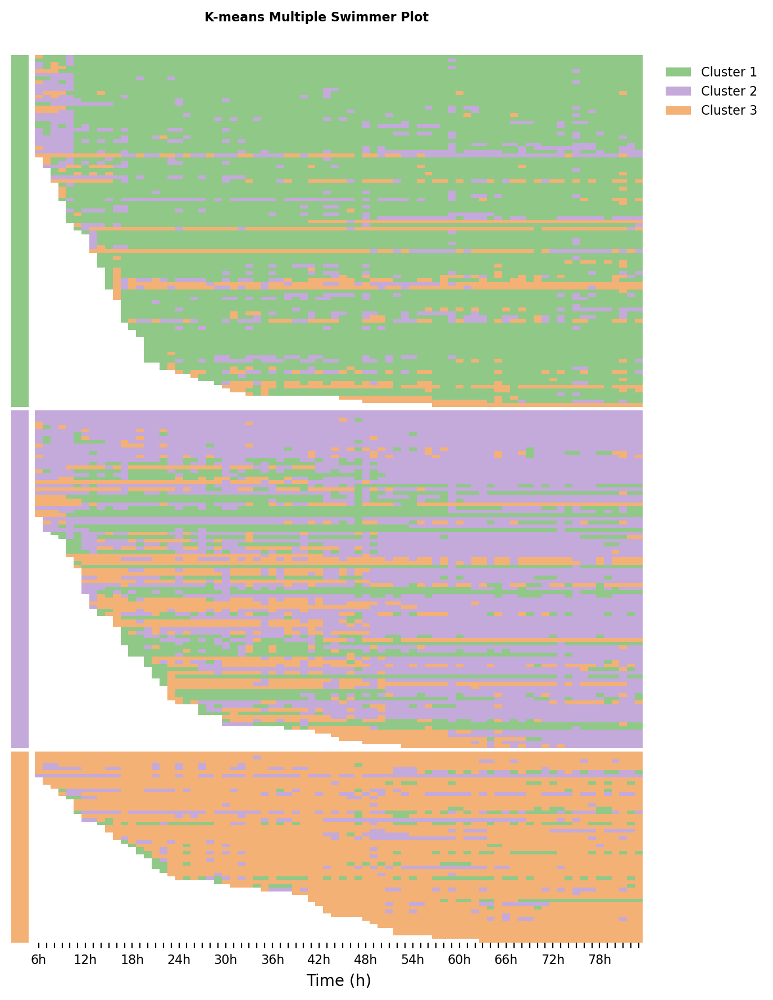

In [22]:
# === 1. Read in full_preds_Km.csv ===
df = pd.read_csv("full_preds_Km.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True, True, False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)       # placeholder for visual gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex with gaps ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Prepare discrete colormap & normalization ===
all_lbls  = sorted(set(new_true) - {np.nan})
n_classes = len(all_lbls)

# Manually specify colors you like
# Example: purple, blue, gold; add more if n_classes > 3
colors =  ['#DD8EA4', '#FEDD89', '#31383F']
colors =  ['#90c887', '#c4a9db', '#f3b175']
cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white')  # gaps shown as white

# Define mapping boundaries from integer class to colors
bounds = np.arange(-0.5, n_classes + 0.5, 1)
norm   = BoundaryNorm(bounds, cmap_disc.N)

# === 6. Create figure and GridSpec (narrow strip + main plot) ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
fig.suptitle("K-means Multiple Swimmer Plot", fontsize=8, weight='bold', y=0.96)
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. Left panel: true label color strip (with gaps) ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Right panel: predicted label heatmap (with gaps) ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)

# Ensure vertical alignment between left and right
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. Set X-axis ticks ===
xt = np.arange(len(time_axis))
xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Hide Y-axis and remove plot borders ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Add legend patches for each cluster ===
legend_patches = []
for i, lbl in enumerate(all_lbls):
    legend_patches.append(
        Rectangle((0, 0), 1, 1, facecolor=colors[i], edgecolor='none',
                  label=f"Cluster {int(lbl) + 1}")
    )
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)

# Save as high-resolution JPEG
fig.savefig("KmeansMultiple_swimmer_plot.jpg", dpi=600, bbox_inches='tight')

# Save as SVG vector graphic
fig.savefig("KmeansMultiple_swimmer_plot.svg", format='svg', bbox_inches='tight')

plt.show()

C:\Users\admin\AppData\Local\Temp\ipykernel_27216\2334170068.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_base = cm.get_cmap("PuRd")
C:\Users\admin\AppData\Local\Temp\ipykernel_27216\2334170068.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5)


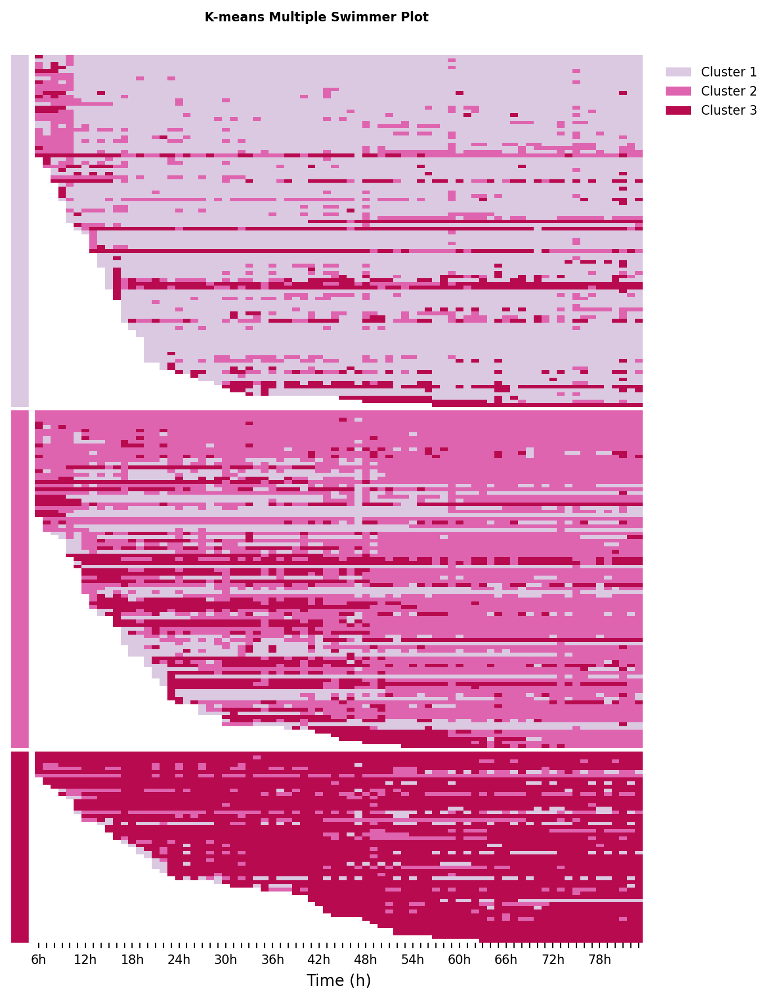

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Rectangle
from matplotlib.gridspec import GridSpec
from matplotlib import cm

# === 1. Read in full_preds_Km.csv ===
df = pd.read_csv("full_preds_Km.csv")

# === 2. Compute each patient’s overall accuracy & sort ===
acc_df = (
    df
    .assign(correct=lambda d: d['pred_label'] == d['true_label'])
    .groupby('pat_ID')['correct']
    .agg(['sum','count'])
    .assign(acc=lambda x: x['sum'] / x['count'])
    .reset_index()[['pat_ID','acc']]
)

first_df = (
    df
    .dropna(subset=['pred_label'])
    .groupby('pat_ID')['hour']
    .min()
    .reset_index()
    .rename(columns={'hour':'first_time'})
)

patients = (
    df[['pat_ID','true_label']]
      .drop_duplicates()
      .merge(acc_df,   on='pat_ID')
      .merge(first_df, on='pat_ID')
      .sort_values(
          ['true_label','first_time','acc'],
          ascending=[True, True, False]
      )
)

# === 3. Insert a gap at the end of each true_label group ===
groups     = patients.groupby('true_label')['pat_ID'].apply(list)
new_order  = []
new_true   = []
for lbl in sorted(groups.index):
    ids = groups[lbl]
    new_order += ids
    new_true  += [lbl] * len(ids)
    new_order.append(None)       # placeholder for visual gap
    new_true.append(np.nan)
# Remove the final extra gap
new_order = new_order[:-1]
new_true  = new_true[:-1]

# === 4. Pivot the prediction matrix & reindex with gaps ===
df_pivot = df.pivot(index='pat_ID', columns='hour', values='pred_label')
df_pivot_exp = df_pivot.reindex(new_order)
time_axis = sorted(df['hour'].unique())
df_pivot_exp = df_pivot_exp.reindex(columns=time_axis)

# === 5. Use PuRd-based light gradient colors for 3 classes ===
all_lbls  = sorted(set(new_true) - {np.nan})
n_classes = len(all_lbls)

cmap_base = cm.get_cmap("PuRd")
colors = [cmap_base(x) for x in [0.2, 0.5, 0.8]]  # three levels

cmap_disc = ListedColormap(colors)
cmap_disc.set_bad(color='white')

bounds = np.arange(-0.5, n_classes + 0.5, 1)
norm   = BoundaryNorm(bounds, cmap_disc.N)

# === 6. Create figure and GridSpec ===
fig = plt.figure(figsize=(7.25, 9.75), dpi=200)
fig.suptitle("K-means Multiple Swimmer Plot", fontsize=8, weight='bold', y=0.96)
plt.subplots_adjust(top=0.92)

gs  = GridSpec(1, 2, width_ratios=[0.2, 7], wspace=0.02, figure=fig)
ax_strip = fig.add_subplot(gs[0])
ax_main  = fig.add_subplot(gs[1], sharey=ax_strip)

# === 7. True label strip ===
strip_arr = np.array(new_true)[:, None]
ax_strip.imshow(
    np.ma.masked_invalid(strip_arr),
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_strip.axis('off')

# === 8. Predicted label heatmap ===
data_masked = np.ma.masked_invalid(df_pivot_exp.values)
im = ax_main.imshow(
    data_masked,
    aspect='auto',
    cmap=cmap_disc,
    norm=norm,
    interpolation='nearest'
)
ax_main.grid(False)
ax_strip.set_ylim(ax_main.get_ylim())

# === 9. X-axis ===
xt = np.arange(len(time_axis))
xl = [f"{h}h" if h % 6 == 0 else "" for h in time_axis]
ax_main.set_xticks(xt)
ax_main.set_xticklabels(xl, fontsize=8)
ax_main.set_xlabel("Time (h)", fontsize=10)

# === 10. Clean Y-axis ===
ax_main.set_yticks([])
for sp in list(ax_main.spines.values()) + list(ax_strip.spines.values()):
    sp.set_visible(False)

# === 11. Legend ===
legend_patches = [
    Rectangle((0, 0), 1, 1, facecolor=colors[i], edgecolor='none', label=f"Cluster {int(lbl)+1}")
    for i, lbl in enumerate(all_lbls)
]
ax_main.legend(
    handles=legend_patches,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left',
    fontsize=8,
    frameon=False
)

plt.tight_layout(pad=0.5)
fig.savefig("KmeansMultiple_swimmer_plot_PuRdGradient.jpg", dpi=600, bbox_inches='tight')
fig.savefig("KmeansMultiple_swimmer_plot_PuRdGradient.svg", format='svg', bbox_inches='tight')
plt.show()


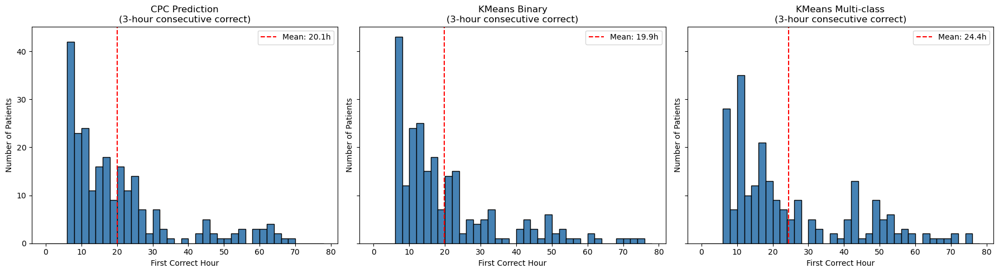

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def compute_first_consecutive_stats(df, window):
    """
    For each patient, find the earliest hour t such that
    predictions are correct at hours t, t+1, …, t+window-1.
    Returns:
      - first_df: DataFrame with columns [pat_ID, first_correct_hour, true_label]
      - never:     array of pat_IDs that never achieved window consecutive corrects
    """
    df = df.copy()
    df['correct'] = df['pred_label'] == df['true_label']
    df.sort_values(['pat_ID', 'hour'], inplace=True)

    records, never = [], []
    for pid, group in df.groupby('pat_ID'):
        hrs  = group['hour'].values
        corr = group['correct'].values
        found = False

        for i in range(len(hrs) - window + 1):
            # check for consecutive hours and all-correct in that window
            if (hrs[i+window-1] - hrs[i] == window-1) and corr[i:i+window].all():
                records.append({
                    'pat_ID': pid,
                    'first_correct_hour': hrs[i],
                    'true_label': group['true_label'].iloc[0]
                })
                found = True
                break

        if not found:
            never.append(pid)

    return pd.DataFrame(records), np.array(never)


# ——— Set number of consecutive hours ———
window_size = 3   # change to 4, 6, 12, etc.

# ——— Load prediction results ———
df_cpc = pd.read_csv("full_preds_cpc.csv")
df_kb  = pd.read_csv("full_preds_Kb.csv")
df_km  = pd.read_csv("full_preds_Km.csv")

# ——— Compute first time window of consecutive correct predictions ———
stats_cpc, never_cpc = compute_first_consecutive_stats(df_cpc, window_size)
stats_kb,  never_kb  = compute_first_consecutive_stats(df_kb,  window_size)
stats_km,  never_km  = compute_first_consecutive_stats(df_km,  window_size)

# ——— Visualize distributions of first correct hours ———
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
titles = [
    f'CPC Prediction\n({window_size}-hour consecutive correct)',
    f'KMeans Binary\n({window_size}-hour consecutive correct)',
    f'KMeans Multi-class\n({window_size}-hour consecutive correct)'
]

for ax, stats, title, never in zip(
    axs,
    [stats_cpc, stats_kb, stats_km],
    titles,
    [never_cpc, never_kb, never_km]
):
    ax.hist(
        stats['first_correct_hour'],
        bins=range(0, 80, 2),
        color='steelblue',
        edgecolor='black'
    )
    total = len(stats) + len(never)
    #ax.set_title(f"{title}\n(n={len(stats)} / {total} patients)")
    ax.set_title(f"{title}")
    ax.set_xlabel("First Correct Hour")
    ax.set_ylabel("Number of Patients")
    mean_hr = stats['first_correct_hour'].mean()
    ax.axvline(mean_hr, color='red', linestyle='--',
               label=f"Mean: {mean_hr:.1f}h")
    ax.legend()

plt.tight_layout()
plt.show()


In [25]:
# After you have stats_cpc and never_cpc…
def count_by_cutoff(stats_df, never, cutoffs):
    total = len(stats_df) + len(never)
    for T in cutoffs:
        reached = (stats_df['first_correct_hour'] <= T).sum()
        pct = reached / total * 100
        print(f"By {T}h: {reached}/{total} patients ({pct:.1f}%) reached the {window_size}-hour consecutive-correct criterion")

# specify cutoffs
cutoffs = [24, 48, 72]

print("CPC predictions:")
count_by_cutoff(stats_cpc, never_cpc, cutoffs)

print("\nKMeans Binary:")
count_by_cutoff(stats_kb, never_kb, cutoffs)

print("\nKMeans Multi-class:")
count_by_cutoff(stats_km, never_km, cutoffs)


CPC predictions:
By 24h: 176/237 patients (74.3%) reached the 3-hour consecutive-correct criterion
By 48h: 215/237 patients (90.7%) reached the 3-hour consecutive-correct criterion
By 72h: 235/237 patients (99.2%) reached the 3-hour consecutive-correct criterion

KMeans Binary:
By 24h: 175/240 patients (72.9%) reached the 3-hour consecutive-correct criterion
By 48h: 214/240 patients (89.2%) reached the 3-hour consecutive-correct criterion
By 72h: 228/240 patients (95.0%) reached the 3-hour consecutive-correct criterion

KMeans Multi-class:
By 24h: 146/240 patients (60.8%) reached the 3-hour consecutive-correct criterion
By 48h: 193/240 patients (80.4%) reached the 3-hour consecutive-correct criterion
By 72h: 222/240 patients (92.5%) reached the 3-hour consecutive-correct criterion



=== CPC Prediction ===

>> 0 outcome:
  By 24h: 141/195 patients (72.3%) reached 3-h consecutive correct
  By 48h: 173/195 patients (88.7%) reached 3-h consecutive correct
  By 72h: 193/195 patients (99.0%) reached 3-h consecutive correct


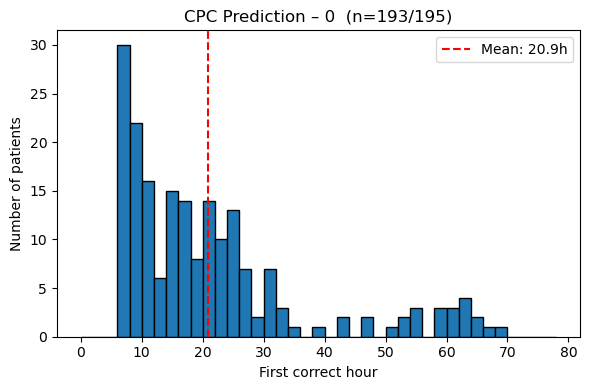


>> 1 outcome:
  By 24h: 35/42 patients (83.3%) reached 3-h consecutive correct
  By 48h: 42/42 patients (100.0%) reached 3-h consecutive correct
  By 72h: 42/42 patients (100.0%) reached 3-h consecutive correct


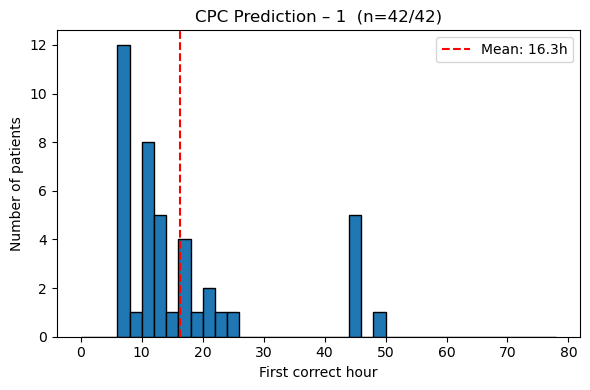


=== KMeans Binary ===

>> 0 outcome:
  By 24h: 96/144 patients (66.7%) reached 3-h consecutive correct
  By 48h: 127/144 patients (88.2%) reached 3-h consecutive correct
  By 72h: 137/144 patients (95.1%) reached 3-h consecutive correct


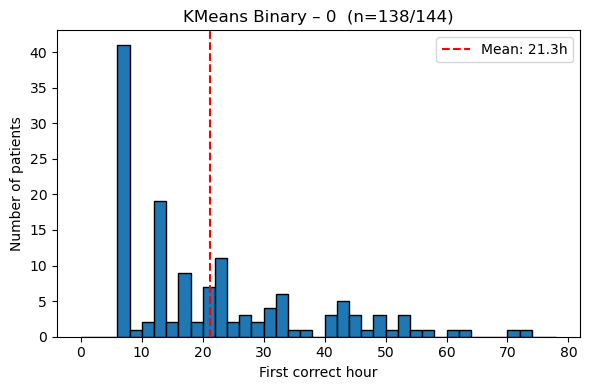


>> 1 outcome:
  By 24h: 79/96 patients (82.3%) reached 3-h consecutive correct
  By 48h: 87/96 patients (90.6%) reached 3-h consecutive correct
  By 72h: 91/96 patients (94.8%) reached 3-h consecutive correct


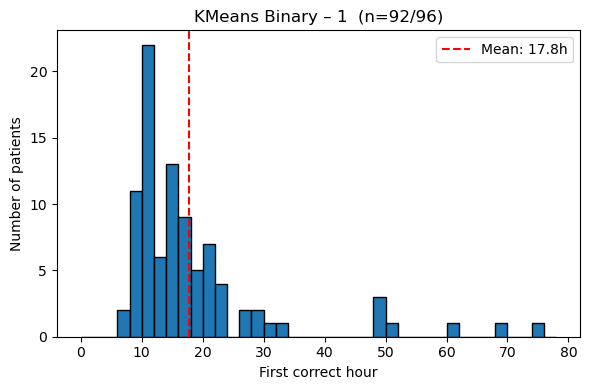


=== KMeans Multi-class ===

>> 0 outcome:
  By 24h: 79/96 patients (82.3%) reached 3-h consecutive correct
  By 48h: 84/96 patients (87.5%) reached 3-h consecutive correct
  By 72h: 89/96 patients (92.7%) reached 3-h consecutive correct


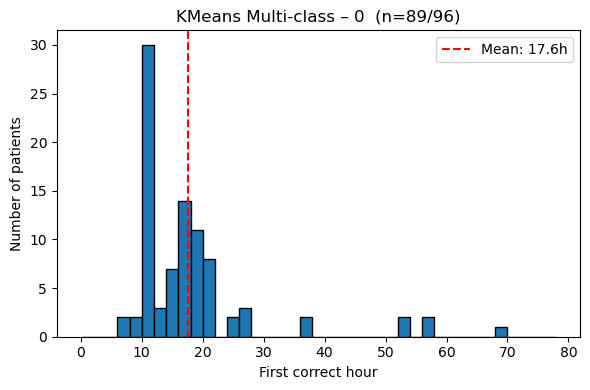


>> 1 outcome:
  By 24h: 37/92 patients (40.2%) reached 3-h consecutive correct
  By 48h: 64/92 patients (69.6%) reached 3-h consecutive correct
  By 72h: 82/92 patients (89.1%) reached 3-h consecutive correct


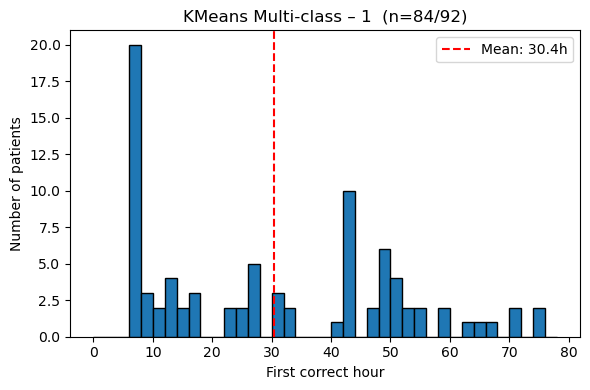


>> 2 outcome:
  By 24h: 30/52 patients (57.7%) reached 3-h consecutive correct
  By 48h: 45/52 patients (86.5%) reached 3-h consecutive correct
  By 72h: 51/52 patients (98.1%) reached 3-h consecutive correct


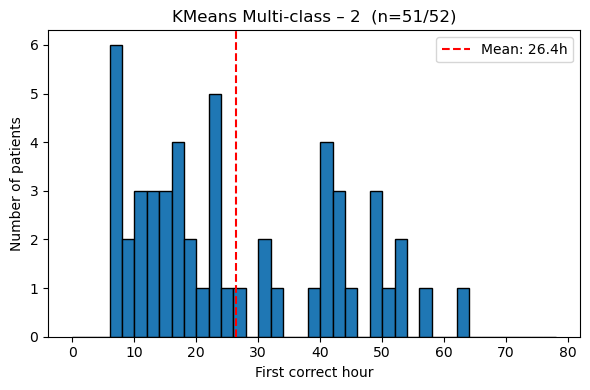

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def compute_first_consecutive_stats(df, window):
    """
    对每个患者，找出最早的 t 使得在 t, t+1, …, t+window-1 这 window 小时里
    模型预测都正确。
    返回：
      - stats_df: 包含列 [pat_ID, first_correct_hour, true_label]
      - never:    列表，存放那些从未达到 window 连续正确的 pat_ID
    """
    df = df.copy()
    df['correct'] = df['pred_label'] == df['true_label']
    df.sort_values(['pat_ID','hour'], inplace=True)

    records = []
    never = []
    for pid, g in df.groupby('pat_ID'):
        hrs  = g['hour'].values
        corr = g['correct'].values
        found = False
        for i in range(len(hrs) - window + 1):
            # 判断是否连续且都正确
            if (hrs[i+window-1] - hrs[i] == window-1) and corr[i:i+window].all():
                records.append({
                    'pat_ID': pid,
                    'first_correct_hour': hrs[i],
                    'true_label': g['true_label'].iloc[0]
                })
                found = True
                break
        if not found:
            never.append(pid)

    return pd.DataFrame(records), never

def count_by_cutoff(stats_df, never, cutoffs, window):
    total = len(stats_df) + len(never)
    for T in cutoffs:
        reached = (stats_df['first_correct_hour'] <= T).sum()
        pct = reached / total * 100
        print(f"  By {T}h: {reached}/{total} patients ({pct:.1f}%) reached {window}-h consecutive correct")

# 参数
window_size = 3
cutoffs     = [24, 48, 72]

# 载入预测结果
df_cpc = pd.read_csv("full_preds_cpc.csv")   # 需含 pat_ID, hour, true_label, pred_label
df_kb  = pd.read_csv("full_preds_Kb.csv")
df_km  = pd.read_csv("full_preds_Km.csv")

def process_model_split(df, model_name):
    print(f"\n=== {model_name} ===")
    # 1) 全部患者计算一次
    stats_all, never_all = compute_first_consecutive_stats(df, window_size)

    # 2) 针对每个 outcome（true_label）单独统计
    for outcome in sorted(df['true_label'].unique()):
        # 该 outcome 的所有患者 ID
        all_pids = df.loc[df['true_label']==outcome, 'pat_ID'].unique()
        # 该 outcome 在 stats_all 中被找到连续正确的子集
        stats_sub = stats_all[stats_all['true_label']==outcome]
        # 该 outcome 中从未达标的患者
        never_sub = [pid for pid in all_pids if pid not in stats_sub['pat_ID'].values]

        print(f"\n>> {outcome} outcome:")
        count_by_cutoff(stats_sub, never_sub, cutoffs, window_size)

        # 可视化分布
        plt.figure(figsize=(6,4))
        plt.hist(stats_sub['first_correct_hour'], bins=range(0,80,2), edgecolor='black')
        total = len(stats_sub) + len(never_sub)
        mean_hr = stats_sub['first_correct_hour'].mean() if len(stats_sub) else np.nan
        plt.title(f"{model_name} – {outcome}  (n={len(stats_sub)}/{total})")
        plt.axvline(mean_hr, color='red', linestyle='--',
                    label=f"Mean: {mean_hr:.1f}h")
        plt.xlabel("First correct hour")
        plt.ylabel("Number of patients")
        plt.legend()
        plt.tight_layout()
        plt.show()

# 分别运行
process_model_split(df_cpc, "CPC Prediction")
process_model_split(df_kb,  "KMeans Binary")
process_model_split(df_km,  "KMeans Multi-class")


## Single Time Stamp

C:\Users\admin\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:1102: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan]
  warnings.warn(


Best CPC RF params: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best K-means RF params: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
    hour  n_samples   cpc_auc   cpc_acc    km_auc    km_acc
0      6         52  0.639881  0.729091  0.619929  0.552727
1      7         59  0.518981  0.710606  0.638014  0.490909
2      8         68  0.475985  0.691209  0.648493  0.483516
3      9         73  0.693939  0.754286  0.718452  0.619048
4     10         80  0.718750  0.712500  0.665023  0.537500
..   ...        ...       ...       ...       ...       ...
73    79        109  0.729118  0.844156  0.791874  0.634199
74    80        107  0.671321  0.841126  0.826598  0.683117
75    81        106  0.733796  0.859307  0.767973  0.614719
76    82        105  0.861547  0.866667  0.788689  0.590476
77    83        105  0.779902  0.828571  0.756683  0.561905

[78 rows x 6 columns]


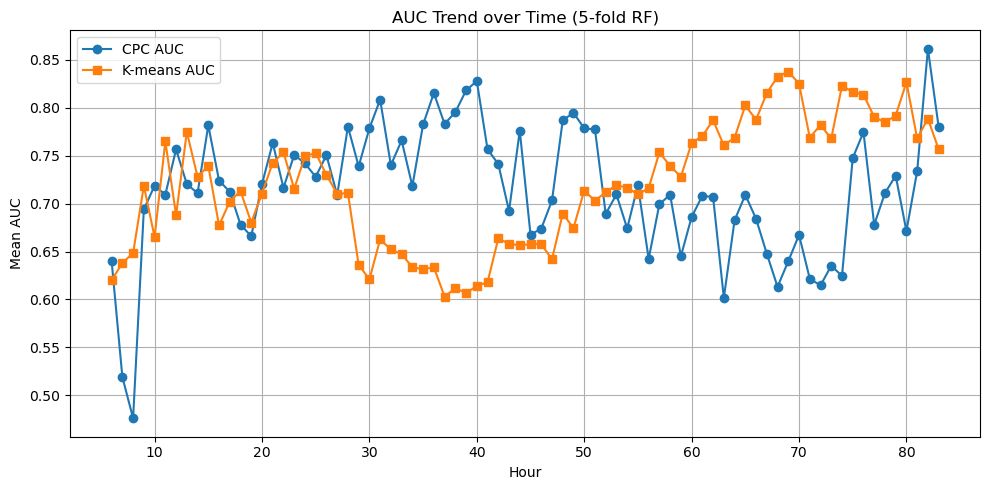

In [27]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, accuracy_score
import matplotlib.pyplot as plt

# ——— Load & clean ———
DATASET = "merged_all_features_clinical.csv"
df_raw = pd.read_csv(DATASET)
df_raw.dropna(axis=0, inplace=True)

# ——— Define feature columns ———
drop_feats = ['pat_ID', 'cluster', 'cpc', 'hour', 'age', 'sex', 'vfib']
feature_columns = [c for c in df_raw.columns if c not in drop_feats]
meta_columns = ['pat_ID', 'hour', 'cpc', 'cluster']
df_samples = df_raw[meta_columns + feature_columns].copy()

# ——— Global hyperparameter search ———
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Best parameters for CPC (binary classification)
rf_base = RandomForestClassifier(random_state=42)
grid_cpc = GridSearchCV(
    rf_base, param_grid, cv=5,
    scoring='roc_auc', n_jobs=-1
)
grid_cpc.fit(df_samples[feature_columns], df_samples['cpc'])
best_params_cpc = grid_cpc.best_params_
print("Best CPC RF params:", best_params_cpc)

# Best parameters for K-means labels (multi-class)
grid_km = GridSearchCV(
    rf_base, param_grid, cv=5,
    scoring='roc_auc_ovr', n_jobs=-1
)
grid_km.fit(df_samples[feature_columns], df_samples['cluster'])
best_params_km = grid_km.best_params_
print("Best K-means RF params:", best_params_km)

# === Model builders ===
def make_model_cpc():
    return RandomForestClassifier(**best_params_cpc, random_state=42)

def make_model_km():
    return RandomForestClassifier(**best_params_km, random_state=42)

# === Utility functions ===
def can_split(y, n_splits):
    counts = pd.Series(y).value_counts()
    return len(counts) >= 2 and (counts.min() >= n_splits)

def safe_roc_auc_score(y_true, y_score, **kwargs):
    try:
        return roc_auc_score(y_true, y_score, **kwargs)
    except ValueError:
        return np.nan

# === Load cleaned data ===
DATASET = "merged_all_features_clinical.csv"
df_samples = pd.read_csv(DATASET).dropna()

# Define feature set
drop_feats = ['pat_ID', 'cluster', 'cpc', 'hour', 'age', 'sex', 'vfib']
feature_columns = [c for c in df_samples.columns if c not in drop_feats]

# === Evaluate at each hour ===
hours = sorted(df_samples['hour'].unique())
results = []

for h in hours:
    df_h = df_samples[df_samples['hour'] == h]
    X = df_h[feature_columns].values

    # Binary transformation of CPC
    def map_cpc_binary(x):
        return 1 if x in [1, 2] else 0

    y_cpc = df_h['cpc'].apply(map_cpc_binary).values
    y_km = df_h['cluster'].values

    if len(df_h) < 20 or not can_split(y_cpc, 5) or not can_split(y_km, 5):
        print(f"Skipping hour {h}: too few samples or class imbalance.")
        continue

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    aucs_cpc, accs_cpc = [], []
    aucs_km, accs_km = [], []

    for tr, te in cv.split(X, y_cpc):
        X_tr, X_te = X[tr], X[te]
        ytr_c, yte_c = y_cpc[tr], y_cpc[te]
        ytr_k, yte_k = y_km[tr], y_km[te]

        # --- CPC ---
        m_c = make_model_cpc()
        m_c.fit(X_tr, ytr_c)
        prob_c = m_c.predict_proba(X_te)[:, 1]
        aucs_cpc.append(safe_roc_auc_score(yte_c, prob_c))
        accs_cpc.append(accuracy_score(yte_c, m_c.predict(X_te)))

        # --- K-means ---
        m_k = make_model_km()
        m_k.fit(X_tr, ytr_k)
        prob_k = m_k.predict_proba(X_te)
        if prob_k.shape[1] == 2:
            aucs_km.append(safe_roc_auc_score(yte_k, prob_k[:, 1]))
        else:
            aucs_km.append(safe_roc_auc_score(
                yte_k, prob_k, multi_class='ovr', average='macro'
            ))
        accs_km.append(accuracy_score(yte_k, m_k.predict(X_te)))

    results.append({
        'hour': h,
        'n_samples': len(df_h),
        'cpc_auc': np.nanmean(aucs_cpc),
        'cpc_acc': np.nanmean(accs_cpc),
        'km_auc': np.nanmean(aucs_km),
        'km_acc': np.nanmean(accs_km),
    })

# === Output results ===
df_results = pd.DataFrame(results)
print(df_results)

# Optionally save
df_results.to_csv("hourly_rf_optimized_results.csv", index=False)

# === Plotting ===
plt.figure(figsize=(10, 5))
plt.plot(df_results['hour'], df_results['cpc_auc'], label='CPC AUC', marker='o')
plt.plot(df_results['hour'], df_results['km_auc'], label='K-means AUC', marker='s')
plt.xlabel('Hour')
plt.ylabel('Mean AUC')
plt.title('AUC Trend over Time (5-fold RF)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:08:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best XGBoost CPC params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}


C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:12:07] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best XGBoost KM params: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}


C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:12:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:12:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:12:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\admin\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:12:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtr

    hour  n_samples   cpc_auc   cpc_acc    km_auc    km_acc
0      6         52  0.538095  0.590909  0.599206  0.458182
1      7         59  0.446528  0.660606  0.607859  0.492424
2      8         68  0.396364  0.647253  0.686380  0.515385
3      9         73  0.655051  0.711429  0.678009  0.507619
4     10         80  0.703205  0.700000  0.555402  0.450000
..   ...        ...       ...       ...       ...       ...
73    79        109  0.612719  0.806926  0.783033  0.587879
74    80        107  0.703216  0.822078  0.806028  0.682684
75    81        106  0.722222  0.858442  0.774767  0.594805
76    82        105  0.791394  0.828571  0.789346  0.600000
77    83        105  0.806536  0.800000  0.765173  0.580952

[78 rows x 6 columns]


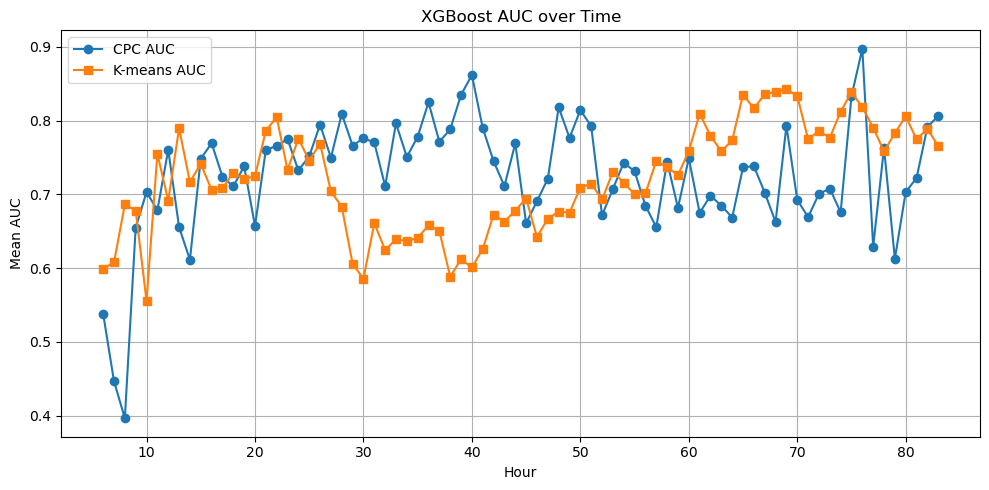

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import roc_auc_score, accuracy_score

# ========== Load and clean data ==========
DATASET = "merged_all_features_clinical.csv"
df_raw = pd.read_csv(DATASET)
df_raw.dropna(axis=0, inplace=True)

# ========== Define feature columns ==========
drop_feats = ['pat_ID', 'cluster', 'cpc', 'hour', 'age', 'sex', 'vfib']
feature_columns = [c for c in df_raw.columns if c not in drop_feats]
meta_columns = ['pat_ID', 'hour', 'cpc', 'cluster']
df_samples = df_raw[meta_columns + feature_columns].copy()

# ========== Hyperparameter search (XGBoost) ==========
param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1.0]
}

xgb_base = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# CPC (binary classification)
grid_cpc = GridSearchCV(
    xgb_base, param_grid, cv=5,
    scoring='roc_auc', n_jobs=-1
)
grid_cpc.fit(df_samples[feature_columns], df_samples['cpc'].apply(lambda x: 1 if x in [1, 2] else 0))
best_params_cpc = grid_cpc.best_params_
print("Best XGBoost CPC params:", best_params_cpc)

# K-means (multi-class classification)
grid_km = GridSearchCV(
    xgb_base, param_grid, cv=5,
    scoring='roc_auc_ovr', n_jobs=-1
)
grid_km.fit(df_samples[feature_columns], df_samples['cluster'])
best_params_km = grid_km.best_params_
print("Best XGBoost KM params:", best_params_km)

# ========== Model factory functions ==========
def make_model_cpc():
    return XGBClassifier(**best_params_cpc, use_label_encoder=False, eval_metric='logloss', random_state=42)

def make_model_km():
    return XGBClassifier(**best_params_km, use_label_encoder=False, eval_metric='logloss', random_state=42)

# ========== Utility functions ==========
def can_split(y, n_splits):
    counts = pd.Series(y).value_counts()
    return len(counts) >= 2 and (counts.min() >= n_splits)

def safe_roc_auc_score(y_true, y_score, **kwargs):
    try:
        return roc_auc_score(y_true, y_score, **kwargs)
    except ValueError:
        return np.nan

# ========== Per-hour evaluation ==========
df_samples = pd.read_csv(DATASET).dropna()
feature_columns = [c for c in df_samples.columns if c not in drop_feats]
hours = sorted(df_samples['hour'].unique())
results = []

for h in hours:
    df_h = df_samples[df_samples['hour'] == h]
    X = df_h[feature_columns].values
    y_cpc = df_h['cpc'].apply(lambda x: 1 if x in [1, 2] else 0).values
    y_km = df_h['cluster'].values

    if len(df_h) < 20 or not can_split(y_cpc, 5) or not can_split(y_km, 5):
        print(f"Skipping hour {h}: too few samples or class imbalance.")
        continue

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    aucs_cpc, accs_cpc = [], []
    aucs_km, accs_km = [], []

    for tr, te in cv.split(X, y_cpc):
        X_tr, X_te = X[tr], X[te]
        ytr_c, yte_c = y_cpc[tr], y_cpc[te]
        ytr_k, yte_k = y_km[tr], y_km[te]

        # CPC model
        m_c = make_model_cpc()
        m_c.fit(X_tr, ytr_c)
        prob_c = m_c.predict_proba(X_te)[:, 1]
        aucs_cpc.append(safe_roc_auc_score(yte_c, prob_c))
        accs_cpc.append(accuracy_score(yte_c, m_c.predict(X_te)))

        # K-means model
        m_k = make_model_km()
        m_k.fit(X_tr, ytr_k)
        prob_k = m_k.predict_proba(X_te)
        if prob_k.shape[1] == 2:
            aucs_km.append(safe_roc_auc_score(yte_k, prob_k[:, 1]))
        else:
            aucs_km.append(safe_roc_auc_score(yte_k, prob_k, multi_class='ovr', average='macro'))
        accs_km.append(accuracy_score(yte_k, m_k.predict(X_te)))

    results.append({
        'hour': h,
        'n_samples': len(df_h),
        'cpc_auc': np.nanmean(aucs_cpc),
        'cpc_acc': np.nanmean(accs_cpc),
        'km_auc': np.nanmean(aucs_km),
        'km_acc': np.nanmean(accs_km),
    })

df_results = pd.DataFrame(results)
print(df_results)
df_results.to_csv("hourly_xgboost_results.csv", index=False)  # Optional: save results

# ========== Plotting ==========
plt.figure(figsize=(10, 5))
plt.plot(df_results['hour'], df_results['cpc_auc'], label='CPC AUC', marker='o')
plt.plot(df_results['hour'], df_results['km_auc'], label='K-means AUC', marker='s')
plt.xlabel('Hour')
plt.ylabel('Mean AUC')
plt.title('XGBoost AUC over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


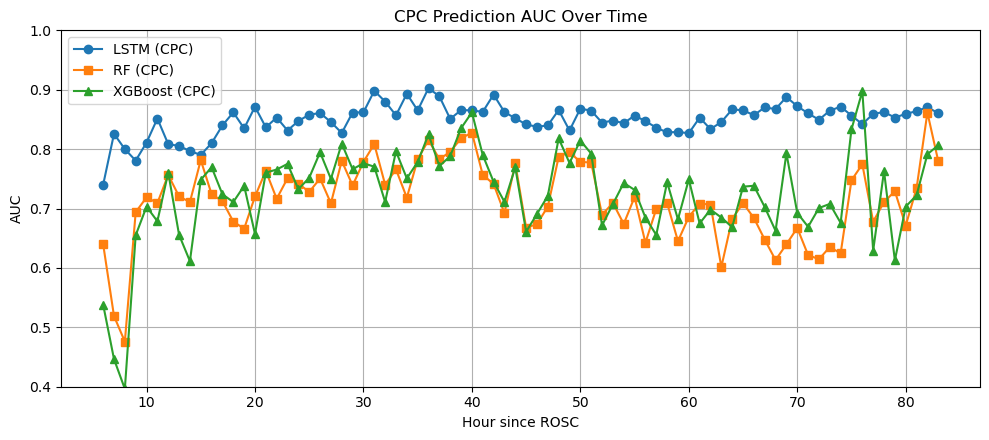

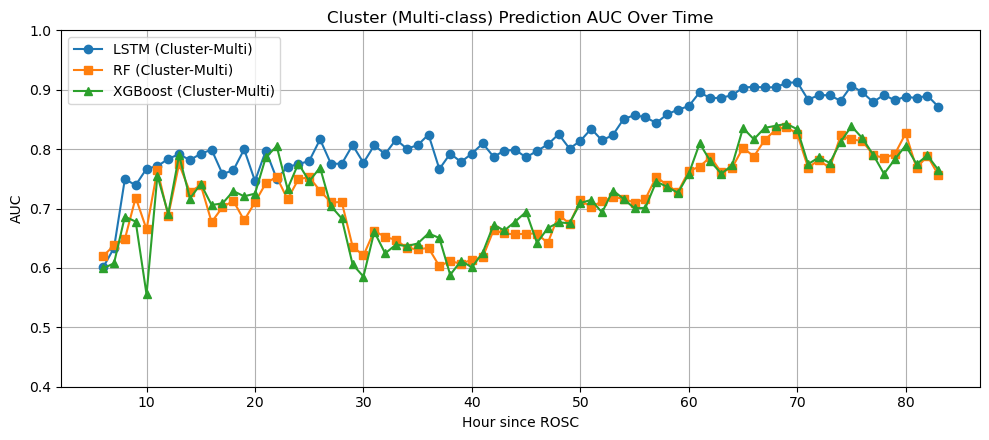

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load LSTM AUC Data ===
lstm_cpc  = pd.read_csv("AUC_cpc_cli.csv")           # LSTM - CPC (clinical)
lstm_km   = pd.read_csv("AUC_cluster_mul.csv")       # LSTM - Cluster (multi)

# === Load RF / XGBoost AUC Results ===
rf  = pd.read_csv("hourly_rf_optimized_results.csv")
xgb = pd.read_csv("hourly_xgboost_results.csv")

# === Plot 1: CPC AUC ===
plt.figure(figsize=(10, 4.5))
plt.plot(lstm_cpc['hour'], lstm_cpc['AUC'], label='LSTM (CPC)', marker='o')
plt.plot(rf['hour'],  rf['cpc_auc'], label='RF (CPC)', marker='s')
plt.plot(xgb['hour'], xgb['cpc_auc'], label='XGBoost (CPC)', marker='^')
plt.xlabel("Hour since ROSC")
plt.ylabel("AUC")
plt.title("CPC Prediction AUC Over Time")
plt.ylim(0.4, 1.0)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# === Plot 2: Cluster (Multi) AUC ===
plt.figure(figsize=(10, 4.5))
plt.plot(lstm_km['hour'], lstm_km['AUC'], label='LSTM (Cluster-Multi)', marker='o')
plt.plot(rf['hour'],  rf['km_auc'], label='RF (Cluster-Multi)', marker='s')
plt.plot(xgb['hour'], xgb['km_auc'], label='XGBoost (Cluster-Multi)', marker='^')
plt.xlabel("Hour since ROSC")
plt.ylabel("AUC")
plt.title("Cluster (Multi-class) Prediction AUC Over Time")
plt.ylim(0.4, 1.0)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from imblearn.over_sampling import SMOTE

# ——— Hyperparameters ———
BATCH_SIZE    = 64
LR            = 1e-3
DEVICE        = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
EPOCHS_SEARCH = 5
EPOCHS_FINAL  = 50
SEQ_LEN       = 1

# ——— 1) Load dataset ———
DATASET = "merged_all_features_clinical.csv"
df_raw = pd.read_csv(DATASET).dropna(axis=0)

# ——— 2) Feature selection ———
drop_feats = ['pat_ID','cluster','cpc','hour','age','sex','vfib']
all_features = [c for c in df_raw.columns if c not in drop_feats]
meta_columns = ['pat_ID','hour','cpc','cluster']

rf_cpc = RandomForestClassifier(
    n_estimators=500, max_depth=10,
    min_samples_split=5, min_samples_leaf=1,
    random_state=42
)
rf_cpc.fit(df_raw[all_features], df_raw['cpc'])
importances = rf_cpc.feature_importances_
top50_features = [all_features[i] for i in np.argsort(importances)[::-1][:50]]

# ——— 3) Build final DataFrame ———
df = df_raw[meta_columns + top50_features].copy()
df['cpc_label'] = df['cpc'].apply(lambda x: 1 if x in [1,2] else 0).astype(int)

# Optionally convert K-means cluster labels to binary labels
binary_labels = True  # Set to True to enable this
if binary_labels:
    # 1) Patient-level table with cpc and cluster
    pat_df = (
        df[['pat_ID', 'cpc', 'cluster']]
        .drop_duplicates(subset='pat_ID')
        .copy()
    )
    pat_df['cpc'] = pd.to_numeric(pat_df['cpc'], errors='coerce')

    # 2) Flag good outcome
    pat_df['is_good'] = pat_df['cpc'].isin([1, 2])

    # 3) Compute good outcome ratio in each cluster
    cluster_ratios = pat_df.groupby('cluster')['is_good'].mean()

    # 4) Find two clusters with lowest good outcome ratio
    poor_clusters = cluster_ratios.nsmallest(2).index.tolist()

    # 5) Generate binary cluster label
    pat_df['binary_cluster'] = pat_df['cluster'].apply(lambda cl: 0 if cl in poor_clusters else 1)

    # 6) Merge back and assign as km_label
    df = df.merge(pat_df[['pat_ID', 'binary_cluster']], on='pat_ID', how='left')
    df['km_label'] = df['binary_cluster'].astype(int)
else:
    df['km_label'] = df['cluster'].astype(int)

# ——— 4) Normalize features ———
scaler = StandardScaler()
X_all = scaler.fit_transform(df[top50_features])
X_all = X_all.reshape(-1, SEQ_LEN, X_all.shape[1])
y_cpc_all = df['cpc_label'].values
y_km_all  = df['km_label'].values

# ——— 5) Define LSTM model ———
class LSTMClassifier(nn.Module):
    def __init__(self, input_dim, hidden_size, num_layers, bidirectional, dropout, out_dim):
        super().__init__()
        self.lstm = nn.LSTM(
            input_dim, hidden_size,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        directions = 2 if bidirectional else 1
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size * directions, out_dim)

    def forward(self, x):
        out, _ = self.lstm(x)
        h = out[:, -1, :]
        h = self.dropout(h)
        return self.fc(h)

In [43]:
# ——— 6) Hyperparameter search (CPC) ———
param_grid = {
    'hidden_size': [64, 128, 256],
    'num_layers': [1, 2],
    'dropout': [0.2, 0.5],
    'bidirectional': [False, True]
}
best_auc = 0.0
best_params = {}
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

for hs in param_grid['hidden_size']:
    for nl in param_grid['num_layers']:
        for dr in param_grid['dropout']:
            for bd in param_grid['bidirectional']:
                aucs = []
                for tr_idx, te_idx in skf.split(X_all, y_cpc_all):
                    model = LSTMClassifier(
                        input_dim=X_all.shape[2],
                        hidden_size=hs,
                        num_layers=nl,
                        bidirectional=bd,
                        dropout=dr,
                        out_dim=1
                    ).to(DEVICE)
                    opt = optim.Adam(model.parameters(), lr=LR)
                    crit = nn.BCEWithLogitsLoss()
                    model.train()
                    for _ in range(EPOCHS_SEARCH):
                        for xb, yb in DataLoader(
                            TensorDataset(
                                torch.tensor(X_all[tr_idx], dtype=torch.float32),
                                torch.tensor(y_cpc_all[tr_idx], dtype=torch.float32)
                            ),
                            batch_size=BATCH_SIZE, shuffle=True
                        ):
                            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                            loss = crit(model(xb).squeeze(1), yb)
                            opt.zero_grad(); loss.backward(); opt.step()

                    model.eval()
                    with torch.no_grad():
                        probs = torch.sigmoid(
                            model(torch.tensor(X_all[te_idx], dtype=torch.float32).to(DEVICE)).squeeze(1)
                        ).cpu().numpy()
                    aucs.append(roc_auc_score(y_cpc_all[te_idx], probs))

                mean_auc = np.mean(aucs)
                if mean_auc > best_auc:
                    best_auc = mean_auc
                    best_params = dict(
                        hidden_size=hs,
                        num_layers=nl,
                        dropout=dr,
                        bidirectional=bd
                    )
print("Best LSTM params:", best_params, "AUC =", best_auc)

Best LSTM params: {'hidden_size': 256, 'num_layers': 2, 'dropout': 0.2, 'bidirectional': True} AUC = 0.9146191548998425


C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\admin\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid f

    hour  n_samples   cpc_auc   cpc_acc    km_auc    km_acc
0      6         52  0.786905  0.672727  0.647619  0.656364
1      7         59  0.707176  0.621212  0.724769  0.727273
2      8         68  0.723333  0.649451  0.705707  0.705495
3      9         73  0.763636  0.796190  0.780844  0.715238
4     10         80  0.818590  0.762500  0.768279  0.612500
..   ...        ...       ...       ...       ...       ...
58    64        149  0.828000  0.718851  0.798627  0.690805
59    65        147  0.811267  0.754253  0.830656  0.728736
60    66        145  0.803333  0.655172  0.836869  0.765517
61    67        143  0.804384  0.761084  0.842147  0.721182
62    68        141  0.831051  0.666010  0.872512  0.723153

[63 rows x 6 columns]
Saved predictions_per_fold.csv with 9974 records.


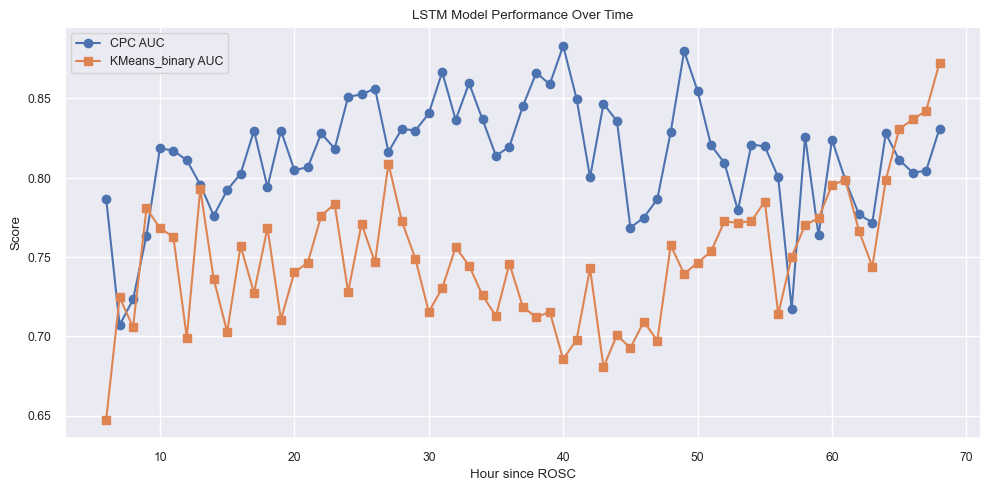

In [44]:
# ——— 每小时评估 ———
results, pred_records = [], []
for h in sorted(df['hour'].unique()):
    df_h = df[df['hour'] == h].reset_index(drop=True)
    if len(df_h) < 30 or df_h['cpc_label'].nunique() < 2:
        continue

    X_h = scaler.transform(df_h[top50_features].values).reshape(-1, SEQ_LEN, len(top50_features))
    y_c, y_k = df_h['cpc_label'].values, df_h['km_label'].values
    skf5 = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    aucs_c, accs_c, aucs_k, accs_k = [], [], [], []

    for tr, te in skf5.split(X_h, y_c):
        # Setup test data
        X_te = torch.tensor(X_h[te], dtype=torch.float32).to(DEVICE)
        y_te_c = torch.tensor(y_c[te], dtype=torch.float32)
        y_te_k = torch.tensor(y_k[te], dtype=torch.long)

        # SMOTE for CPC
        X_c_flat = X_h[tr][:, 0, :]
        y_c_tr = y_c[tr]
        X_c_bal, y_c_bal = SMOTE(random_state=42).fit_resample(X_c_flat, y_c_tr)
        X_c_bal = X_c_bal.reshape(-1, 1, X_c_bal.shape[1])

        # Train CPC model
        m_c = LSTMClassifier(input_dim=X_h.shape[2], out_dim=1, **best_params).to(DEVICE)
        opt_c = optim.Adam(m_c.parameters(), lr=LR)
        crit_c = nn.BCEWithLogitsLoss()
        best_auc_c, best_probs_c, best_preds_c = 0.0, None, None

        for _ in range(EPOCHS_FINAL):
            m_c.train()
            for xb, yb in DataLoader(
                TensorDataset(torch.tensor(X_c_bal, dtype=torch.float32),
                              torch.tensor(y_c_bal, dtype=torch.float32)),
                batch_size=BATCH_SIZE, shuffle=True
            ):
                xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                loss = crit_c(m_c(xb).squeeze(1), yb)
                opt_c.zero_grad(); loss.backward(); opt_c.step()

            m_c.eval()
            with torch.no_grad():
                probs_tmp = torch.sigmoid(m_c(X_te).squeeze(1)).cpu().numpy()
                auc_tmp = roc_auc_score(y_te_c.numpy(), probs_tmp)
                if auc_tmp > best_auc_c:
                    best_auc_c = auc_tmp
                    best_probs_c = probs_tmp.copy()
                    best_preds_c = (best_probs_c > 0.5).astype(int)

        probs_c, preds_c = best_probs_c, best_preds_c

        # Train KMeans model
        y_k_tr = y_k[tr]
        class_counts = np.bincount(y_k_tr)
        class_weights = 1.0 / class_counts
        class_weights *= len(class_counts) / class_weights.sum()
        weight_tensor = torch.tensor(class_weights, dtype=torch.float32).to(DEVICE)

        is_binary_km = len(np.unique(y_k)) == 2
        out_dim_k = 1 if is_binary_km else len(np.unique(y_k))
        m_k = LSTMClassifier(input_dim=X_h.shape[2], out_dim=out_dim_k, **best_params).to(DEVICE)
        opt_k = optim.Adam(m_k.parameters(), lr=LR)
        crit_k = (
            nn.BCEWithLogitsLoss()
            if is_binary_km
            else nn.CrossEntropyLoss(weight=weight_tensor)
        )
        best_auc_k, best_probs_k, best_preds_k = 0.0, None, None

        for _ in range(EPOCHS_FINAL):
            m_k.train()
            for xb, yb in DataLoader(
                TensorDataset(torch.tensor(X_h[tr], dtype=torch.float32),
                              torch.tensor(y_k_tr, dtype=torch.long)),
                batch_size=BATCH_SIZE, shuffle=True
            ):
                xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                logits = m_k(xb)
                if is_binary_km:
                    loss = crit_k(logits.squeeze(1), yb.float())
                else:
                    loss = crit_k(logits, yb)
                opt_k.zero_grad(); loss.backward(); opt_k.step()

            m_k.eval()
            with torch.no_grad():
                logits_tmp = m_k(X_te)
                if is_binary_km:
                    probs_tmp = torch.sigmoid(logits_tmp.squeeze(1)).cpu().numpy()
                    preds_tmp = (probs_tmp > 0.5).astype(int)
                    auc_tmp = roc_auc_score(y_te_k.numpy(), probs_tmp)
                else:
                    probs_tmp = torch.softmax(logits_tmp, dim=1).cpu().numpy()
                    preds_tmp = probs_tmp.argmax(axis=1)
                    try:
                        auc_tmp = roc_auc_score(
                           y_te_k.numpy(),
                           probs_tmp,
                           multi_class='ovr',
                           average='macro'
                       )
                    except ValueError:
                        auc_tmp = -1.0
                if auc_tmp > best_auc_k:
                    best_auc_k = auc_tmp
                    best_probs_k = probs_tmp.copy()
                    best_preds_k = preds_tmp.copy()

        if best_preds_k is None:
            preds_k = preds_tmp
            probs_k = probs_tmp
        else:
           probs_k, preds_k = best_probs_k, best_preds_k
        
            

        for i, gidx in enumerate(te):
            pred_records.append({
                'pat_ID': df_h.loc[gidx, 'pat_ID'],
                'hour': df_h.loc[gidx, 'hour'],
                'true_cpc': y_c[gidx],
                'pred_cpc': int(preds_c[i]),
                'true_km': y_k[gidx],
                'pred_km': int(preds_k[i])
            })

        aucs_c.append(roc_auc_score(y_c[te], probs_c))
        accs_c.append(accuracy_score(y_c[te], preds_c))
        if is_binary_km:
            auc_k = roc_auc_score(y_k[te], probs_k)
        else:
            try:
                auc_k = roc_auc_score(
                    y_k[te],
                    probs_k,
                    multi_class='ovr',
                    average='macro'
                )
            except ValueError:
                auc_k = np.nan
            
        aucs_k.append(auc_k)
        accs_k.append(accuracy_score(y_k[te], preds_k))

    results.append({
        'hour': h,
        'n_samples': len(df_h),
        'cpc_auc': np.mean(aucs_c),
        'cpc_acc': np.mean(accs_c),
        'km_auc': np.mean(aucs_k),
        'km_acc': np.mean(accs_k)
    })

df_res = pd.DataFrame(results)
df_res.to_csv("hourly_lstm_results.csv", index=False)
df_preds = pd.DataFrame(pred_records)
df_preds.to_csv("predictions_per_fold.csv", index=False)
print(df_res)
print("Saved predictions_per_fold.csv with", len(df_preds), "records.")

import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("hourly_lstm_results.csv")


plt.figure(figsize=(10, 5))


plt.plot(df['hour'], df['cpc_auc'], label='CPC AUC', marker='o')
plt.plot(df['hour'], df['km_auc'], label='KMeans_binary AUC', marker='s')
#plt.plot(df['hour'], df['cpc_acc'], label='CPC Accuracy', marker='^', linestyle='--')
#plt.plot(df['hour'], df['km_acc'], label='KMeans Accuracy', marker='v', linestyle='--')


plt.xlabel("Hour since ROSC")
plt.ylabel("Score")
plt.title("LSTM Model Performance Over Time")
plt.grid(True)
plt.legend()
plt.tight_layout()


plt.show()

# （optional）
# plt.savefig("lstm_performance_plot.png", dpi=300)